<div class="usecase-title">Tourism Impact Analysis</div>

<div class="usecase-authors"><b>Authored by: </b> Taehwan Jung</div>

<div class="usecase-duration"><b>Duration:</b> 90 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Intermediate</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, Haversine Distance, Folium Maps </div>
</div>

**Scenario**

Understanding how tourists impact various regions of the city is important for enhancing tourism strategies and effectively addressing transportation and environmental challenges. The primary objective is to analyze pedestrian data to estimate the influence of tourists in different areas. By quantifying the impact of tourists on pedestrian activity, the city aims to make informed decisions that will improve urban planning, optimize resource allocation, and enhance the overall experience for both residents and visitors.

**User story**

As a city planner for Melbourne, I want to understand how tourists impact various regions of the city so that I can improve urban planning and optimize resource allocation needed for maintaining transportation and environmental sustainability.

What this use case will teach me is

At the end of this use case you will:
- learn how to load datasets using APIs
- learn how to create maps and visualize data
- learn how to analyze data relationship using correlation and regression analysis
- learn how to analyze data using Arima and clustering techniques


**Datasets**

**1. Pedestrian Counting per Hour:**
Contains hourly data on the number of pedestrians counted at various sensor locations throughout Melbourne, including sensor IDs, timestamps, and location details.

**2. Bus Stops for Melbourne Visitor Shuttles:** Provides information on the locations of bus stops used by the Melbourne Visitor Shuttle service, including stop numbers, names, addresses, and coordinates.

**3. Public Artworks, Fountains, and Monuments:** Includes details about public artworks, fountains, and monuments across Melbourne, such as their names, asset types, artist information, and location coordinates.

**4. Domestic Visitor:** Contains data on domestic overnight visitors to Melbourne, including the number of visitors to Melbourne and regional Victoria, segmented by year and quarter.

## **Required modules**


In [1]:
import requests
import pandas as pd
import numpy as np
from io import StringIO
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.cluster import KMeans
from matplotlib.cm import get_cmap
import matplotlib.colors as mcolors
from sklearn.preprocessing import MinMaxScaler

## **Data loading**


In [2]:
# Collect_data function
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'


    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,
        'lang': 'en',
        'timezone': 'UTC',
    }

    response = requests.get(url, params=params)


    if response.status_code == 200:
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')

Data1 (Pedestrian counting data) loading

In [3]:
# Pedestrian counting data
dataset_id = 'pedestrian-counting-system-monthly-counts-per-hour'
data_1 = collect_data(dataset_id)
data_1.shape

(1850393, 9)

Data2 (Bus stops for Melbourne Visitor Shuttle) loading

In [4]:
# Bus stop for Melbourne visitor shuttle data
dataset_id_2 = 'bus-stops-for-melbourne-visitor-shuttle'
data_2 = collect_data(dataset_id_2)
data_2.shape

(13, 4)

Data3 (Public artworks, fountains, and monuments) loading

In [5]:
# Public artworks, fountains, and monuments data
dataset_id_3 = 'public-artworks-fountains-and-monuments'
data_3 = collect_data(dataset_id_3)
data_3.shape

(261, 14)

Data4 (Domestic visitors) loading

In [6]:
# Domestic visitor data from visit victoria
#data_4 = pd.read_csv('/content/sample_data/Domestic overnight visitors.csv')
data_4 = pd.read_csv('https://raw.githubusercontent.com/Chameleon-company/MOP-Code/taehwan/datascience/usecases/DEPENDENCIES/Domestic_overnight_visitors.csv')
data_4.shape

(41, 3)

## **Data preprocessing**

In [7]:
# Drop unnecessary features
data_3_cleaned = data_3.drop(columns=['easting', 'northing','xorg','xsource','artist','art_date','respective_author', 'structure', 'alternate_name'])
data_3_cleaned.head()

,asset_type,name,address_point,mel_way_ref,co_ordinates
0,Art,Blowhole,"13 Harbour Esplanade, DOCKLANDS",2E_G8,"-37.8220182164578, 144.946871022845"
1,Art,Bandstand,"200 Little Collins Street, MELBOURNE",2F_G3,"-37.8140548689972, 144.96733868317"
2,Art,Federation Bells,"Birrarung Marr, MELBOURNE",2F_ K6,"-37.8186738864394, 144.974167165492"
3,Art,Coat of Arms,"98 Swanston Street, MELBOURNE",2F_F4,"-37.8151582937289, 144.966495940551"
4,Monument,Edmund Fitzgibbon Memorial,"208 St Kilda Road, SOUTHBANK",2F_H9,"-37.8236122113264, 144.970418561306"


Remove unnecessary columns from the tourist spots dataset

In [8]:
# Na values check
data_1.isna().sum()
data_2.isna().sum()
data_3_cleaned.isna().sum()
data_4.isna().sum()

,0
DateTime,0
Melbourne,0
Regional VIC,0


Check if there are missing values in each dataset

In [9]:
# To pandas datetime type
data_1_1 = data_1
data_1_1['sensing_date'] = pd.to_datetime(data_1['sensing_date'])
data_1_1['year_month'] = data_1_1['sensing_date'].dt.to_period('M').dt.end_time.dt.date
# Summing 'pedestriancount' by 'sensor_name', 'year_month', and 'location'
data_1_1 = data_1_1.groupby(['sensor_name', 'year_month', 'location']).agg({
    'pedestriancount': 'sum'
}).reset_index()
# Checking conversion
data_1_1.head()

,sensor_name,year_month,location,pedestriancount
0,261Will_T,2022-11-30,"-37.81295822, 144.95678789",91518
1,261Will_T,2022-12-31,"-37.81295822, 144.95678789",50214
2,261Will_T,2023-01-31,"-37.81295822, 144.95678789",38818
3,261Will_T,2023-05-31,"-37.81295822, 144.95678789",216910
4,261Will_T,2023-06-30,"-37.81295822, 144.95678789",288651


Convert the date type to a pandas datetime format and aggregate the data on a monthly basis

In [10]:
# Data_1 (pedestrian data) filtering for regression analysis
data_1_2 = data_1[data_1['sensing_date'].dt.year.isin([2021, 2022, 2023, 2024])]
data_1_2.head()
# 'sorting 'sensing_date' by quarter
data_1_2['year_quarter'] = data_1_2['sensing_date'].dt.to_period('Q')
# Summing 'pedestriancount' by 'year_quarter'
data_1_2 = data_1_2.groupby(['year_quarter']).agg({
    'pedestriancount': 'sum'
}).reset_index()
# Checking conversion
data_1_2.head()

,year_quarter,pedestriancount
0,2021Q3,19152943
1,2021Q4,33159337
2,2022Q1,37898480
3,2022Q2,46924338
4,2022Q3,48843359


Aggregate the pedestrian data quarterly. It will be used later in regression analysis

In [11]:
# Data_1 filtering for Time series
data_1_3 = data_1
data_1_3['year_day'] = data_1_3['sensing_date'].dt.to_period('D').dt.end_time.dt.date
# Summing 'pedestriancount' by 'sensor_name', 'year_month', and 'location'
data_1_3 = data_1_3.groupby(['sensor_name', 'year_day', 'location']).agg({
    'pedestriancount': 'sum'
}).reset_index()
data_1_3.head()

,sensor_name,year_day,location,pedestriancount
0,261Will_T,2022-11-17,"-37.81295822, 144.95678789",3993
1,261Will_T,2022-11-18,"-37.81295822, 144.95678789",11594
2,261Will_T,2022-11-19,"-37.81295822, 144.95678789",3200
3,261Will_T,2022-11-20,"-37.81295822, 144.95678789",2855
4,261Will_T,2022-11-21,"-37.81295822, 144.95678789",11506


Aggregate the pedestrian data daily. It will be used later in Time Series analysis

In [12]:
# Convert datatype of 'data_4'(visitor_count data)
# To pandast datetime type
data_4['DateTime'] = pd.to_datetime(data_4['DateTime'])
# Data filtering
data_4_filtered = data_4[data_4['DateTime'].dt.year.isin([2021, 2022, 2023, 2024])]
data_4_filtered['DateTime'] = data_4_filtered['DateTime'].dt.to_period('Q')
data_4_filtered['year_quarter'] = data_4_filtered['DateTime']
# Dropping unecessary column
data_4_filtered = data_4_filtered.drop('DateTime',axis=1)
data_4_filtered = data_4_filtered.drop('Regional VIC',axis=1)
data_4_filtered = data_4_filtered.rename(columns={'Melbourne': 'visitor_count'})
# Checking result
data_4_filtered.head()

<ipython-input-12-b16dda1176e8>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data_4['DateTime'] = pd.to_datetime(data_4['DateTime'])
<ipython-input-12-b16dda1176e8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_4_filtered['DateTime'] = data_4_filtered['DateTime'].dt.to_period('Q')
<ipython-input-12-b16dda1176e8>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

,visitor_count,year_quarter
28,2593347,2021Q1
29,3768841,2021Q2
30,4040786,2021Q3
31,4361704,2021Q4
32,4647179,2022Q1


Aggregate the tourist data quarterly. It will be used in regression analysis

In [13]:
# Create columns of 'latitude'and 'longitude' for folium mapping
# data_1_1
data_1_1[['latitude', 'longitude']] = data_1_1['location'].str.split(',', expand=True)
data_1_1['latitude'] = pd.to_numeric(data_1_1['latitude'], errors='coerce')
data_1_1['longitude'] = pd.to_numeric(data_1_1['longitude'], errors='coerce')
# data_1_3
data_1_3[['latitude', 'longitude']] = data_1_3['location'].str.split(',', expand=True)
data_1_3['latitude'] = pd.to_numeric(data_1_3['latitude'], errors='coerce')
data_1_3['longitude'] = pd.to_numeric(data_1_3['longitude'], errors='coerce')
#data_2
data_2[['latitude', 'longitude']] = data_2['co_ordinates'].str.split(',', expand=True)
data_2['latitude'] = pd.to_numeric(data_2['latitude'], errors='coerce')
data_2['longitude'] = pd.to_numeric(data_2['longitude'], errors='coerce')
#data_3_cleaned
data_3_cleaned[['latitude', 'longitude']] = data_3_cleaned['co_ordinates'].str.split(',', expand=True)
data_3_cleaned['latitude'] = pd.to_numeric(data_3_cleaned['latitude'], errors='coerce')
data_3_cleaned['longitude'] = pd.to_numeric(data_3_cleaned['longitude'], errors='coerce')
data_3_cleaned['latitude'] = data_3_cleaned['latitude'].astype(float)
data_3_cleaned['longitude'] = data_3_cleaned['longitude'].astype(float)
#Checking results
print(data_1_3.head())

  sensor_name    year_day                    location  pedestriancount  \
0   261Will_T  2022-11-17  -37.81295822, 144.95678789             3993   
1   261Will_T  2022-11-18  -37.81295822, 144.95678789            11594   
2   261Will_T  2022-11-19  -37.81295822, 144.95678789             3200   
3   261Will_T  2022-11-20  -37.81295822, 144.95678789             2855   
4   261Will_T  2022-11-21  -37.81295822, 144.95678789            11506   

    latitude   longitude  
0 -37.812958  144.956788  
1 -37.812958  144.956788  
2 -37.812958  144.956788  
3 -37.812958  144.956788  
4 -37.812958  144.956788  


Create latitude and longitude columns for each dataset

# Data visualization

In [19]:
# Merge Pedestrian Data and Tourist Attraction Data on a Map
# Creating a map
map_melbourne = folium.Map(location=[-37.80841814,144.95906317], zoom_start=14, width=1000, height=600, control_scale=True)
# Pedestrian data
for index, row in data_1_1.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"Location: {row['sensor_name']}<br>Count: {row['pedestriancount']}",
    ).add_to(map_melbourne)

# Tourist spots data
for index, row in data_3_cleaned.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Name: {row['name']}<br>Type: {row['asset_type']}",
        icon=folium.Icon(color='green', icon='info-sign')
    ).add_to(map_melbourne)

# Adding a legend
legend_html = '''
<div style="position: fixed;
     top: 10px; left: 10px; width: 150px; height: 90px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color: white; padding: 10px;">
     <b>Legend</b><br>
     <i style="color:blue;" class="fa fa-circle"></i> Pedestrian Count Sensor Locations<br>
     <i style="color:green;" class="fa fa-info-circle"></i> Tourist Spots</div>
'''
map_melbourne.get_root().html.add_child(folium.Element(legend_html))

# Map displaying
map_melbourne.save('melbourne_map.html')
display(map_melbourne)

The map above visually represent the correlation between the pedestrian data and tourist spots data

   year_quarter  pedestriancount  visitor_count
0        2021Q3         19152943        4040786
1        2021Q4         33159337        4361704
2        2022Q1         37898480        4647179
3        2022Q2         46924338        5400025
4        2022Q3         48843359        7219067
5        2022Q4         54960213        8556485
6        2023Q1         57335887        9419538
7        2023Q2         58063867        9829835
8        2023Q3         63283379       10084297
9        2023Q4         70728077       10257111
10       2024Q1         69336334       10365636


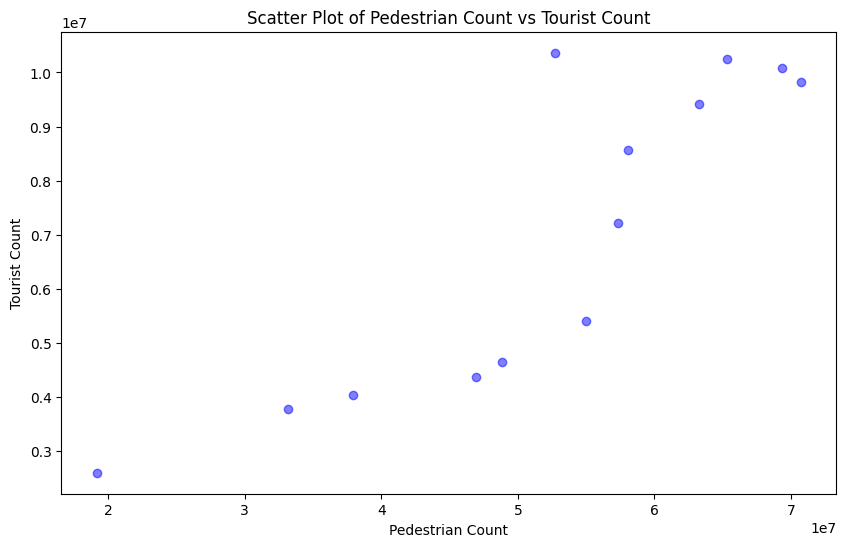

In [20]:
# Dataset merge for scatter plot
merged_data_1 = pd.merge(data_1_2, data_4_filtered, on='year_quarter', how='inner')
# Merged_data checking
print(merged_data_1)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data_1_2['pedestriancount'], data_4_filtered['visitor_count'], color='blue', alpha=0.5)
plt.title('Scatter Plot of Pedestrian Count vs Tourist Count')
plt.xlabel('Pedestrian Count')
plt.ylabel('Tourist Count')
plt.show()

The scatter plot above shows the linear relationship between the pedestrian data and tourist data

# Data analysis

**Pearson Correalation Analysis**

In [21]:
# Pearson Correlation Analysis(Pedestrian counting dataset and tourist dataset)
correlation = merged_data_1['pedestriancount'].corr(merged_data_1['visitor_count'])
print(f"Pearson Correlation Coefficient: {correlation}")

Pearson Correlation Coefficient: 0.9384815117290771


Conduct a Pearson correlation coefficient analysis on the total pedestrian data and tourist data for the same period. The result is very high, indicating a strong correlation.

**Regression Analysis**

In [22]:
# Regression model
# 'fpedestriancount' is independent variable, 'visitor_count' is dependent variable
X = merged_data_1[['pedestriancount']]
y = merged_data_1['visitor_count']
# Dataset split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Regression model fit
model = LinearRegression()
model.fit(X_train, y_train)
# Regression model predict
y_pred = model.predict(X_test)
r_squared = model.score(X, y)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
# Regression model results
print(merged_data_1)
print(f"Regression Coefficient: {model.coef_}")
print(f"R-squared: {r_squared}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error (MSE): {mse}")

   year_quarter  pedestriancount  visitor_count
0        2021Q3         19152943        4040786
1        2021Q4         33159337        4361704
2        2022Q1         37898480        4647179
3        2022Q2         46924338        5400025
4        2022Q3         48843359        7219067
5        2022Q4         54960213        8556485
6        2023Q1         57335887        9419538
7        2023Q2         58063867        9829835
8        2023Q3         63283379       10084297
9        2023Q4         70728077       10257111
10       2024Q1         69336334       10365636
Regression Coefficient: [0.19797284]
R-squared: 0.8006500040727327
Mean Absolute Error: 1423366.9560733212
Mean Squared Error (MSE): 3168240628361.365


Base on the Pearson correlation coefficient result indicating a strong correlation, conduct a regression analysis of the two datasets. Examine the regression coefficient to determine the relationship between the pedestrian data and tourist data, and review the MAE, MSE, and R-squared results to verify the accuracy of the analysis.

**Estimation of Regional Tourist Numbers Using the Regression Coefficient**

In [23]:
# Regression_coefficient
regression_coefficient = 0.198
# Estimation regional tourists numbers
data_1_1_estimation = data_1_1.copy()
data_1_1_estimation['estimated_tourist_count'] = data_1_1['pedestriancount'] * regression_coefficient
print(data_1_1_estimation.head(10))
print(data_1_1_estimation.shape)

  sensor_name  year_month                    location  pedestriancount  \
0   261Will_T  2022-11-30  -37.81295822, 144.95678789            91518   
1   261Will_T  2022-12-31  -37.81295822, 144.95678789            50214   
2   261Will_T  2023-01-31  -37.81295822, 144.95678789            38818   
3   261Will_T  2023-05-31  -37.81295822, 144.95678789           216910   
4   261Will_T  2023-06-30  -37.81295822, 144.95678789           288651   
5   261Will_T  2023-07-31  -37.81295822, 144.95678789           314142   
6   261Will_T  2023-08-31  -37.81295822, 144.95678789           343645   
7   261Will_T  2023-09-30  -37.81295822, 144.95678789           303683   
8   261Will_T  2023-10-31  -37.81295822, 144.95678789           328492   
9   261Will_T  2023-11-30  -37.81295822, 144.95678789           316824   

    latitude   longitude  estimated_tourist_count  
0 -37.812958  144.956788                18120.564  
1 -37.812958  144.956788                 9942.372  
2 -37.812958  144.956788     

Use the regression coefficient to extract the proportion of tourists for each sensor from the pedestrian data.

**Matching the closest pedestrian counting sensor to a tourist spot**

In [48]:
# Calculating the distance between the sensor location and tourist spots location using Haversine
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    a = np.sin(delta_phi / 2.0) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return R * c
# Matching tourist spots and the neartest sensor location
def match_closest_pedestrian_data(tourist_data, pedestrian_data):
    matches = []

    for _, tour_row in tourist_data.iterrows():
        min_distance = float('inf')
        closest_pedestrian = None

        for _, ped_row in pedestrian_data.iterrows():
            distance = haversine(tour_row['latitude'], tour_row['longitude'], ped_row['latitude'], ped_row['longitude'])
            if distance < min_distance:
                min_distance = distance
                closest_pedestrian = ped_row
        estimated_tourist_count = closest_pedestrian['pedestriancount'] * regression_coefficient

        matches.append({
            'tourist_location': tour_row['name'],
            'pedestrian_sensor': closest_pedestrian['sensor_name'],
            'pedestrian_count': closest_pedestrian['pedestriancount'],
            'distance_km': min_distance,
            'tour_latitude' : tour_row['latitude'],
            'tour_longitude' : tour_row['longitude'],
            'estimated_tourist_count' : estimated_tourist_count,
            })

    return pd.DataFrame(matches)
# Matching results
matched_data = match_closest_pedestrian_data(data_3_cleaned, data_1_1_estimation)
print(matched_data)
print(f"The number of matched data: {matched_data.shape[0]}")

                tourist_location pedestrian_sensor  pedestrian_count  \
0                       Blowhole           WebBN_T             80218   
1                      Bandstand          Bou231_T            178078   
2               Federation Bells      BirFed1120_T             88316   
3                   Coat of Arms          Swa123_T            257070   
4     Edmund Fitzgibbon Memorial             VAC_T            378528   
..                           ...               ...               ...   
256       Dinny O'Hearn Fountain          Lyg309_T            110294   
257  Westgarth Drinking Fountain          Spr201_T             68561   
258     Pioneer Women's Memorial             VAC_T            378528   
259                Painted Poles           SwaCs_T            152538   
260                        Angel      BirFed1120_T             88316   

     distance_km  tour_latitude  tour_longitude  estimated_tourist_count  
0       0.105429     -37.822018      144.946871             

Match each tourist spot with the nearest pedestrian sensor to estimate the number of tourists.

**Time series prediction**

In [25]:
# Preprocessing for time series prediction
data_1_3_estimation = data_1_3.copy()
data_1_3_estimation['year_day'] = pd.to_datetime(data_1_3_estimation['year_day'])
data_1_3_estimation['estimated_tourist_count'] = data_1_3['pedestriancount'] * regression_coefficient
# Drop duplicate sensor 'BirBridge_T'
data_1_3_estimation = data_1_3_estimation[data_1_3_estimation['sensor_name'] != 'BirBridge_T']

Processing sensor: 261Will_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor 261Will_T: 7026.453289049711
BIC for sensor 261Will_T: 7055.310738716312
RMSE for sensor 261Will_T: 1511.1323198827379
Forecast for sensor 261Will_T:
2024-02-29    2958.128539
2024-03-01    2277.846615
2024-03-02    1354.034462
2024-03-03    1870.068571
2024-03-04    2368.833645
                 ...     
2024-09-13    3029.898960
2024-09-14    2942.825294
2024-09-15    3001.606386
2024-09-16    2982.194376
2024-09-17    3058.640963
Freq: D, Name: predicted_mean, Length: 202, dtype: float64

Forecast Increase for sensor 261Will_T: 100.51242434579945



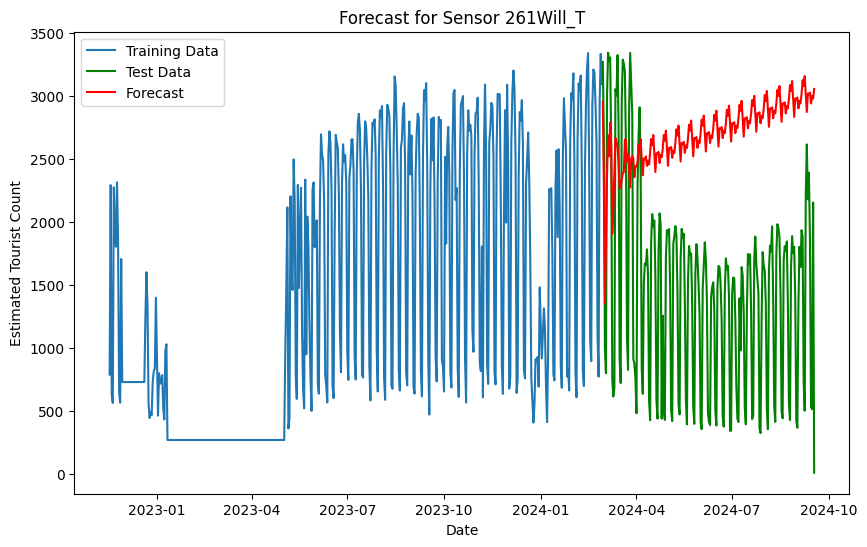

Processing sensor: 280Will_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor 280Will_T: 5890.875478785476
BIC for sensor 280Will_T: 5919.7329284520765
RMSE for sensor 280Will_T: 698.5605263485924
Forecast for sensor 280Will_T:
2024-02-29    234.624443
2024-03-01    204.916833
2024-03-02    159.874823
2024-03-03    196.698236
2024-03-04    165.566074
                 ...    
2024-09-13   -254.323835
2024-09-14   -257.643967
2024-09-15   -255.914096
2024-09-16   -252.780675
2024-09-17   -251.120044
Freq: D, Name: predicted_mean, Length: 202, dtype: float64

Forecast Increase for sensor 280Will_T: -485.7444864546457



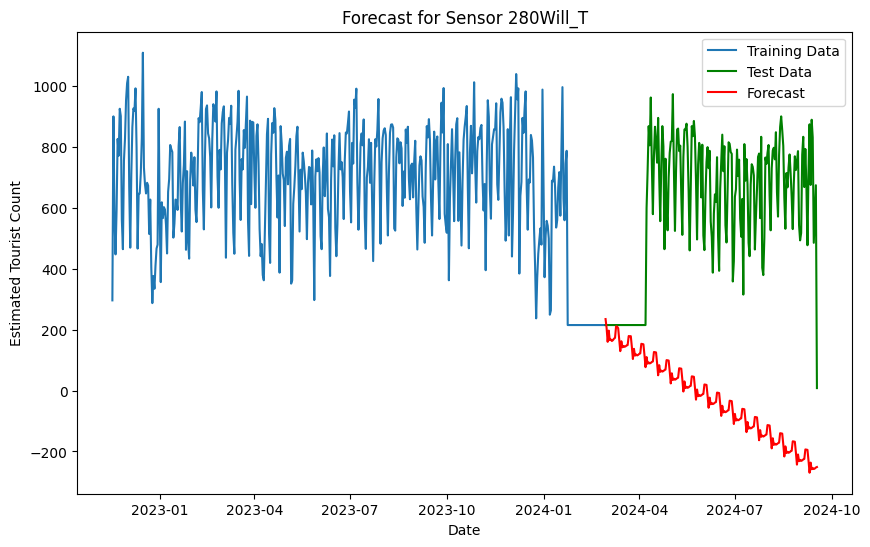

Processing sensor: 474Fl_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor 474Fl_T: 2697.335205115518
BIC for sensor 474Fl_T: 2720.630338297045
RMSE for sensor 474Fl_T: 166.60536942428251
Forecast for sensor 474Fl_T:
2024-06-16    829.618628
2024-06-17    814.165051
2024-06-18    754.447565
2024-06-19    729.296073
2024-06-20    716.673764
                 ...    
2024-09-13    811.476785
2024-09-14    768.027626
2024-09-15    746.754279
2024-09-16    780.489191
2024-09-17    795.153863
Freq: D, Name: predicted_mean, Length: 94, dtype: float64

Forecast Increase for sensor 474Fl_T: -34.46476454352353



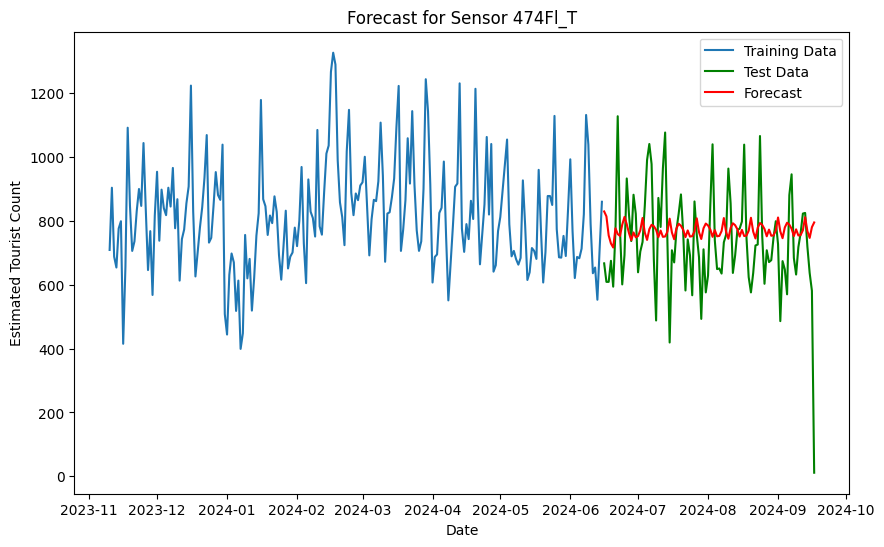

Processing sensor: 488Mac_T
AIC for sensor 488Mac_T: 7546.798768227697
BIC for sensor 488Mac_T: 7578.53529009323
RMSE for sensor 488Mac_T: 111.58130698598029
Forecast for sensor 488Mac_T:
2023-11-22    421.290905
2023-11-23    426.814054
2023-11-24    445.853751
2023-11-25    431.060836
2023-11-26    440.632084
                 ...    
2024-09-13    482.019643
2024-09-14    491.343104
2024-09-15    486.866084
2024-09-16    482.180536
2024-09-17    479.362252
Freq: D, Name: predicted_mean, Length: 301, dtype: float64

Forecast Increase for sensor 488Mac_T: 58.07134636677921



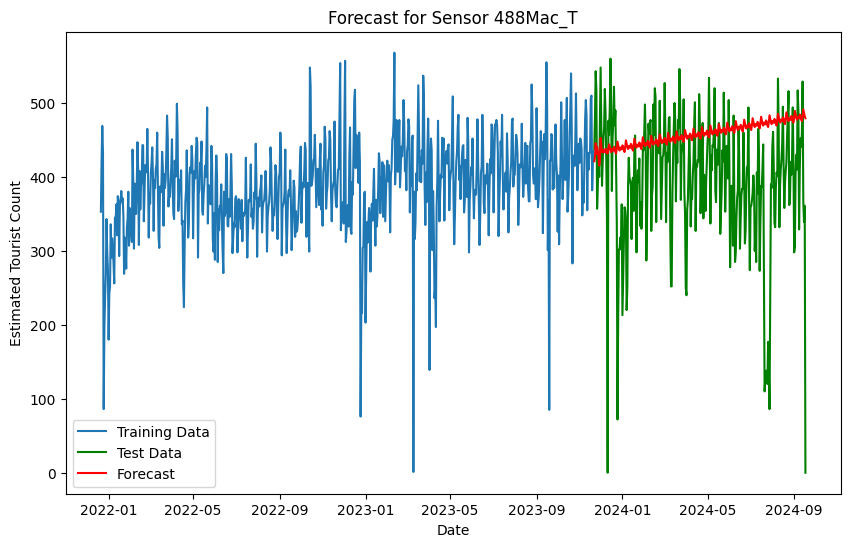

Processing sensor: 574Qub_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor 574Qub_T: 7342.032735903962
BIC for sensor 574Qub_T: 7373.769257769495
RMSE for sensor 574Qub_T: 73.01348328077825
Forecast for sensor 574Qub_T:
2023-11-22    234.745747
2023-11-23    245.834492
2023-11-24    245.608910
2023-11-25    254.030389
2023-11-26    254.698691
                 ...    
2024-09-13    236.256066
2024-09-14    236.352963
2024-09-15    238.587049
2024-09-16    236.454078
2024-09-17    224.248055
Freq: D, Name: predicted_mean, Length: 301, dtype: float64

Forecast Increase for sensor 574Qub_T: -10.497692136336497



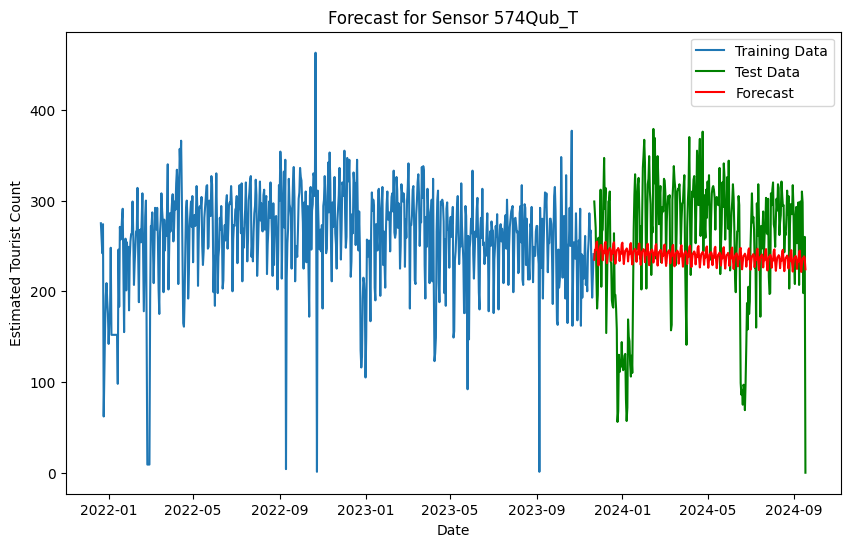

Processing sensor: ACMI_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor ACMI_T: 12480.645958904983
BIC for sensor ACMI_T: 12513.516551324392
RMSE for sensor ACMI_T: 942.2366616533537
Forecast for sensor ACMI_T:
2023-10-01    2211.387470
2023-10-02    2037.754378
2023-10-03    2141.445812
2023-10-04    2191.600717
2023-10-05    2409.819648
                 ...     
2024-09-13    2689.532577
2024-09-14    2755.782696
2024-09-15    2909.438537
2024-09-16    2861.295840
2024-09-17    2788.074379
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor ACMI_T: 576.6869092576485



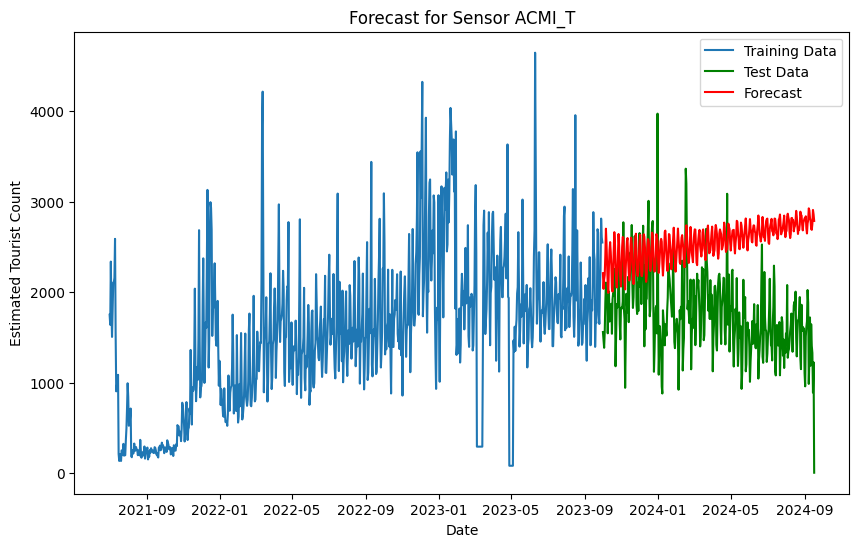

Processing sensor: AG_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor AG_T: 13667.671057793334
BIC for sensor AG_T: 13700.541650212743
RMSE for sensor AG_T: 1094.128882335138
Forecast for sensor AG_T:
2023-10-01    2213.938201
2023-10-02    2032.961600
2023-10-03    1968.677605
2023-10-04    1587.478091
2023-10-05    1568.913740
                 ...     
2024-09-13    2193.194025
2024-09-14    2141.516575
2024-09-15    2166.164648
2024-09-16    1841.209335
2024-09-17    1859.441922
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor AG_T: -354.4962792515116



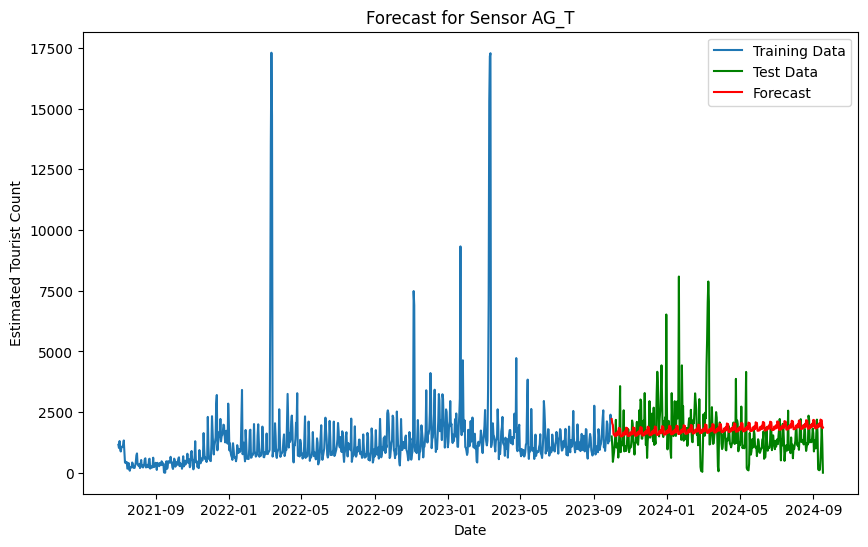

Processing sensor: AlfPl_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor AlfPl_T: 10085.103814417285
BIC for sensor AlfPl_T: 10117.974406836694
RMSE for sensor AlfPl_T: 232.75648051999664
Forecast for sensor AlfPl_T:
2023-10-01    436.940971
2023-10-02    553.159855
2023-10-03    596.241807
2023-10-04    592.038288
2023-10-05    530.731526
                 ...    
2024-09-13    606.809043
2024-09-14    611.669968
2024-09-15    598.281874
2024-09-16    615.985656
2024-09-17    594.782422
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor AlfPl_T: 157.8414509927755



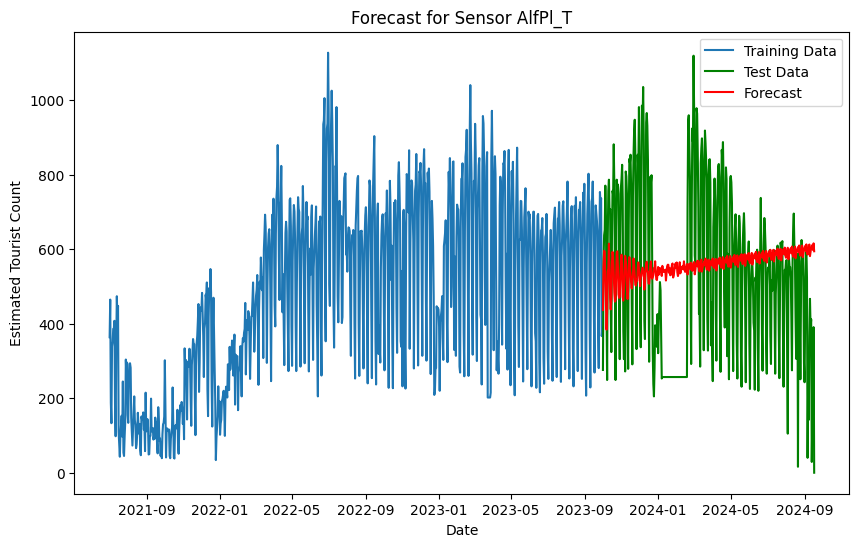

Processing sensor: BirArt1109_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


AIC for sensor BirArt1109_T: 956.1690151018729
BIC for sensor BirArt1109_T: 970.8294270374276
RMSE for sensor BirArt1109_T: 442.9249543675149
Forecast for sensor BirArt1109_T:
2024-08-16     988.810964
2024-08-17     652.606277
2024-08-18     728.489561
2024-08-19     641.428981
2024-08-20     642.115267
2024-08-21    1139.273023
2024-08-22     830.915185
2024-08-23    1432.328409
2024-08-24     842.953869
2024-08-25     877.438840
2024-08-26     900.879740
2024-08-27     770.718593
2024-08-28     887.326743
2024-08-29     768.039704
2024-08-30     705.910401
2024-08-31     706.217852
2024-09-01     651.287145
2024-09-02    1177.076864
2024-09-03     860.709042
2024-09-04    1498.350877
2024-09-05     869.545729
2024-09-06     909.696156
2024-09-07     929.320876
2024-09-08     802.940549
2024-09-09     920.660458
2024-09-10     798.948120
2024-09-11     738.369114
2024-09-12     737.692263
2024-09-13     683.391093
2024-09-14    1208.879279
2024-09-15     892.552109
2024-09-16    1529

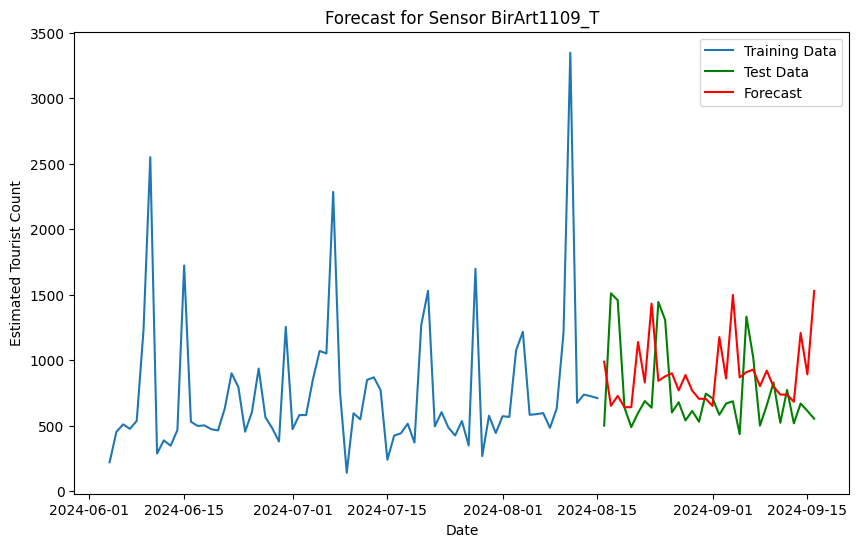

Processing sensor: BirFed1120_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor BirFed1120_T: 3364.9341443255435
BIC for sensor BirFed1120_T: 3388.363897040566
RMSE for sensor BirFed1120_T: 557.2038567633205
Forecast for sensor BirFed1120_T:
2024-06-13    460.393231
2024-06-14    706.954203
2024-06-15    839.023079
2024-06-16    792.986733
2024-06-17    672.864418
                 ...    
2024-09-12    687.916497
2024-09-13    678.363344
2024-09-14    770.623048
2024-09-15    759.059300
2024-09-16    717.599718
Freq: D, Name: predicted_mean, Length: 96, dtype: float64

Forecast Increase for sensor BirFed1120_T: 257.20648658525795



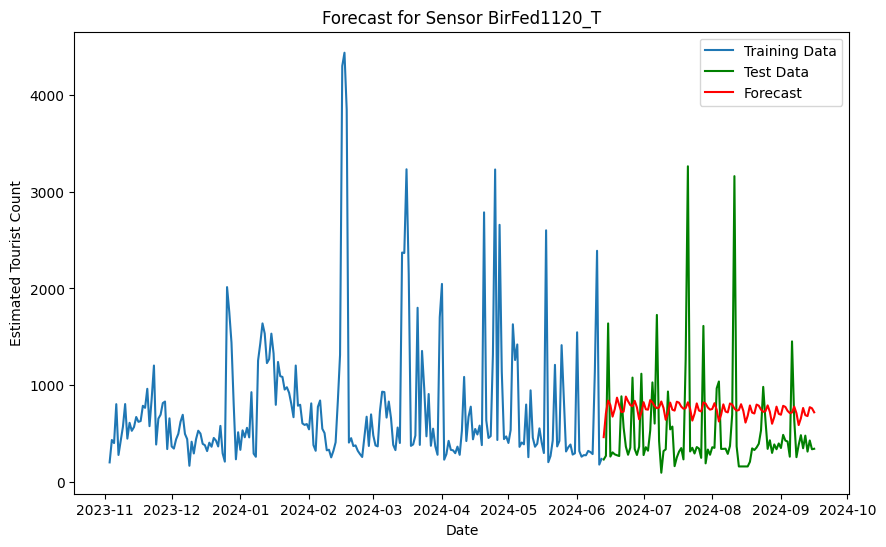

Processing sensor: Bou231_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Bou231_T: 11956.855181168994
BIC for sensor Bou231_T: 11989.725773588403
RMSE for sensor Bou231_T: 715.5533563500785
Forecast for sensor Bou231_T:
2023-10-01    1923.998335
2023-10-02    1918.734200
2023-10-03    1932.407043
2023-10-04    1840.279007
2023-10-05    1833.852886
                 ...     
2024-09-13    2287.117458
2024-09-14    2244.432852
2024-09-15    2263.083414
2024-09-16    2207.823128
2024-09-17    2225.355281
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Bou231_T: 301.3569463905783



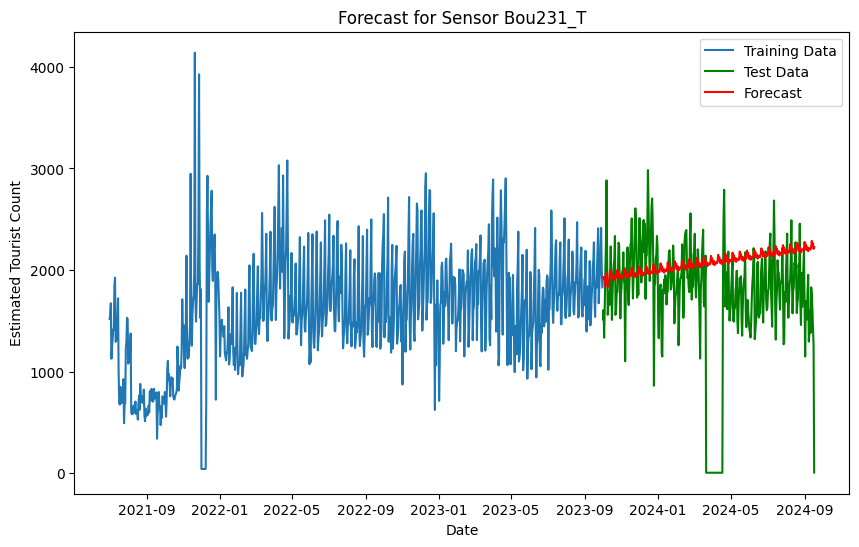

Processing sensor: Bou283_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Bou283_T: 12552.747689980355
BIC for sensor Bou283_T: 12585.618282399764
RMSE for sensor Bou283_T: 1187.4676361135944
Forecast for sensor Bou283_T:
2023-10-01    2883.126370
2023-10-02    3279.205315
2023-10-03    3462.738333
2023-10-04    3336.364025
2023-10-05    3293.769262
                 ...     
2024-09-13    3769.056524
2024-09-14    3794.494893
2024-09-15    3767.481414
2024-09-16    3657.449570
2024-09-17    3744.194329
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Bou283_T: 861.0679590603677



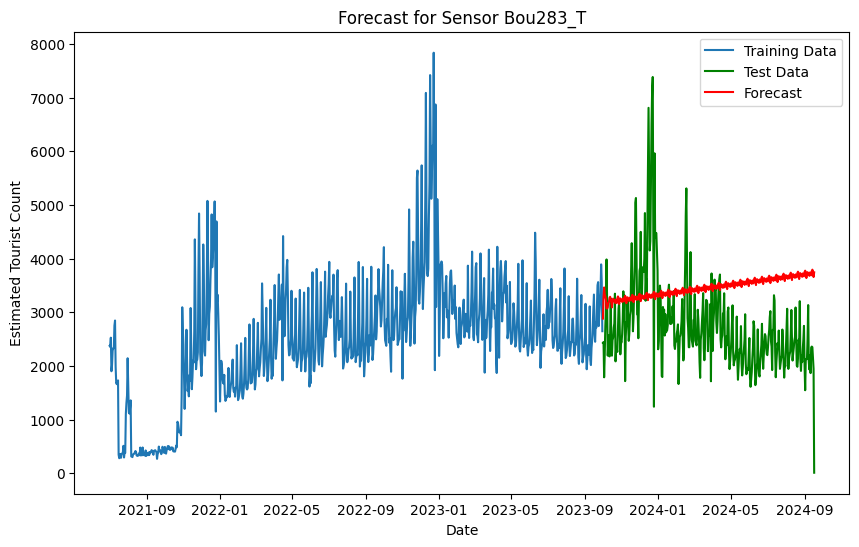

Processing sensor: Bou292_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Bou292_T: 12940.607533550628
BIC for sensor Bou292_T: 12973.478125970038
RMSE for sensor Bou292_T: 1249.1253237095927
Forecast for sensor Bou292_T:
2023-10-01    3487.099093
2023-10-02    3266.418029
2023-10-03    3269.310105
2023-10-04    3015.800792
2023-10-05    3326.546792
                 ...     
2024-09-13    3958.879798
2024-09-14    3883.644830
2024-09-15    3954.609502
2024-09-16    3858.489209
2024-09-17    3981.771388
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Bou292_T: 494.67229532426563



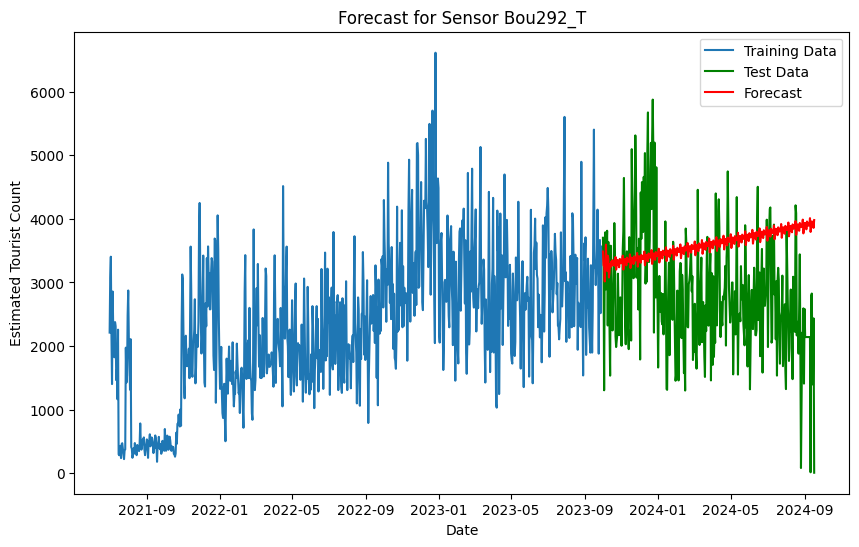

Processing sensor: Bou688_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Bou688_T: 11902.538262906603
BIC for sensor Bou688_T: 11935.408855326012
RMSE for sensor Bou688_T: 821.4591814485743
Forecast for sensor Bou688_T:
2023-10-01    2797.120677
2023-10-02    3160.331791
2023-10-03    3214.827482
2023-10-04    3158.189966
2023-10-05    3203.284113
                 ...     
2024-09-13    3670.656892
2024-09-14    3669.646320
2024-09-15    3644.109373
2024-09-16    3692.777580
2024-09-17    3678.177320
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Bou688_T: 881.0566429147311



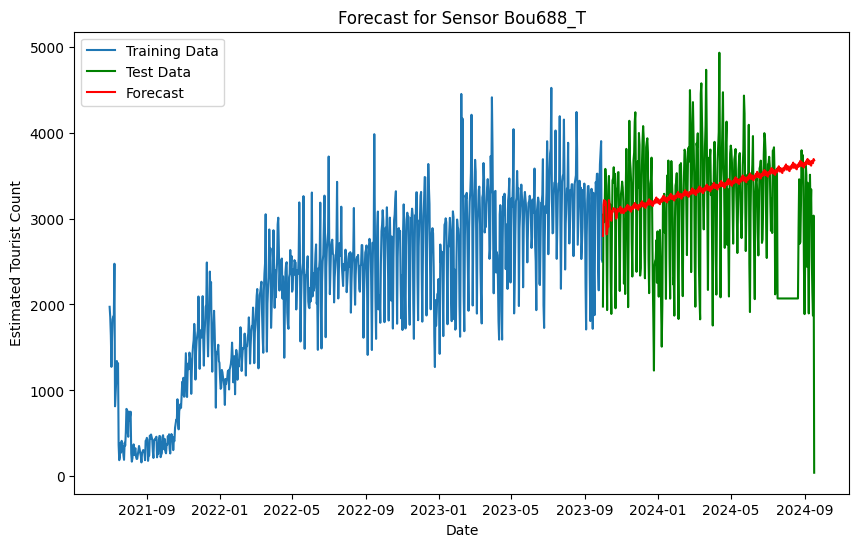

Processing sensor: Bou892T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


AIC for sensor Bou892T: 2292.685985275075
BIC for sensor Bou892T: 2316.991879990775
RMSE for sensor Bou892T: 44.394467337990214
Forecast for sensor Bou892T:
2024-06-02     72.707011
2024-06-03     74.029510
2024-06-04     81.502441
2024-06-05     71.319123
2024-06-06     70.569573
                 ...    
2024-09-13     99.967453
2024-09-14     97.881895
2024-09-15     95.535014
2024-09-16    101.982417
2024-09-17    104.280007
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor Bou892T: 31.57299564079476



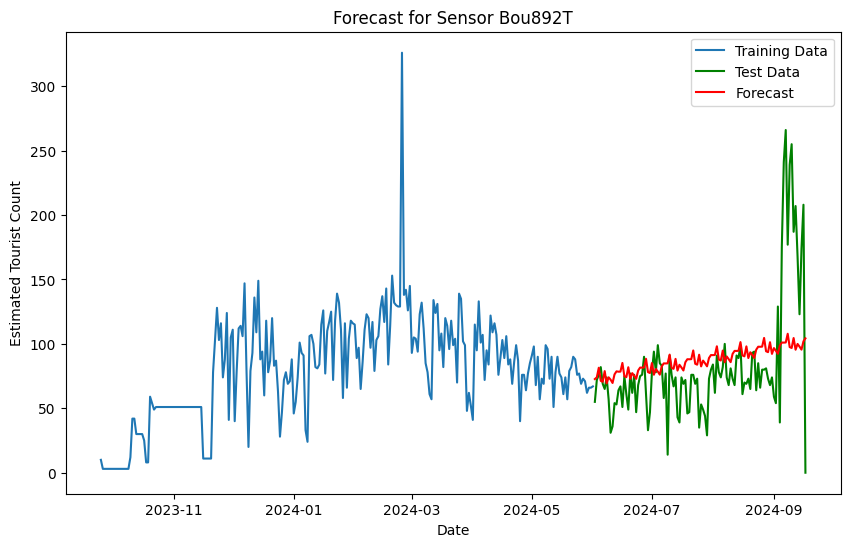

Processing sensor: BouHbr2353_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor BouHbr2353_T: 2516.762488036422
BIC for sensor BouHbr2353_T: 2540.2254949707544
RMSE for sensor BouHbr2353_T: 74.83968170010012
Forecast for sensor BouHbr2353_T:
2024-06-14    135.169930
2024-06-15     79.551661
2024-06-16    137.762460
2024-06-17    138.333086
2024-06-18    138.816087
                 ...    
2024-09-13    111.213568
2024-09-14     84.416350
2024-09-15     92.945810
2024-09-16     75.914942
2024-09-17     88.998995
Freq: D, Name: predicted_mean, Length: 96, dtype: float64

Forecast Increase for sensor BouHbr2353_T: -46.170934884289466



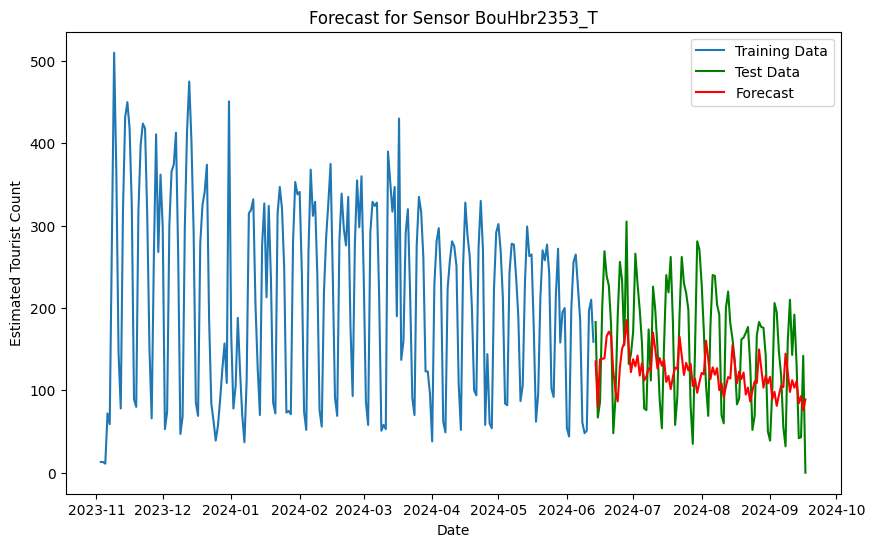

Processing sensor: BouHbr_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor BouHbr_T: 10294.815117530628
BIC for sensor BouHbr_T: 10327.685709950038
RMSE for sensor BouHbr_T: 188.76522736647883
Forecast for sensor BouHbr_T:
2023-10-01    378.811477
2023-10-02    403.796902
2023-10-03    427.834795
2023-10-04    449.696439
2023-10-05    451.659978
                 ...    
2024-09-13    493.138518
2024-09-14    474.064813
2024-09-15    480.140705
2024-09-16    487.453907
2024-09-17    475.553845
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor BouHbr_T: 96.74236724663302



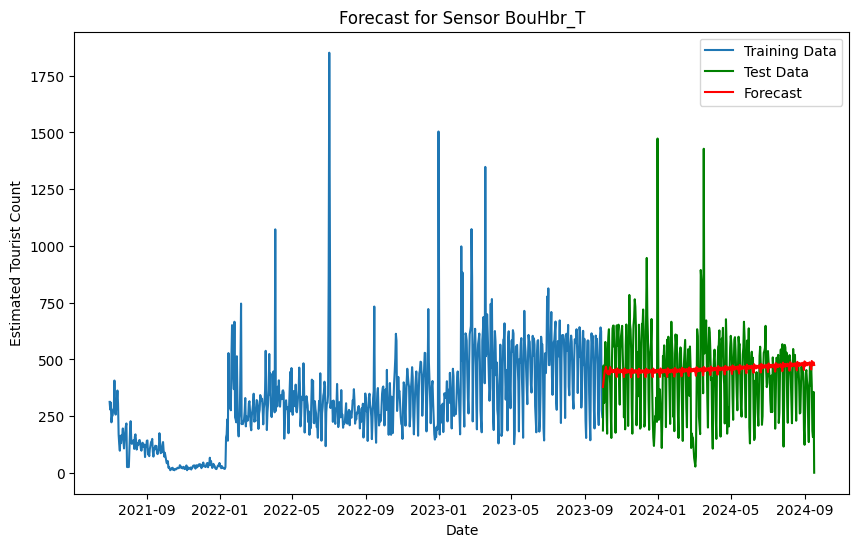

Processing sensor: Boyd2837_T
AIC for sensor Boyd2837_T: 2301.496730670533
BIC for sensor Boyd2837_T: 2324.79186385206
RMSE for sensor Boyd2837_T: 187.18647869759855
Forecast for sensor Boyd2837_T:
2024-06-15    283.912198
2024-06-16    277.251563
2024-06-17    261.917437
2024-06-18    262.175408
2024-06-19    263.642877
                 ...    
2024-09-12    141.699125
2024-09-13    134.766378
2024-09-14    136.649249
2024-09-15    114.277464
2024-09-16    156.193048
Freq: D, Name: predicted_mean, Length: 94, dtype: float64

Forecast Increase for sensor Boyd2837_T: -127.71915046082935



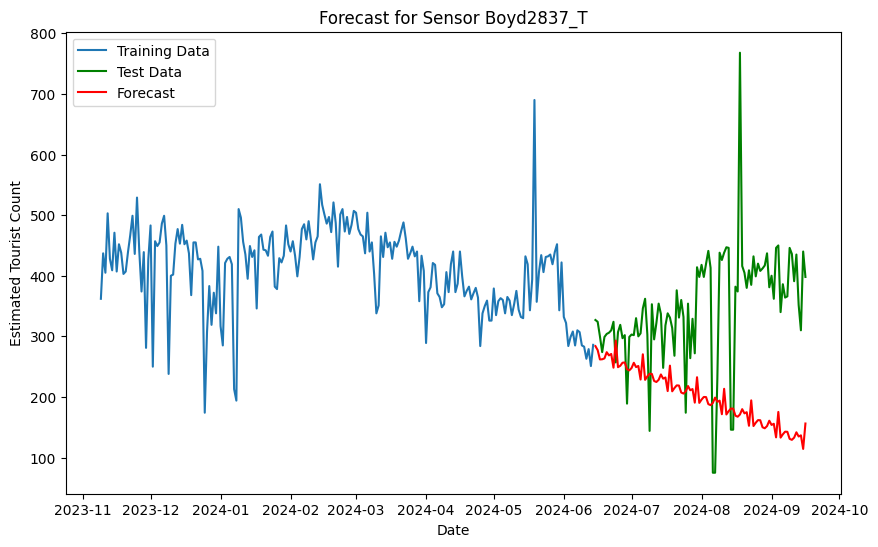

Processing sensor: Col12_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Col12_T: 11291.49536776317
BIC for sensor Col12_T: 11324.365960182578
RMSE for sensor Col12_T: 479.67520711553584
Forecast for sensor Col12_T:
2023-10-01     584.778544
2023-10-02    1101.324035
2023-10-03    1268.811618
2023-10-04    1226.159853
2023-10-05    1140.714480
                 ...     
2024-09-13    1093.245909
2024-09-14    1076.778600
2024-09-15    1064.041175
2024-09-16    1068.921766
2024-09-17    1063.566402
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col12_T: 478.78785749055817



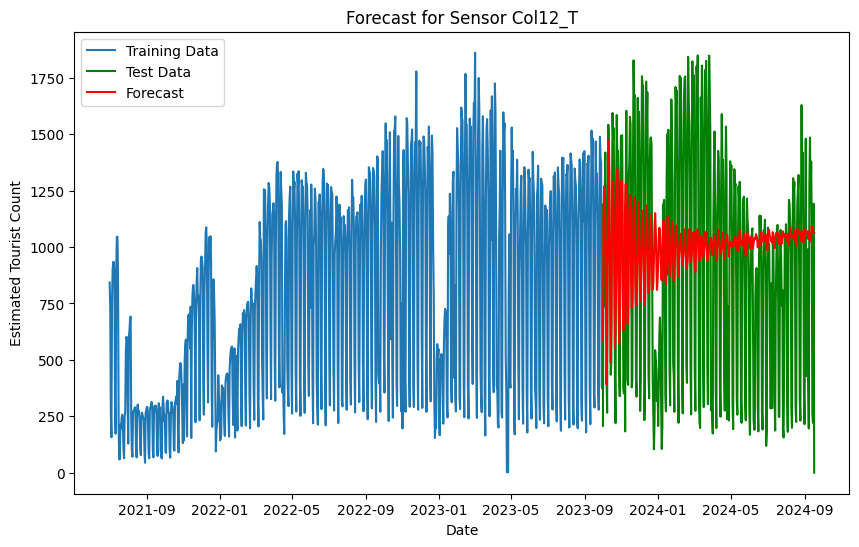

Processing sensor: Col15_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Col15_T: 11891.097811731368
BIC for sensor Col15_T: 11923.968404150777
RMSE for sensor Col15_T: 602.971678410847
Forecast for sensor Col15_T:
2023-10-01    1110.061897
2023-10-02    1878.427432
2023-10-03    2287.865049
2023-10-04    2389.216788
2023-10-05    2230.759937
                 ...     
2024-09-13    2799.069029
2024-09-14    2236.301079
2024-09-15    1575.265546
2024-09-16    1352.542994
2024-09-17    1670.568147
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col15_T: 560.5062499489823



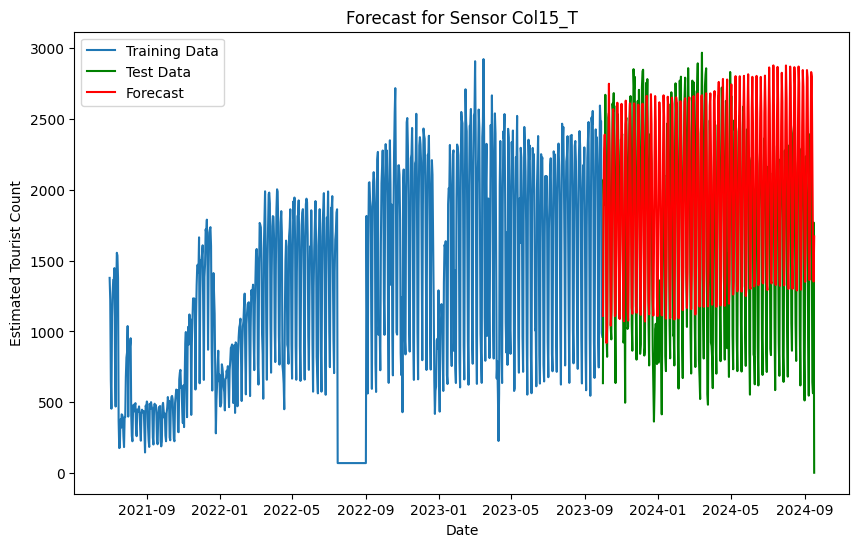

Processing sensor: Col254_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor Col254_T: 12052.372892703823
BIC for sensor Col254_T: 12085.243485123232
RMSE for sensor Col254_T: 692.4869634533968
Forecast for sensor Col254_T:
2023-10-01    2525.896382
2023-10-02    2771.485949
2023-10-03    2808.305245
2023-10-04    2725.412387
2023-10-05    2691.994960
                 ...     
2024-09-13    3039.727207
2024-09-14    3060.612531
2024-09-15    3034.949007
2024-09-16    2997.739334
2024-09-17    3021.360934
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col254_T: 495.4645524315665



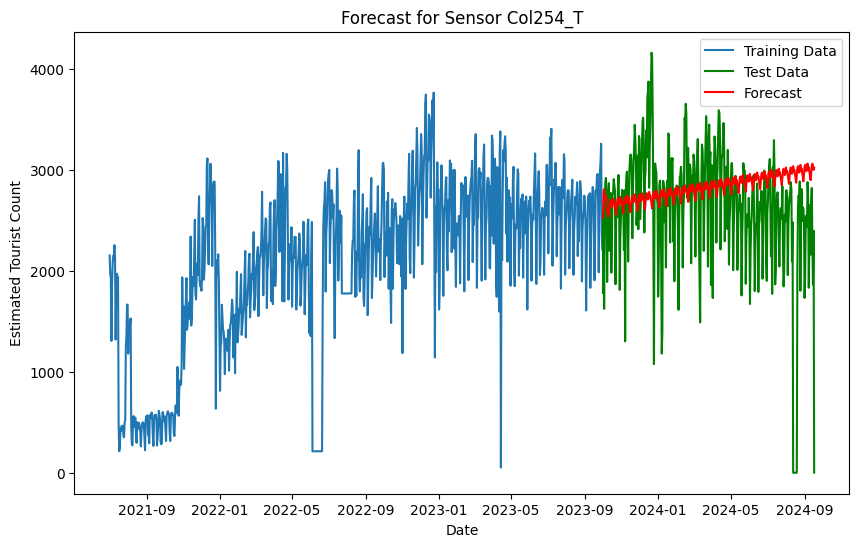

Processing sensor: Col620_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Col620_T: 12600.74866003705
BIC for sensor Col620_T: 12633.61925245646
RMSE for sensor Col620_T: 976.3728483209695
Forecast for sensor Col620_T:
2023-10-01    2960.432948
2023-10-02    3473.096329
2023-10-03    4297.476793
2023-10-04    4703.395128
2023-10-05    4615.035856
                 ...     
2024-09-13    4272.338139
2024-09-14    4160.497685
2024-09-15    4195.756158
2024-09-16    4328.932086
2024-09-17    4354.897126
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col620_T: 1394.4641775457821



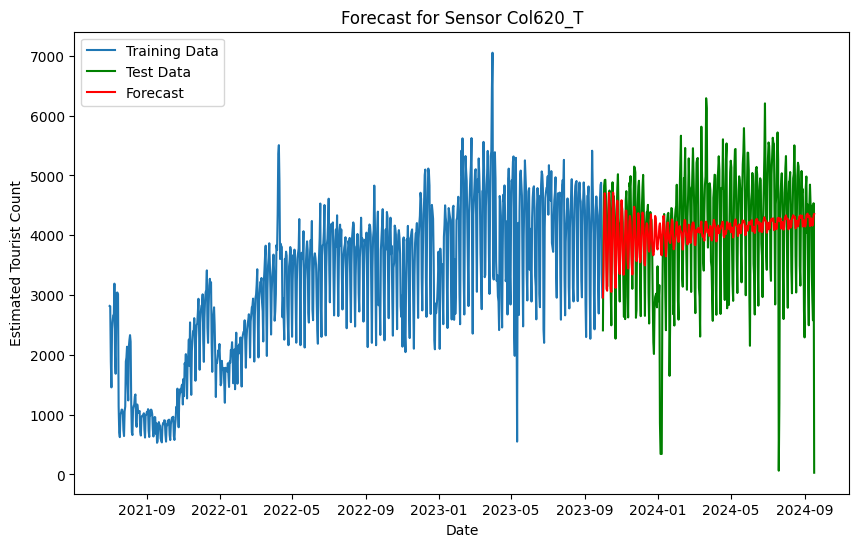

Processing sensor: Col623_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Col623_T: 11572.938419066788
BIC for sensor Col623_T: 11605.809011486197
RMSE for sensor Col623_T: 843.9268841613589
Forecast for sensor Col623_T:
2023-10-01     761.098600
2023-10-02     915.889406
2023-10-03    1061.403970
2023-10-04    1314.191496
2023-10-05    1558.286501
                 ...     
2024-09-13    1006.480140
2024-09-14     618.430234
2024-09-15     300.698956
2024-09-16     295.468395
2024-09-17     664.772768
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col623_T: -96.32583236787764



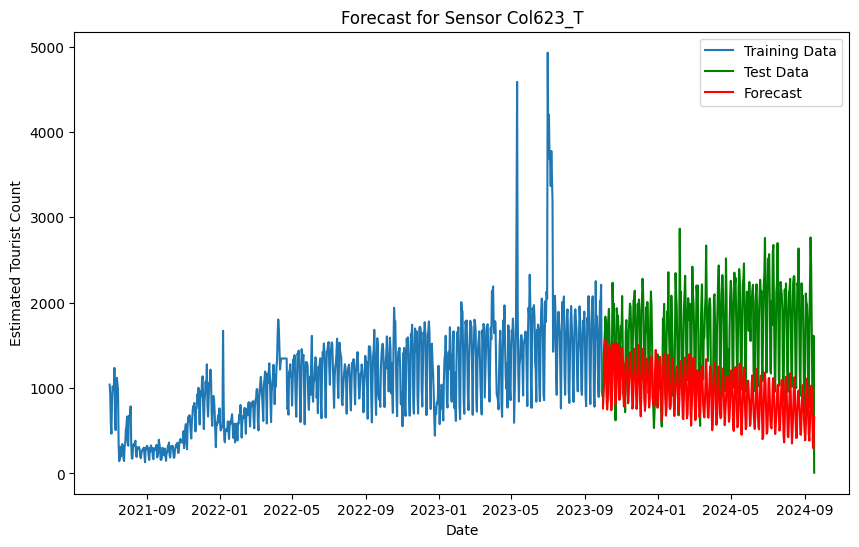

Processing sensor: Col700_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Col700_T: 12607.898835496257
BIC for sensor Col700_T: 12640.769427915666
RMSE for sensor Col700_T: 1753.170327094506
Forecast for sensor Col700_T:
2023-10-01    1164.623994
2023-10-02    2678.962159
2023-10-03    3316.172032
2023-10-04    3287.723553
2023-10-05    2398.060937
                 ...     
2024-09-13    1457.370302
2024-09-14    1466.767557
2024-09-15    2442.579646
2024-09-16    3749.375195
2024-09-17    4187.920537
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Col700_T: 3023.2965429532132



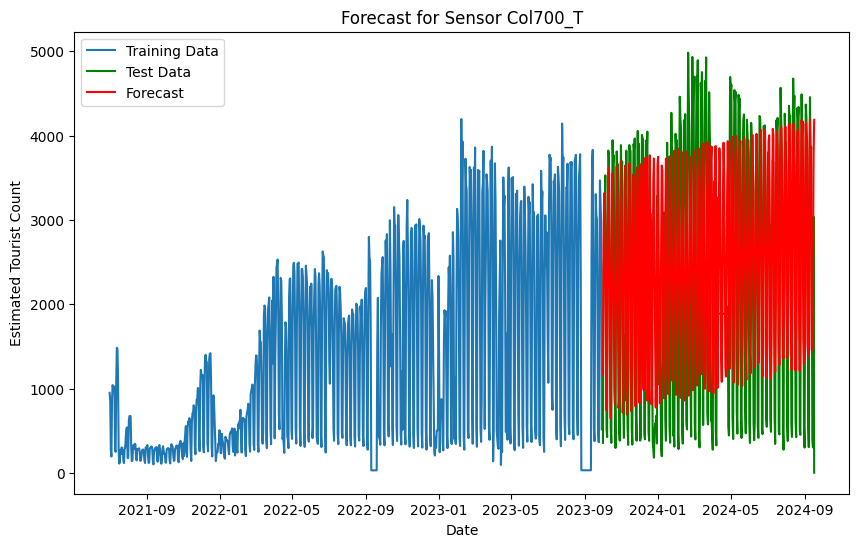

Processing sensor: ElFi_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor ElFi_T: 12662.183016986497
BIC for sensor ElFi_T: 12695.053609405906
RMSE for sensor ElFi_T: 1069.8366325479149
Forecast for sensor ElFi_T:
2023-10-01    5491.329054
2023-10-02    5638.521574
2023-10-03    5880.501016
2023-10-04    5980.997127
2023-10-05    6062.480459
                 ...     
2024-09-13    6692.595642
2024-09-14    6725.142559
2024-09-15    6751.200790
2024-09-16    6718.193248
2024-09-17    6652.436319
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor ElFi_T: 1161.1072653598321



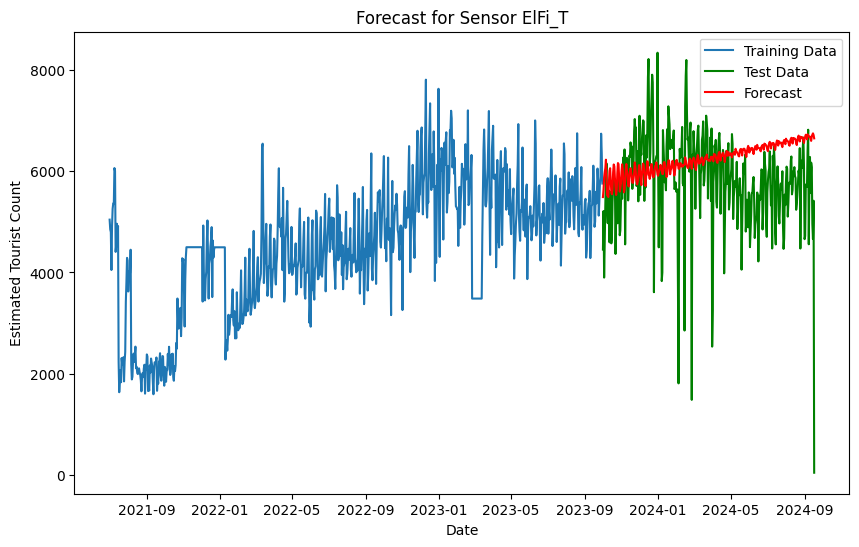

Processing sensor: Eli250_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Eli250_T: 12699.50699839522
BIC for sensor Eli250_T: 12732.377590814629
RMSE for sensor Eli250_T: 1075.2374765607822
Forecast for sensor Eli250_T:
2023-10-01    4535.716020
2023-10-02    4746.725302
2023-10-03    4622.910670
2023-10-04    4535.395342
2023-10-05    4410.215032
                 ...     
2024-09-13    5634.569063
2024-09-14    5705.579366
2024-09-15    5659.433890
2024-09-16    5595.306669
2024-09-17    5500.205589
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Eli250_T: 964.4895693160288



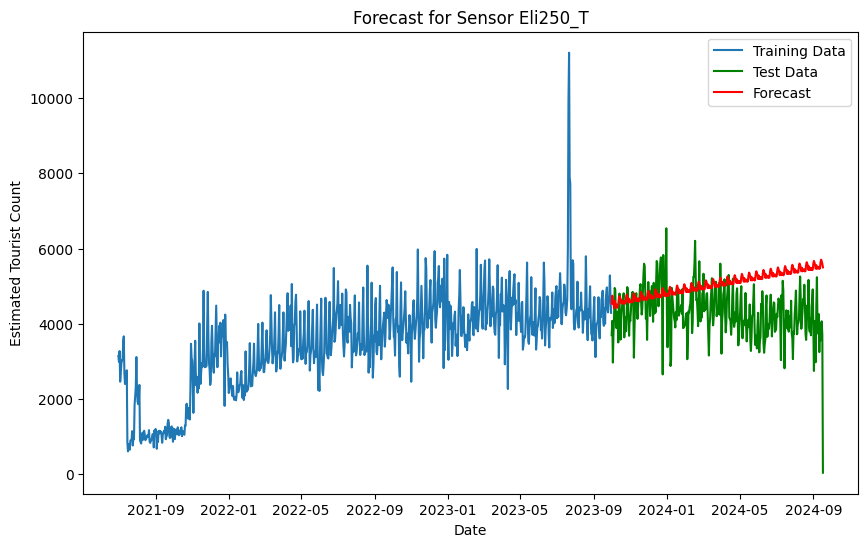

Processing sensor: Eli263_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor Eli263_T: 11440.969737554376
BIC for sensor Eli263_T: 11473.840329973786
RMSE for sensor Eli263_T: 550.4234605080887
Forecast for sensor Eli263_T:
2023-10-01    2030.492627
2023-10-02    2034.412409
2023-10-03    1999.632706
2023-10-04    1990.936467
2023-10-05    1981.909428
                 ...     
2024-09-13    2429.919174
2024-09-14    2434.599328
2024-09-15    2406.082152
2024-09-16    2409.406384
2024-09-17    2397.591089
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Eli263_T: 367.0984623280608



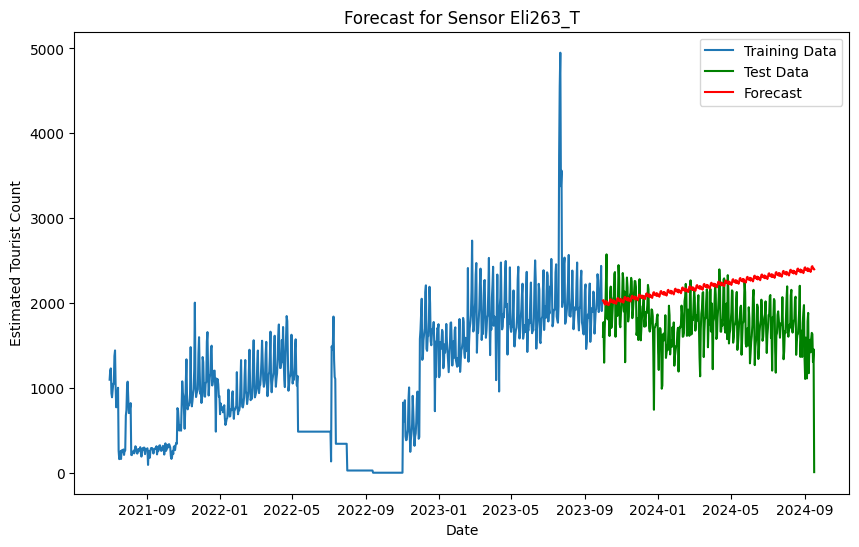

Processing sensor: Eli380_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Eli380_T: 10800.07700290345
BIC for sensor Eli380_T: 10832.189853007223
RMSE for sensor Eli380_T: 2620.2102647194006
Forecast for sensor Eli380_T:
2023-07-10    4902.804955
2023-07-11    5001.231908
2023-07-12    4975.729120
2023-07-13    4976.173610
2023-07-14    5071.452013
                 ...     
2024-05-18    5891.927509
2024-05-19    5853.790025
2024-05-20    5881.413771
2024-05-21    5888.886797
2024-05-22    5794.458330
Freq: D, Name: predicted_mean, Length: 318, dtype: float64

Forecast Increase for sensor Eli380_T: 891.653374762288



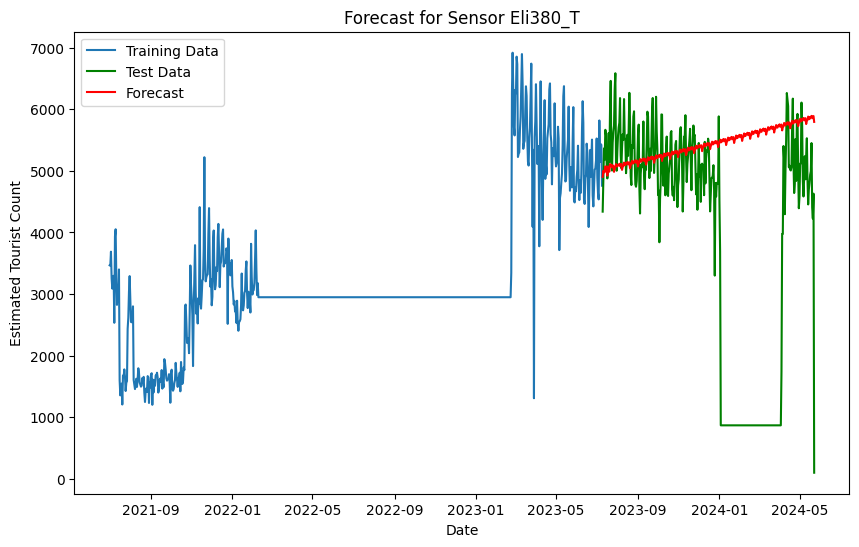

Processing sensor: Eli501_T
AIC for sensor Eli501_T: 11087.771172962879
BIC for sensor Eli501_T: 11120.641765382288
RMSE for sensor Eli501_T: 501.7590825797819
Forecast for sensor Eli501_T:
2023-10-01    1172.361427
2023-10-02     964.933900
2023-10-03    1110.387435
2023-10-04    1231.149377
2023-10-05    1118.838973
                 ...     
2024-09-13    1255.531901
2024-09-14    1421.860445
2024-09-15    1479.447025
2024-09-16    1266.495464
2024-09-17    1318.122168
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Eli501_T: 145.7607410007795



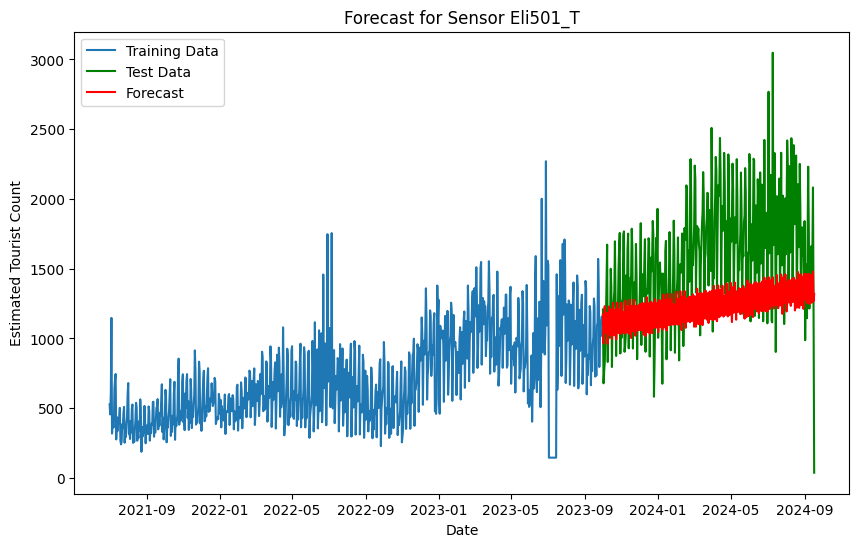

Processing sensor: EntPark1671_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor EntPark1671_T: 1449.6878872140603
BIC for sensor EntPark1671_T: 1472.6703133152262
RMSE for sensor EntPark1671_T: 14.230070906652871
Forecast for sensor EntPark1671_T:
2024-06-19    19.786623
2024-06-20    20.284785
2024-06-21    16.775178
2024-06-22    17.740109
2024-06-23    16.306501
                ...    
2024-09-12    14.371406
2024-09-13    11.119033
2024-09-14    11.860693
2024-09-15    10.077847
2024-09-16     9.776562
Freq: D, Name: predicted_mean, Length: 90, dtype: float64

Forecast Increase for sensor EntPark1671_T: -10.010061463655868



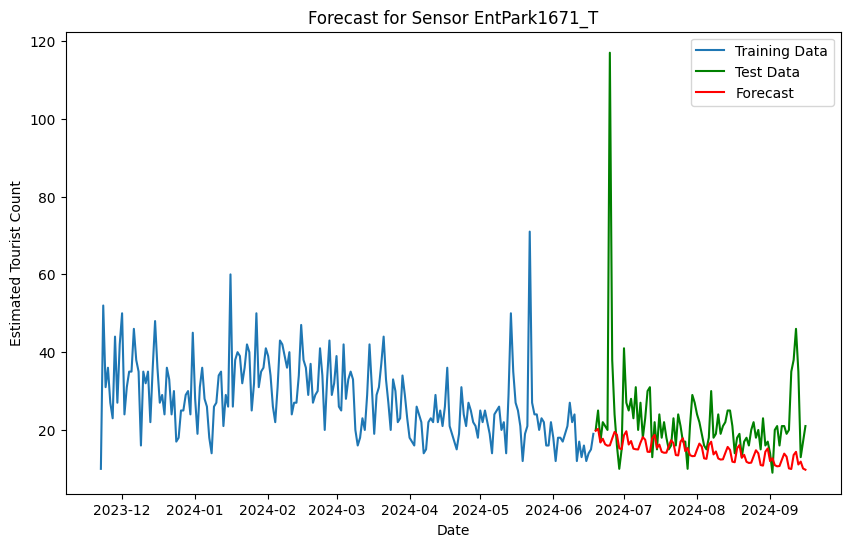

Processing sensor: Errol20_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Errol20_T: 9820.815109224131
BIC for sensor Errol20_T: 9853.68570164354
RMSE for sensor Errol20_T: 144.0144471003499
Forecast for sensor Errol20_T:
2023-10-01    744.453180
2023-10-02    778.437855
2023-10-03    787.463209
2023-10-04    748.506695
2023-10-05    769.281694
                 ...    
2024-09-13    840.372723
2024-09-14    848.724496
2024-09-15    848.737045
2024-09-16    837.009116
2024-09-17    842.437775
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Errol20_T: 97.98459545369155



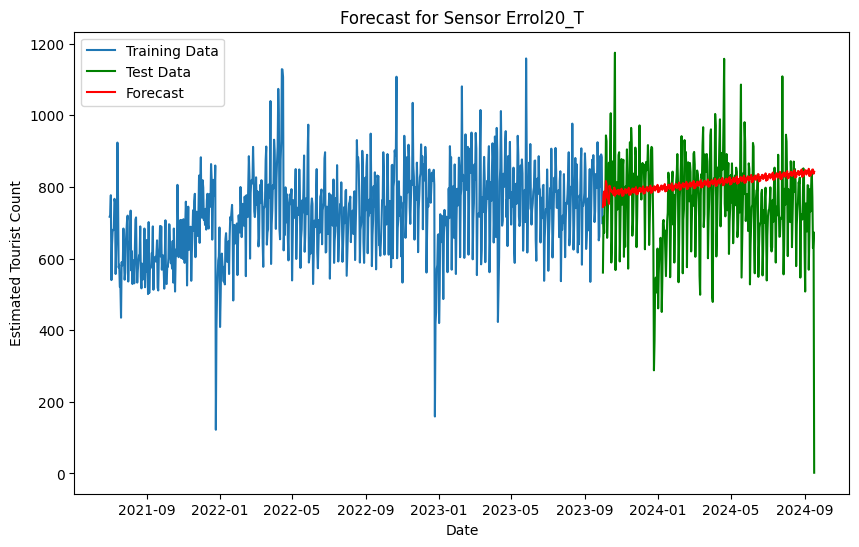

Processing sensor: Errol23_T
AIC for sensor Errol23_T: 6790.905726358234
BIC for sensor Errol23_T: 6821.483036662687
RMSE for sensor Errol23_T: 91.87517128178584
Forecast for sensor Errol23_T:
2024-01-06    612.870565
2024-01-07    548.171475
2024-01-08    515.268771
2024-01-09    515.662884
2024-01-10    524.299287
                 ...    
2024-09-13    513.037893
2024-09-14    515.338065
2024-09-15    497.897470
2024-09-16    502.100971
2024-09-17    501.159925
Freq: D, Name: predicted_mean, Length: 256, dtype: float64

Forecast Increase for sensor Errol23_T: -111.71064055570804



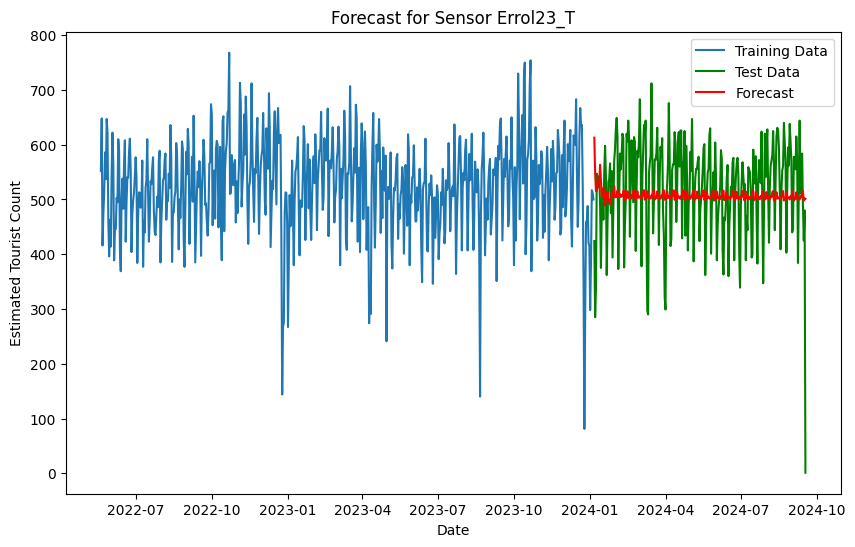

Processing sensor: FLDegC_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor FLDegC_T: 9826.779950341312
BIC for sensor FLDegC_T: 9859.65054276072
RMSE for sensor FLDegC_T: 151.47834717154365
Forecast for sensor FLDegC_T:
2023-10-01    676.709728
2023-10-02    698.663155
2023-10-03    711.141689
2023-10-04    683.970058
2023-10-05    696.082573
                 ...    
2024-09-13    817.261575
2024-09-14    821.728024
2024-09-15    811.381586
2024-09-16    809.699881
2024-09-17    818.915272
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor FLDegC_T: 142.20554482182524



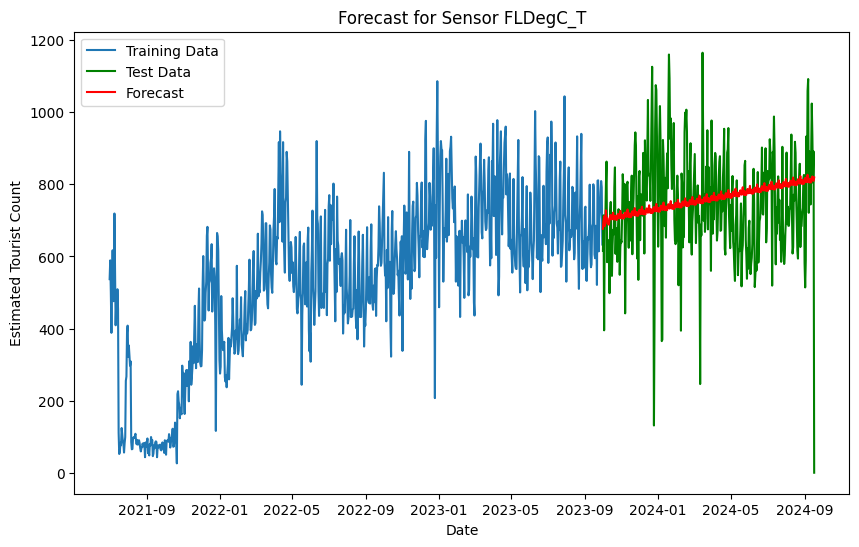

Processing sensor: FLDegN_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor FLDegN_T: 9845.714276174465
BIC for sensor FLDegN_T: 9878.584868593874
RMSE for sensor FLDegN_T: 175.9374982753625
Forecast for sensor FLDegN_T:
2023-10-01    816.001350
2023-10-02    818.256911
2023-10-03    829.920191
2023-10-04    820.946956
2023-10-05    834.187924
                 ...    
2024-09-13    921.047091
2024-09-14    908.648806
2024-09-15    910.182737
2024-09-16    901.887548
2024-09-17    903.985385
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor FLDegN_T: 87.98403594590911



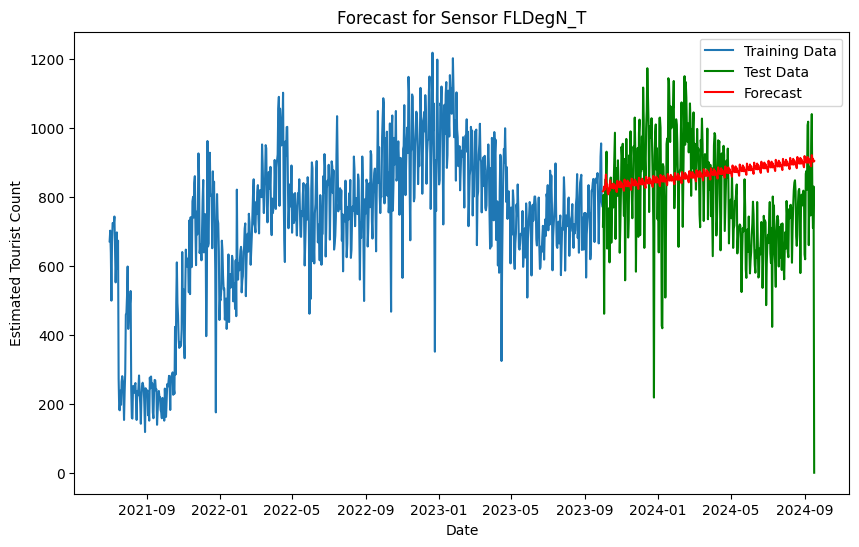

Processing sensor: FLDegS_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor FLDegS_T: 11330.348729289915
BIC for sensor FLDegS_T: 11363.219321709325
RMSE for sensor FLDegS_T: 650.8751746488354
Forecast for sensor FLDegS_T:
2023-10-01    2316.118176
2023-10-02    2389.509219
2023-10-03    2418.621657
2023-10-04    2346.453667
2023-10-05    2375.362239
                 ...     
2024-09-13    2983.757114
2024-09-14    2969.827690
2024-09-15    2977.098963
2024-09-16    2958.442478
2024-09-17    2954.864902
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor FLDegS_T: 638.7467263852409



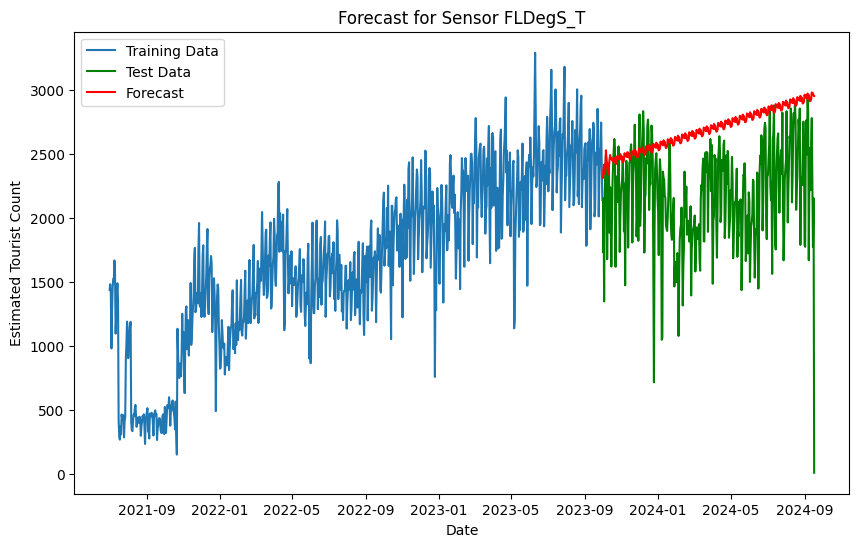

Processing sensor: Fli114C_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Fli114C_T: 4425.715137256034
BIC for sensor Fli114C_T: 4454.30663314756
RMSE for sensor Fli114C_T: 40.43560412093506
Forecast for sensor Fli114C_T:
2024-03-08    134.469044
2024-03-09    138.957059
2024-03-10    129.698410
2024-03-11    139.398154
2024-03-12    125.843265
                 ...    
2024-09-13    135.498409
2024-09-14    130.801132
2024-09-15    130.764274
2024-09-16    128.337630
2024-09-17    138.514267
Freq: D, Name: predicted_mean, Length: 194, dtype: float64

Forecast Increase for sensor Fli114C_T: 4.045223665139389



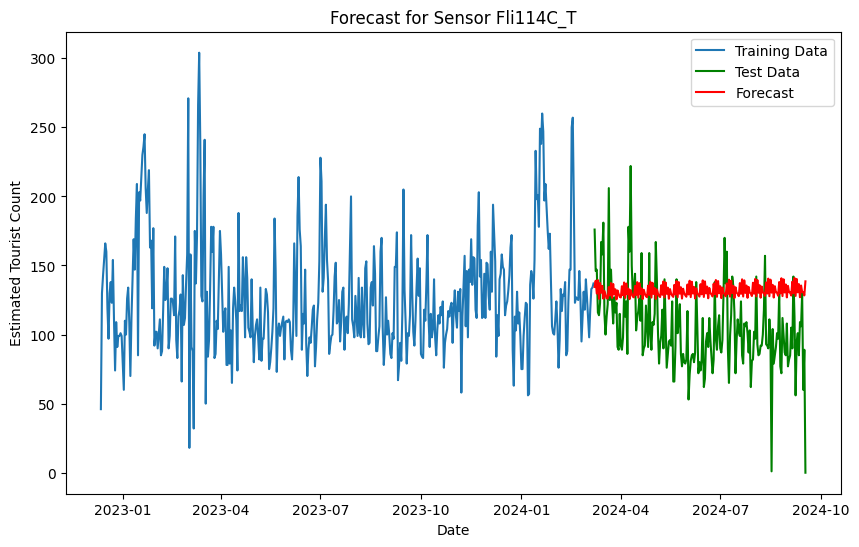

Processing sensor: Fli114F_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Fli114F_T: 6232.484681893944
BIC for sensor Fli114F_T: 6261.0761777854705
RMSE for sensor Fli114F_T: 313.9276059382865
Forecast for sensor Fli114F_T:
2024-03-08    1286.867087
2024-03-09    1232.246048
2024-03-10    1175.312965
2024-03-11    1255.580937
2024-03-12    1224.871382
                 ...     
2024-09-13    1191.723084
2024-09-14    1159.213874
2024-09-15    1198.500368
2024-09-16    1174.406886
2024-09-17    1223.130451
Freq: D, Name: predicted_mean, Length: 194, dtype: float64

Forecast Increase for sensor Fli114F_T: -63.73663550024003



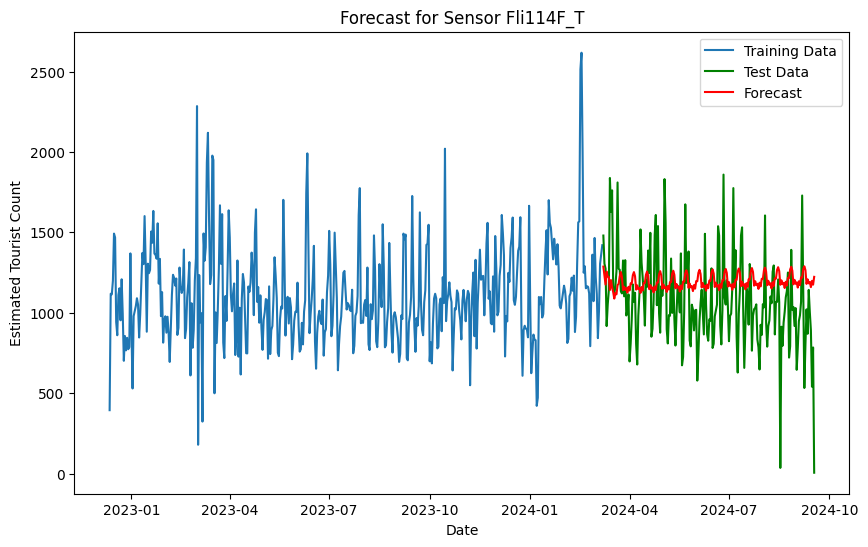

Processing sensor: FliSS_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor FliSS_T: 11748.705677449932
BIC for sensor FliSS_T: 11781.129689891703
RMSE for sensor FliSS_T: 1003.2424862463866
Forecast for sensor FliSS_T:
2023-10-22    3150.575064
2023-10-23    3091.536969
2023-10-24    3001.444699
2023-10-25    3000.066826
2023-10-26    2871.400367
                 ...     
2024-09-13    3902.021896
2024-09-14    3824.466659
2024-09-15    3833.679298
2024-09-16    3759.550508
2024-09-17    3741.308751
Freq: D, Name: predicted_mean, Length: 332, dtype: float64

Forecast Increase for sensor FliSS_T: 590.7336874285038



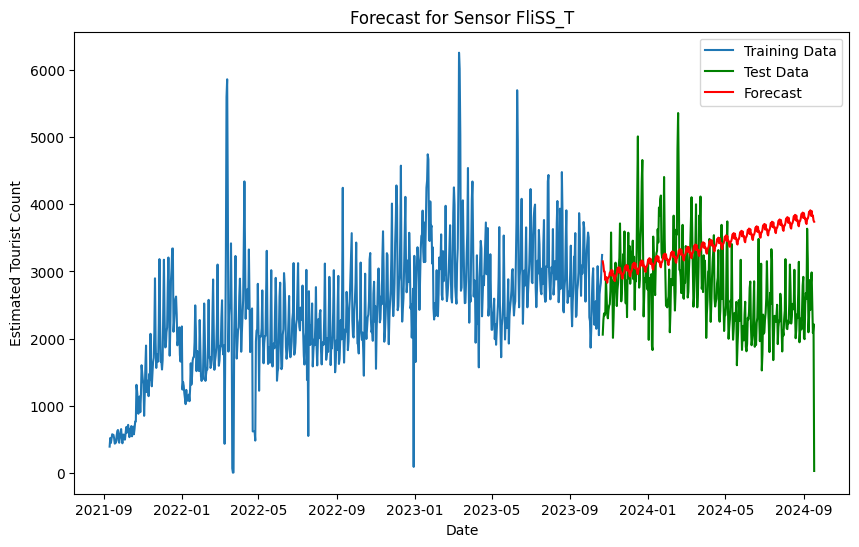

Processing sensor: FliS_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor FliS_T: 12527.514550056461
BIC for sensor FliS_T: 12560.38514247587
RMSE for sensor FliS_T: 1128.034038193199
Forecast for sensor FliS_T:
2023-10-01    3674.984071
2023-10-02    3991.911275
2023-10-03    4178.292256
2023-10-04    4044.210507
2023-10-05    3826.544958
                 ...     
2024-09-13    4601.159523
2024-09-14    4544.349711
2024-09-15    4626.214651
2024-09-16    4565.417126
2024-09-17    4517.847843
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor FliS_T: 842.8637721959467



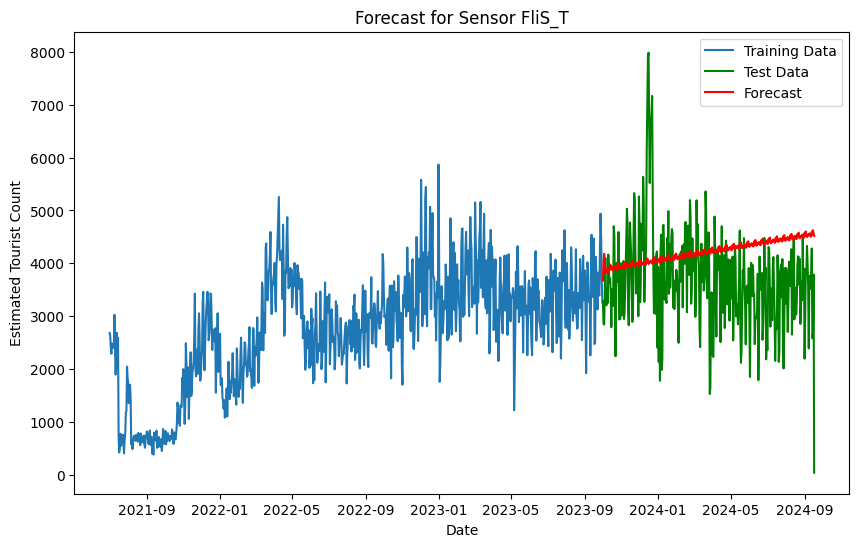

Processing sensor: Fra118_T
AIC for sensor Fra118_T: 9293.59209872807
BIC for sensor Fra118_T: 9326.462691147479
RMSE for sensor Fra118_T: 234.98200927965001
Forecast for sensor Fra118_T:
2023-10-01    701.420317
2023-10-02    700.504418
2023-10-03    708.581593
2023-10-04    692.364774
2023-10-05    662.677283
                 ...    
2024-09-13    837.120678
2024-09-14    832.516177
2024-09-15    838.271090
2024-09-16    832.556023
2024-09-17    839.206178
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Fra118_T: 137.78586079015133



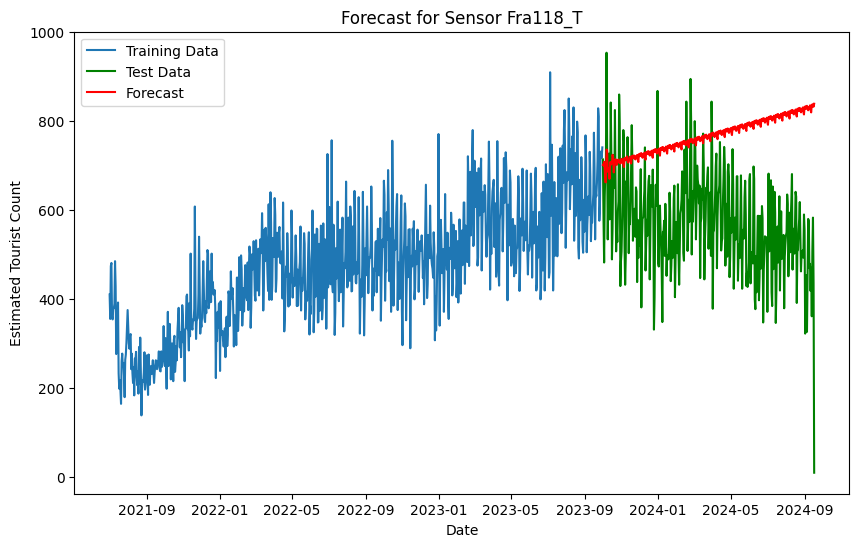

Processing sensor: Hammer1584_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Hammer1584_T: 3395.9629255882646
BIC for sensor Hammer1584_T: 3419.2580587697917
RMSE for sensor Hammer1584_T: 742.0896540944038
Forecast for sensor Hammer1584_T:
2024-06-15    1394.887263
2024-06-16    1589.980678
2024-06-17    1551.388829
2024-06-18    1464.552731
2024-06-19    1606.373831
                 ...     
2024-09-13     934.869887
2024-09-14     736.233818
2024-09-15     552.666678
2024-09-16     798.584422
2024-09-17     919.478413
Freq: D, Name: predicted_mean, Length: 95, dtype: float64

Forecast Increase for sensor Hammer1584_T: -475.4088501225614



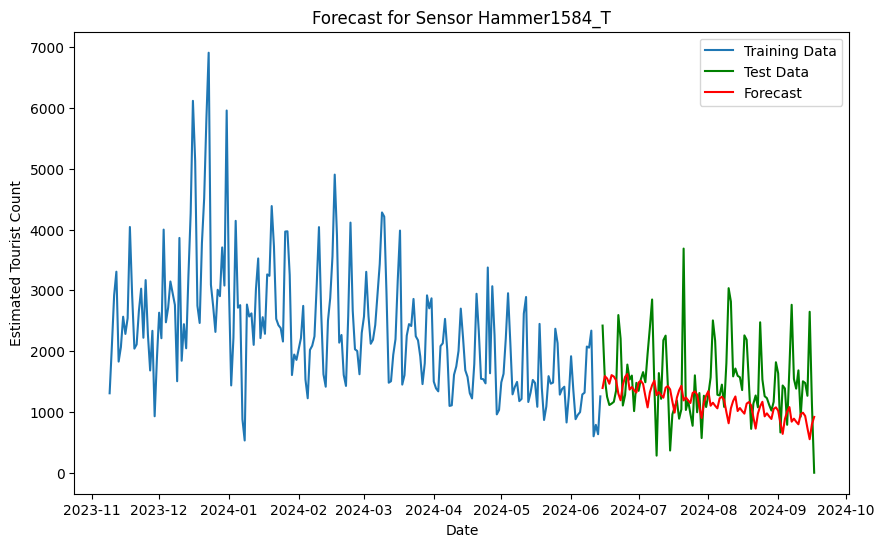

Processing sensor: HarEsB_T
AIC for sensor HarEsB_T: 10360.189395768059
BIC for sensor HarEsB_T: 10393.059988187468
RMSE for sensor HarEsB_T: 183.41148286514135
Forecast for sensor HarEsB_T:
2023-10-01    248.794212
2023-10-02    258.317908
2023-10-03    258.298669
2023-10-04    254.350750
2023-10-05    256.712921
                 ...    
2024-09-13    304.158916
2024-09-14    305.402174
2024-09-15    305.387742
2024-09-16    300.289320
2024-09-17    304.062134
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor HarEsB_T: 55.26792173421751



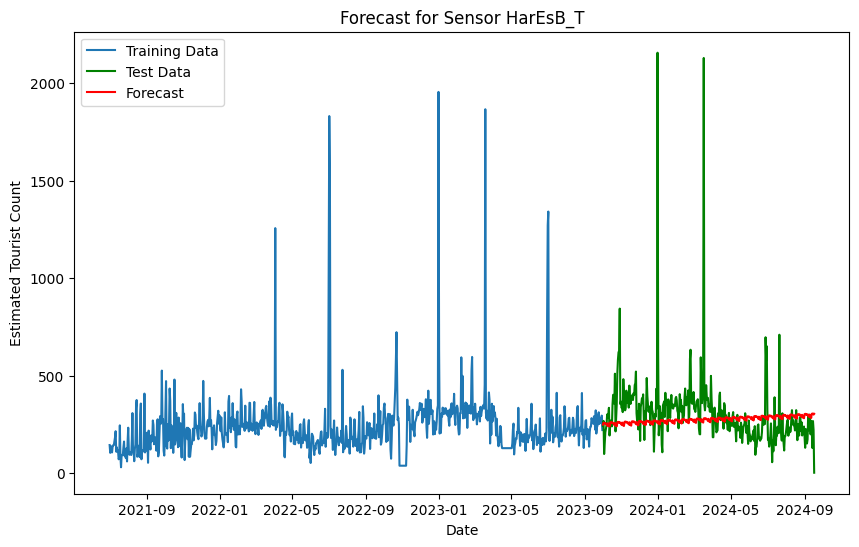

Processing sensor: HarEsP_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor HarEsP_T: 11349.877237098255
BIC for sensor HarEsP_T: 11382.747829517664
RMSE for sensor HarEsP_T: 446.6548679642354
Forecast for sensor HarEsP_T:
2023-10-01    853.490447
2023-10-02    870.534132
2023-10-03    886.872966
2023-10-04    887.193887
2023-10-05    869.232127
                 ...    
2024-09-13    927.085302
2024-09-14    947.127131
2024-09-15    965.950937
2024-09-16    972.443006
2024-09-17    952.162500
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor HarEsP_T: 98.67205327397915



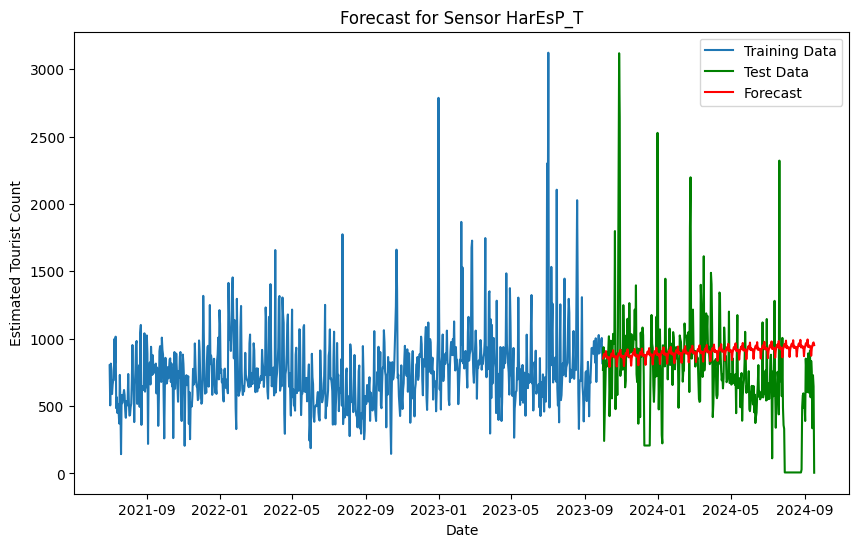

Processing sensor: KenMac_T
AIC for sensor KenMac_T: 8679.887732783554
BIC for sensor KenMac_T: 8712.758325202964
RMSE for sensor KenMac_T: 67.8621672718981
Forecast for sensor KenMac_T:
2023-10-01    290.542526
2023-10-02    305.235051
2023-10-03    304.403679
2023-10-04    294.824877
2023-10-05    298.275321
                 ...    
2024-09-13    324.074630
2024-09-14    326.425886
2024-09-15    325.025758
2024-09-16    321.216826
2024-09-17    316.420661
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor KenMac_T: 25.878135243732515



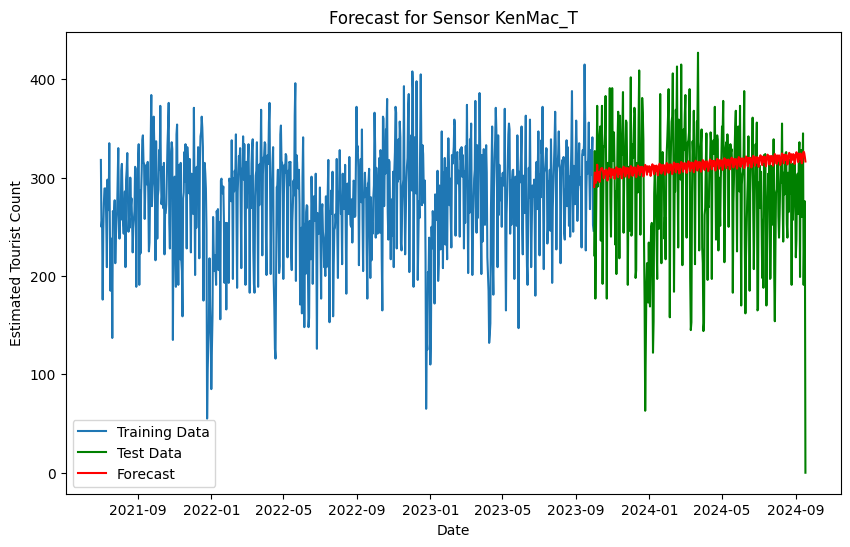

Processing sensor: King2_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor King2_T: 3138.3515162782905
BIC for sensor King2_T: 3162.6279372662366
RMSE for sensor King2_T: 167.11814789519246
Forecast for sensor King2_T:
2024-06-02    736.441854
2024-06-03    719.746451
2024-06-04    688.681912
2024-06-05    660.636651
2024-06-06    551.874216
                 ...    
2024-09-13    560.791831
2024-09-14    518.439911
2024-09-15    511.315658
2024-09-16    537.462611
2024-09-17    550.237189
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor King2_T: -186.20466443165708



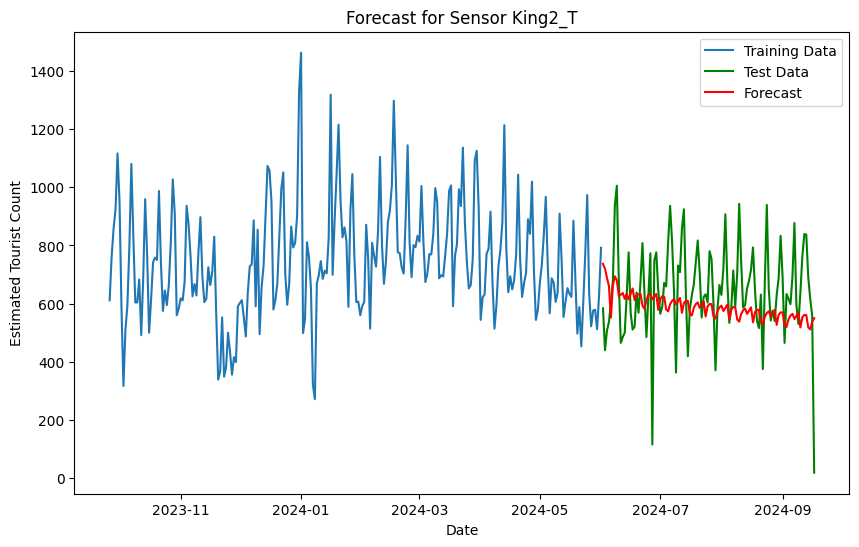

Processing sensor: King335_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor King335_T: 2981.912396734481
BIC for sensor King335_T: 3006.188817722427
RMSE for sensor King335_T: 174.46154662147254
Forecast for sensor King335_T:
2024-06-02    844.216278
2024-06-03    847.727265
2024-06-04    892.759883
2024-06-05    868.593022
2024-06-06    841.035362
                 ...    
2024-09-13    914.362684
2024-09-14    918.376375
2024-09-15    872.888037
2024-09-16    885.250131
2024-09-17    929.584578
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor King335_T: 85.36830061734031



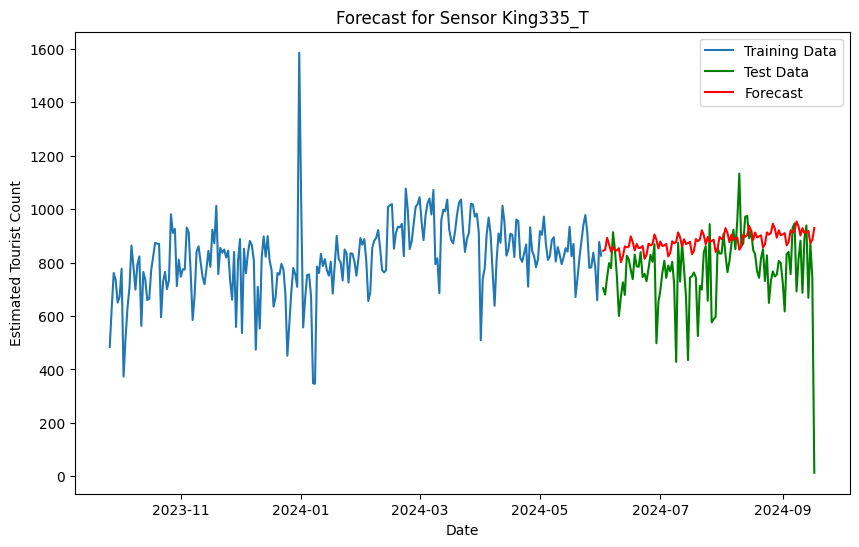

Processing sensor: Lat224_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lat224_T: 10084.998437699778
BIC for sensor Lat224_T: 10117.869030119187
RMSE for sensor Lat224_T: 488.5026899821809
Forecast for sensor Lat224_T:
2023-10-01    1033.124367
2023-10-02    1100.789862
2023-10-03    1105.720364
2023-10-04    1100.669898
2023-10-05    1128.209544
                 ...     
2024-09-13    1446.157452
2024-09-14    1455.264336
2024-09-15    1454.176457
2024-09-16    1447.178908
2024-09-17    1464.088159
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lat224_T: 430.9637914152238



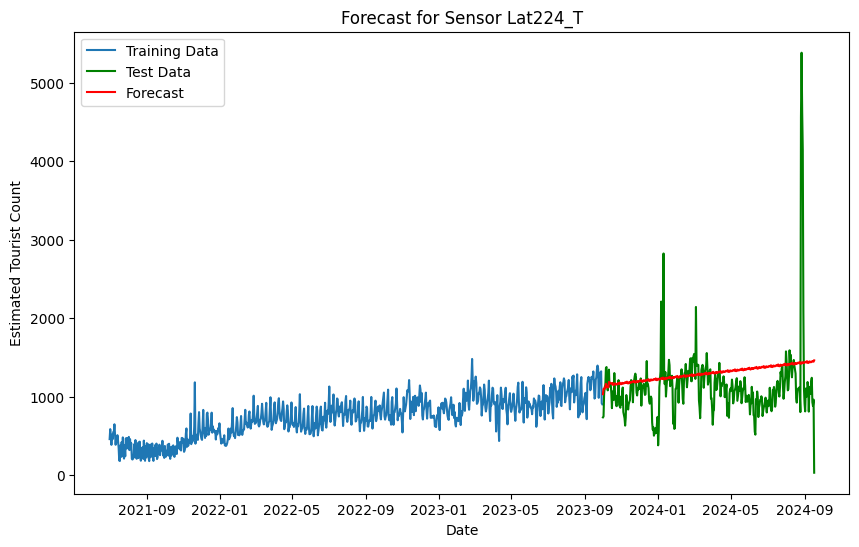

Processing sensor: LatWill_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor LatWill_T: 6447.578306045506
BIC for sensor LatWill_T: 6476.435755712107
RMSE for sensor LatWill_T: 535.480531867389
Forecast for sensor LatWill_T:
2024-02-29    1464.014431
2024-03-01    1259.921977
2024-03-02    1015.891647
2024-03-03    1148.226791
2024-03-04    1226.198319
                 ...     
2024-09-13    1552.395497
2024-09-14    1544.706870
2024-09-15    1539.609788
2024-09-16    1537.606248
2024-09-17    1596.463796
Freq: D, Name: predicted_mean, Length: 202, dtype: float64

Forecast Increase for sensor LatWill_T: 132.44936428388996



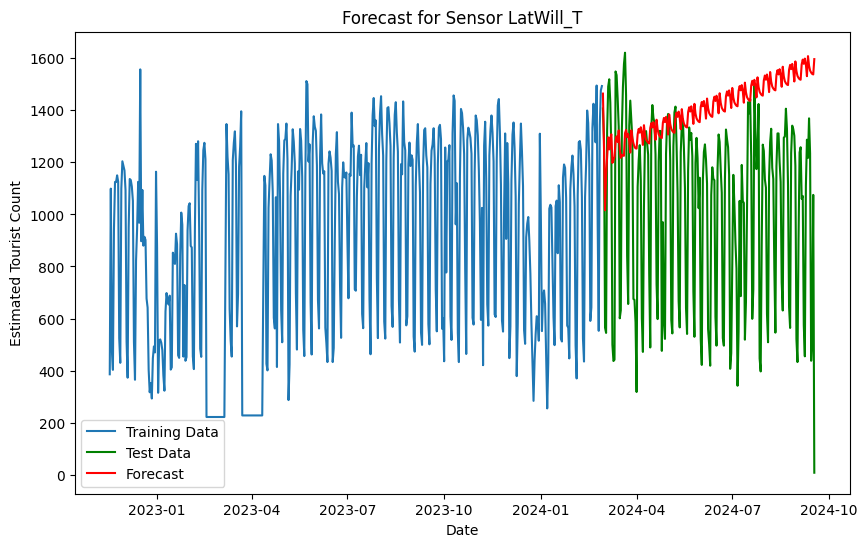

Processing sensor: Lon189_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lon189_T: 11656.994891436827
BIC for sensor Lon189_T: 11689.865483856236
RMSE for sensor Lon189_T: 484.4294736179932
Forecast for sensor Lon189_T:
2023-10-01    1861.832695
2023-10-02    1616.244485
2023-10-03    1563.814655
2023-10-04    1596.140650
2023-10-05    1676.759672
                 ...     
2024-09-13    1963.689910
2024-09-14    1937.123327
2024-09-15    1906.905871
2024-09-16    1891.539758
2024-09-17    1897.793073
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lon189_T: 35.960378290500785



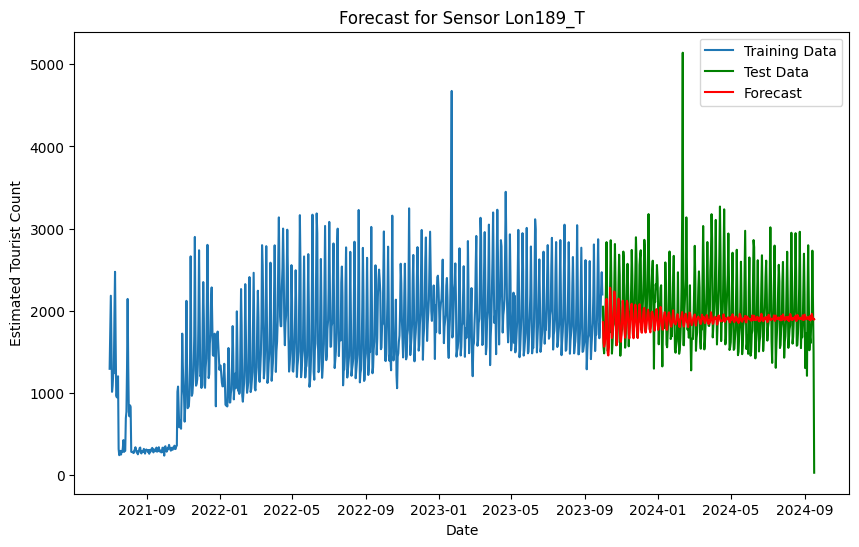

Processing sensor: Lon364_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lon364_T: 10546.837522531816
BIC for sensor Lon364_T: 10579.708114951225
RMSE for sensor Lon364_T: 396.81147182274594
Forecast for sensor Lon364_T:
2023-10-01    1314.583886
2023-10-02    1263.602647
2023-10-03    1248.591004
2023-10-04    1242.656671
2023-10-05    1303.008485
                 ...     
2024-09-13    1441.977841
2024-09-14    1439.373832
2024-09-15    1438.825220
2024-09-16    1432.300481
2024-09-17    1447.433564
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lon364_T: 132.84967711628065



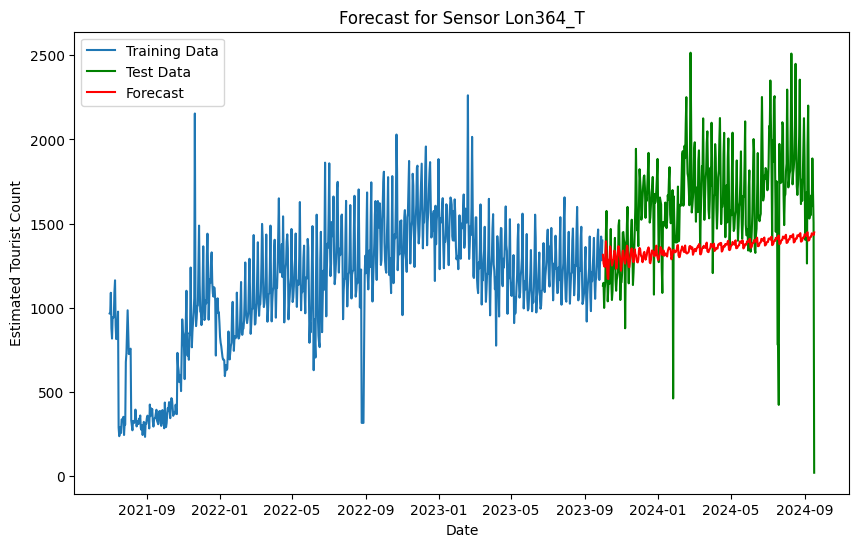

Processing sensor: LtB170_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor LtB170_T: 11679.51652716909
BIC for sensor LtB170_T: 11712.387119588499
RMSE for sensor LtB170_T: 629.074627404057
Forecast for sensor LtB170_T:
2023-10-01    1569.717818
2023-10-02    1517.603306
2023-10-03    1669.174882
2023-10-04    1666.653992
2023-10-05    1750.420735
                 ...     
2024-09-13    2176.131488
2024-09-14    2182.292951
2024-09-15    2165.211625
2024-09-16    2148.473487
2024-09-17    2179.982674
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor LtB170_T: 610.2648561659437



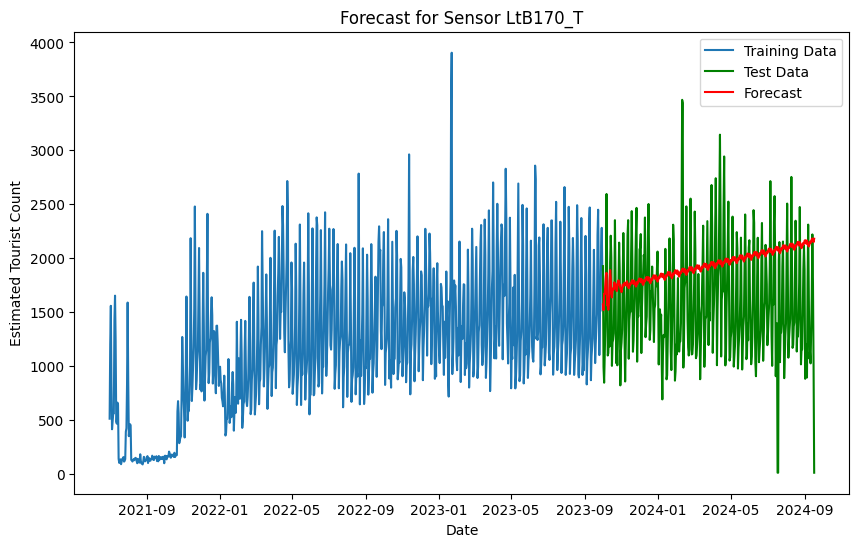

Processing sensor: LtB210_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor LtB210_T: 12114.222872748103
BIC for sensor LtB210_T: 12147.093465167512
RMSE for sensor LtB210_T: 814.5448429738485
Forecast for sensor LtB210_T:
2023-10-01    2531.903031
2023-10-02    2190.059776
2023-10-03    2314.917736
2023-10-04    2771.633447
2023-10-05    3108.484538
                 ...     
2024-09-13    3599.561359
2024-09-14    3782.552410
2024-09-15    3581.338169
2024-09-16    3143.458000
2024-09-17    2799.737333
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor LtB210_T: 267.8343026203984



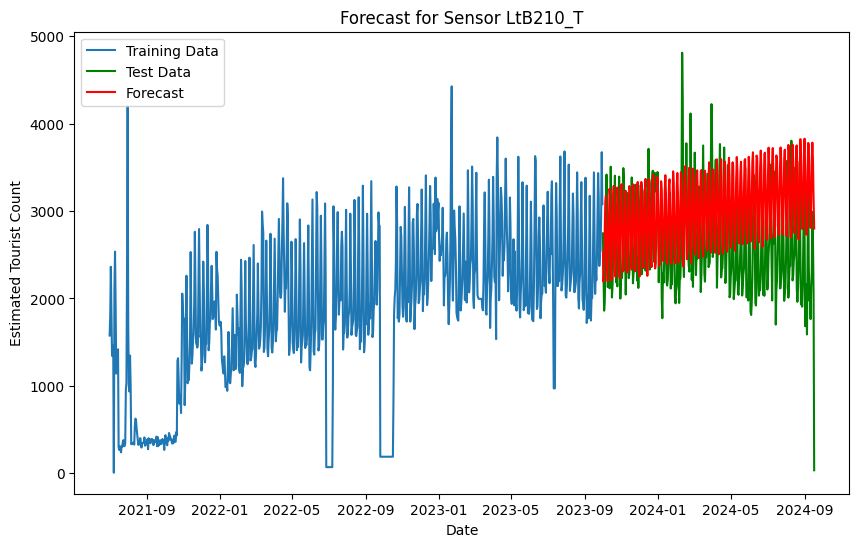

Processing sensor: Lyg161_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lyg161_T: 11126.166301484394
BIC for sensor Lyg161_T: 11159.036893903804
RMSE for sensor Lyg161_T: 331.6279947250675
Forecast for sensor Lyg161_T:
2023-10-01     930.953962
2023-10-02     960.921759
2023-10-03     939.844396
2023-10-04    1044.819226
2023-10-05    1002.670767
                 ...     
2024-09-13    1205.686611
2024-09-14    1242.808929
2024-09-15    1193.931504
2024-09-16    1187.726935
2024-09-17    1201.118747
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lyg161_T: 270.1647843900771



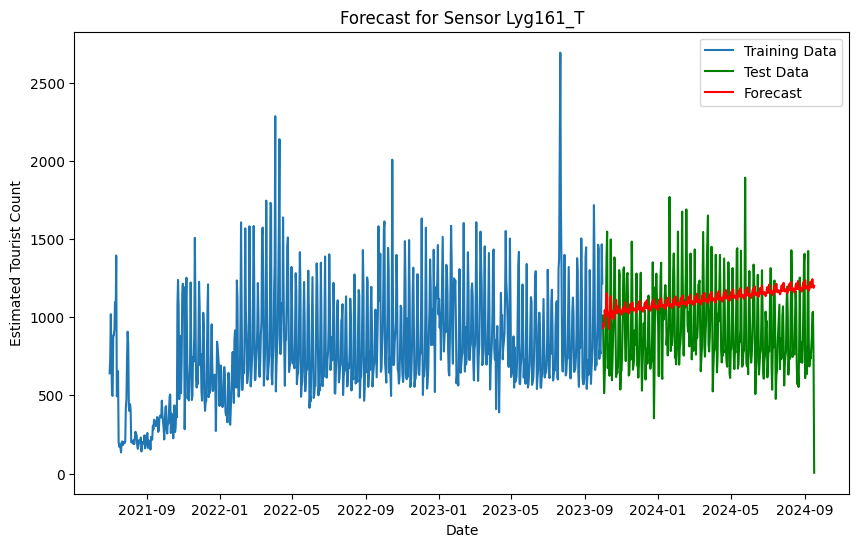

Processing sensor: Lyg260_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lyg260_T: 10868.131443518254
BIC for sensor Lyg260_T: 10901.002035937663
RMSE for sensor Lyg260_T: 213.7338265820087
Forecast for sensor Lyg260_T:
2023-10-01    469.511203
2023-10-02    419.345148
2023-10-03    397.411252
2023-10-04    418.157039
2023-10-05    372.801834
                 ...    
2024-09-13    387.126591
2024-09-14    360.142855
2024-09-15    367.122923
2024-09-16    378.064119
2024-09-17    356.685444
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lyg260_T: -112.82575848558275



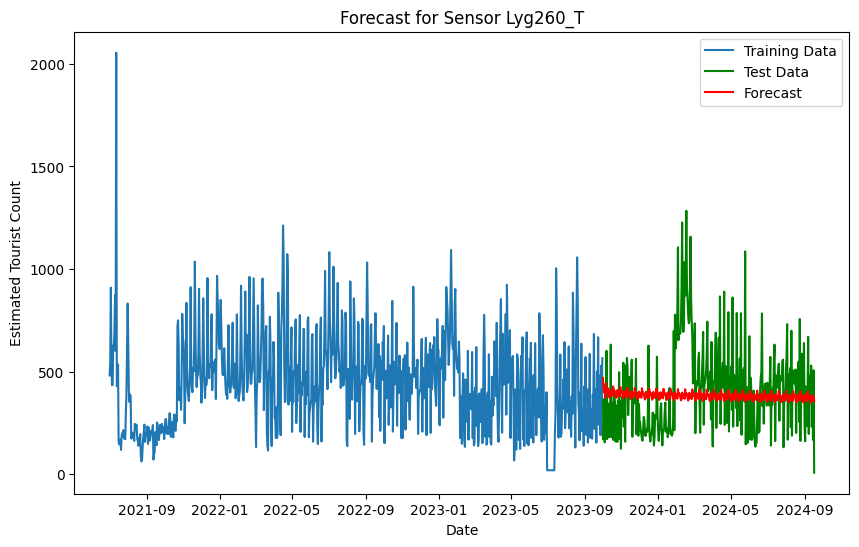

Processing sensor: Lyg309_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Lyg309_T: 10880.425466702844
BIC for sensor Lyg309_T: 10913.296059122253
RMSE for sensor Lyg309_T: 340.01065154050303
Forecast for sensor Lyg309_T:
2023-10-01    801.061600
2023-10-02    798.033175
2023-10-03    765.782110
2023-10-04    780.260982
2023-10-05    812.759142
                 ...    
2024-09-13    798.212819
2024-09-14    810.146948
2024-09-15    793.275633
2024-09-16    762.229049
2024-09-17    775.519456
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Lyg309_T: -25.542143842779637



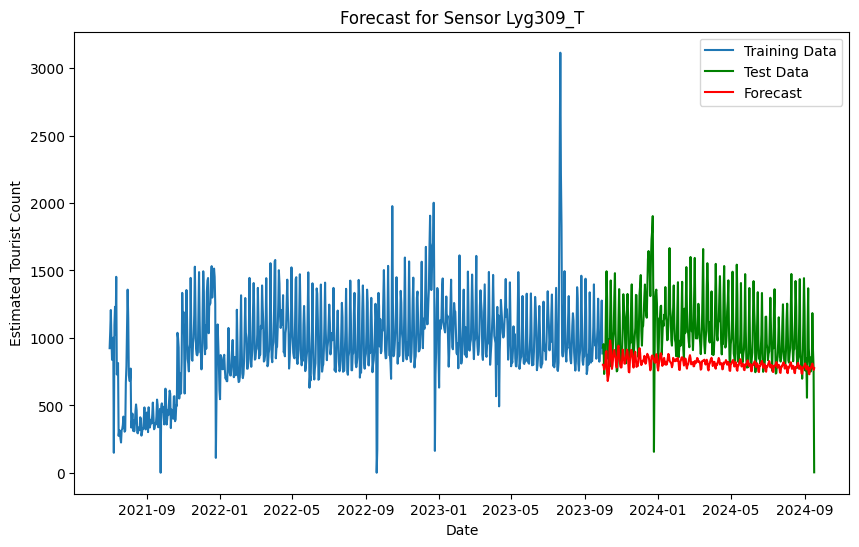

Processing sensor: MCEC_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor MCEC_T: 13193.600901351196
BIC for sensor MCEC_T: 13226.471493770605
RMSE for sensor MCEC_T: 1379.7743490764274
Forecast for sensor MCEC_T:
2023-10-01    2722.858751
2023-10-02    2764.450885
2023-10-03    3007.315074
2023-10-04    3174.002303
2023-10-05    4247.470092
                 ...     
2024-09-13    3785.710637
2024-09-14    3886.912688
2024-09-15    3953.915734
2024-09-16    3950.870067
2024-09-17    3829.537506
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor MCEC_T: 1106.6787550453118



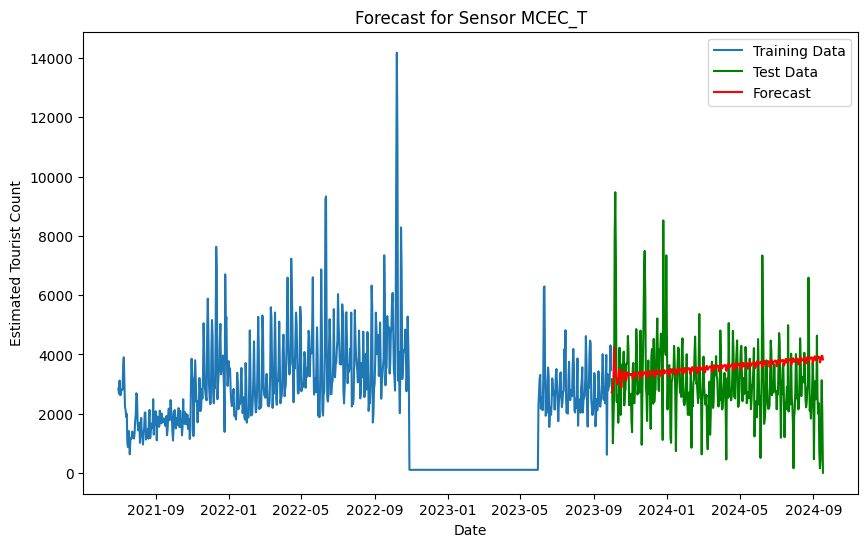

Processing sensor: NewQ_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor NewQ_T: 12481.040870783687
BIC for sensor NewQ_T: 12513.911463203096
RMSE for sensor NewQ_T: 676.8577820026936
Forecast for sensor NewQ_T:
2023-10-01    1287.325292
2023-10-02    1368.755169
2023-10-03    1324.396280
2023-10-04    1399.452820
2023-10-05    1379.942993
                 ...     
2024-09-13    1364.626900
2024-09-14    1383.672501
2024-09-15    1343.565381
2024-09-16    1417.762926
2024-09-17    1439.819510
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor NewQ_T: 152.49421814519724



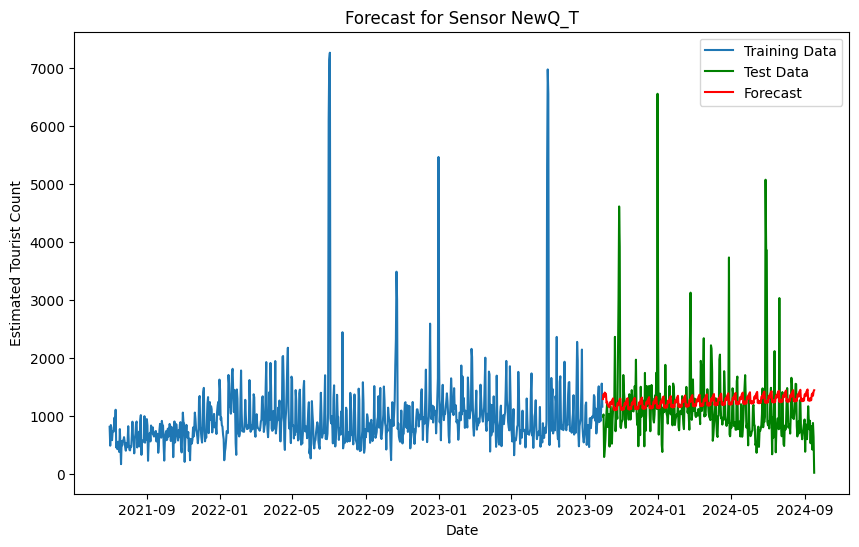

Processing sensor: Pel147_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Pel147_T: 9555.63847705467
BIC for sensor Pel147_T: 9588.50906947408
RMSE for sensor Pel147_T: 467.0158808068548
Forecast for sensor Pel147_T:
2023-10-01    51.971454
2023-10-02    94.928901
2023-10-03    94.741940
2023-10-04    52.125404
2023-10-05   -11.338983
                ...    
2024-09-13   -42.814220
2024-09-14     5.943563
2024-09-15    13.323718
2024-09-16   -25.399745
2024-09-17   -89.849804
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Pel147_T: -141.82125769065556



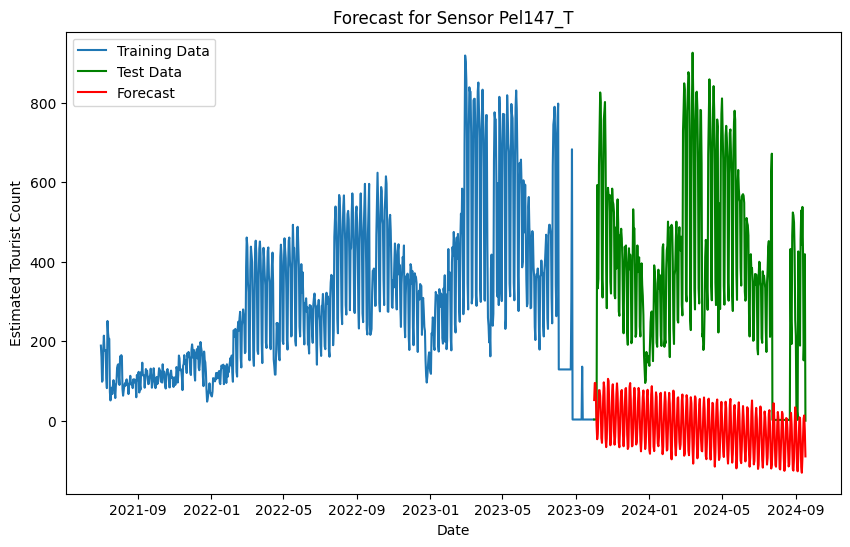

Processing sensor: PriNW_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor PriNW_T: 13143.493739155769
BIC for sensor PriNW_T: 13176.364331575178
RMSE for sensor PriNW_T: 1188.822037803317
Forecast for sensor PriNW_T:
2023-10-01    4209.949729
2023-10-02    4172.424791
2023-10-03    4065.512986
2023-10-04    4072.165969
2023-10-05    3970.758226
                 ...     
2024-09-13    2956.808376
2024-09-14    2856.956503
2024-09-15    2902.631323
2024-09-16    2871.934794
2024-09-17    2813.456351
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor PriNW_T: -1396.4933776415933



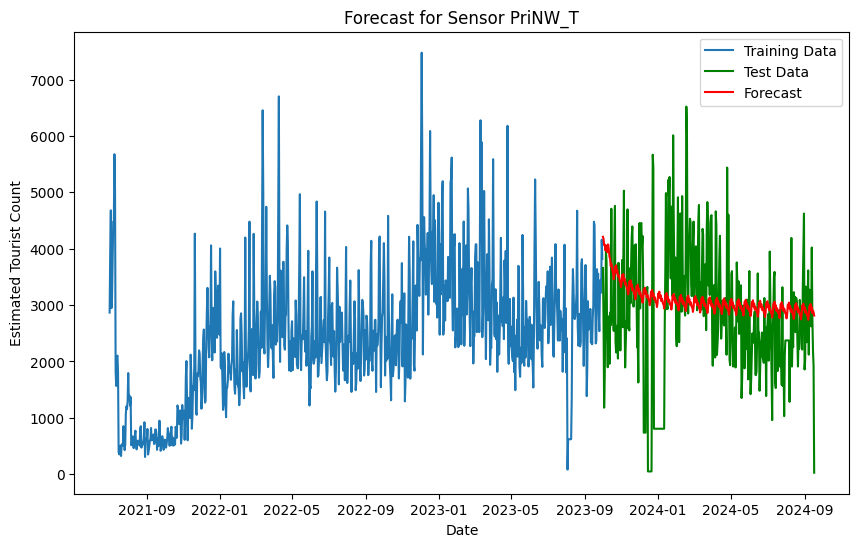

Processing sensor: QVMQ_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor QVMQ_T: 11561.009199291319
BIC for sensor QVMQ_T: 11593.871133700966
RMSE for sensor QVMQ_T: 408.42204775431463
Forecast for sensor QVMQ_T:
2023-09-30    1520.832160
2023-10-01    1522.971678
2023-10-02    1068.438813
2023-10-03    1320.308284
2023-10-04    1648.557114
                 ...     
2024-09-12    1637.402268
2024-09-13    1438.280377
2024-09-14    1807.907120
2024-09-15    1913.296381
2024-09-16    1481.289540
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor QVMQ_T: -39.54261962854753



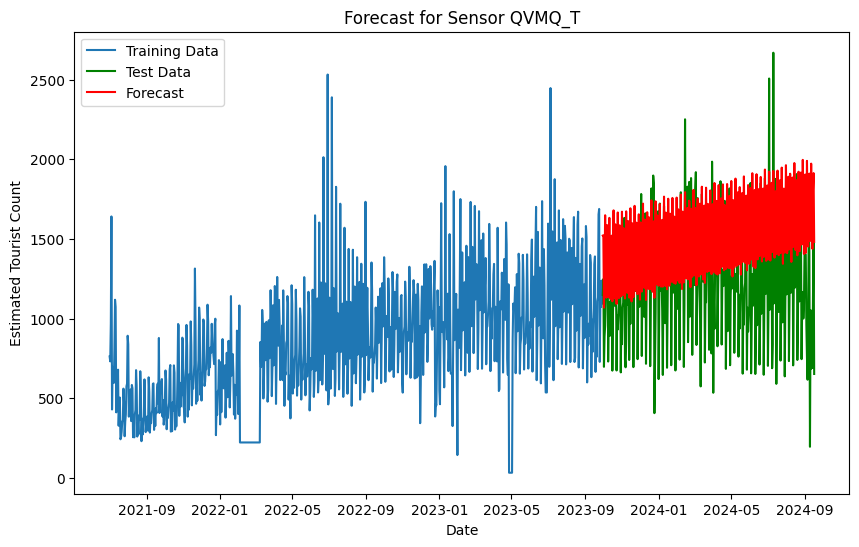

Processing sensor: QVN_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor QVN_T: 12927.110859121221
BIC for sensor QVN_T: 12959.98145154063
RMSE for sensor QVN_T: 1170.3183776145956
Forecast for sensor QVN_T:
2023-10-01    5403.960996
2023-10-02    5598.953752
2023-10-03    5718.743213
2023-10-04    5499.362256
2023-10-05    5428.000733
                 ...     
2024-09-13    6896.397211
2024-09-14    6896.783999
2024-09-15    6914.151111
2024-09-16    6760.886185
2024-09-17    6870.503432
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor QVN_T: 1466.5424355530467



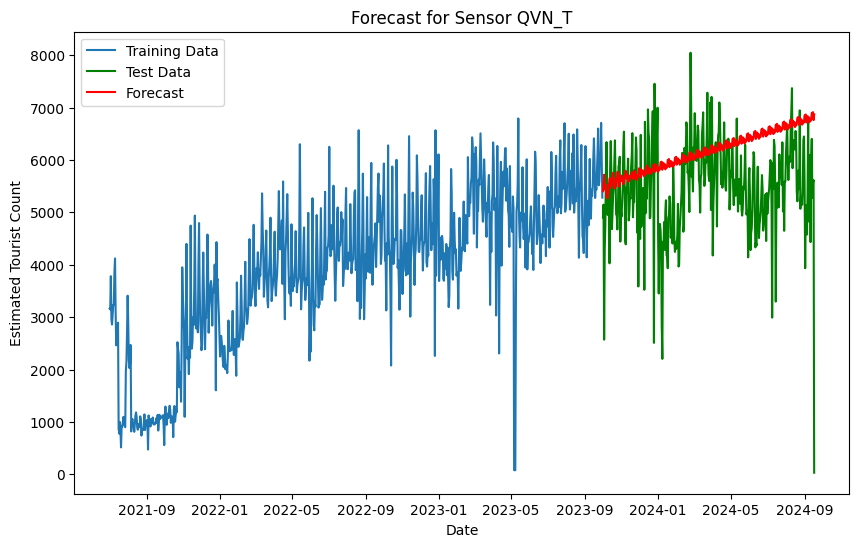

Processing sensor: Que85_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Que85_T: 10815.284604660363
BIC for sensor Que85_T: 10848.155197079772
RMSE for sensor Que85_T: 285.8232700418028
Forecast for sensor Que85_T:
2023-10-01     982.709002
2023-10-02    1079.580046
2023-10-03    1179.747638
2023-10-04    1245.128751
2023-10-05    1223.598222
                 ...     
2024-09-13    1357.457531
2024-09-14    1314.218131
2024-09-15    1275.626624
2024-09-16    1287.230825
2024-09-17    1290.390359
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Que85_T: 307.6813573278355



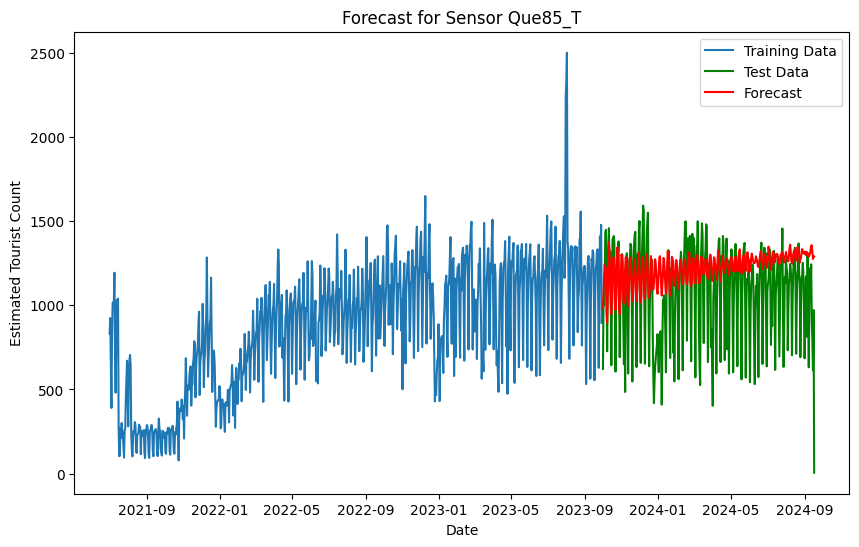

Processing sensor: RMIT14_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor RMIT14_T: 11584.824366187488
BIC for sensor RMIT14_T: 11617.694958606897
RMSE for sensor RMIT14_T: 664.3500270642917
Forecast for sensor RMIT14_T:
2023-10-01    1732.745848
2023-10-02    2058.053080
2023-10-03    2226.218228
2023-10-04    2152.489258
2023-10-05    1977.108417
                 ...     
2024-09-13    2369.115605
2024-09-14    2341.055814
2024-09-15    2328.797574
2024-09-16    2343.505317
2024-09-17    2390.593833
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor RMIT14_T: 657.8479852903902



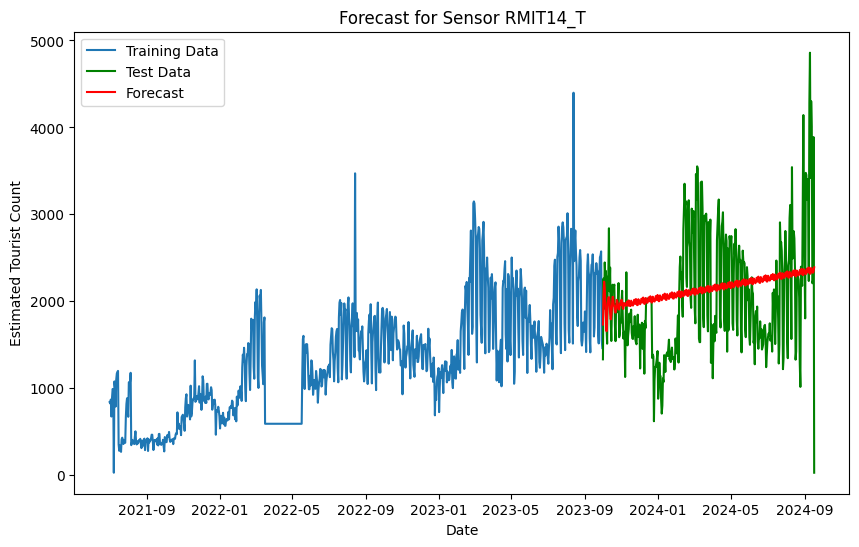

Processing sensor: RMIT_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor RMIT_T: 12900.66440007283
BIC for sensor RMIT_T: 12933.53499249224
RMSE for sensor RMIT_T: 1659.2740716277092
Forecast for sensor RMIT_T:
2023-10-01    2803.732932
2023-10-02    3573.712196
2023-10-03    3888.294104
2023-10-04    4074.907919
2023-10-05    4279.530636
                 ...     
2024-09-13    4933.227576
2024-09-14    4885.578800
2024-09-15    4835.463720
2024-09-16    4816.813307
2024-09-17    4853.327645
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor RMIT_T: 2049.5947139002346



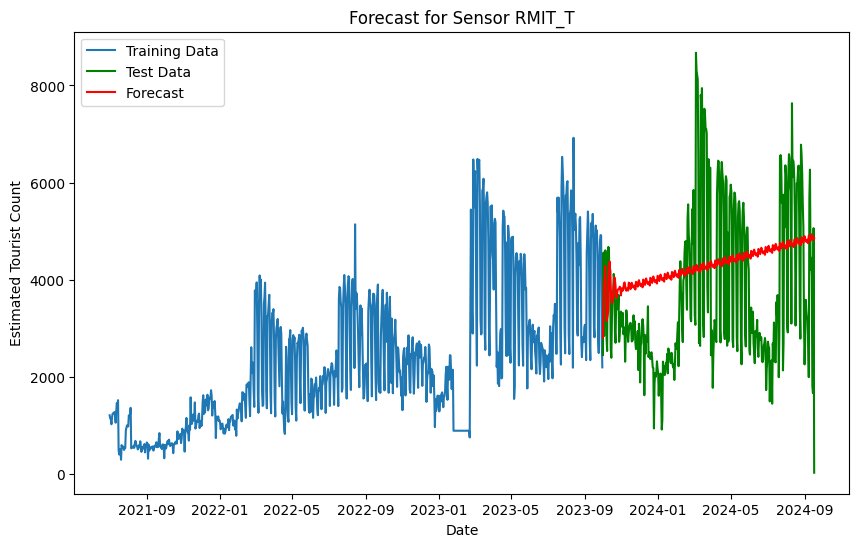

Processing sensor: SanBri_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor SanBri_T: 11397.713918542562
BIC for sensor SanBri_T: 11430.584510961971
RMSE for sensor SanBri_T: 1224.1927960649502
Forecast for sensor SanBri_T:
2023-10-01    2030.034702
2023-10-02    2085.919025
2023-10-03    2025.244050
2023-10-04    1946.124111
2023-10-05    1940.828699
                 ...     
2024-09-13    2363.795833
2024-09-14    2398.513152
2024-09-15    2392.228801
2024-09-16    2377.245065
2024-09-17    2359.729905
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor SanBri_T: 329.69520265559277



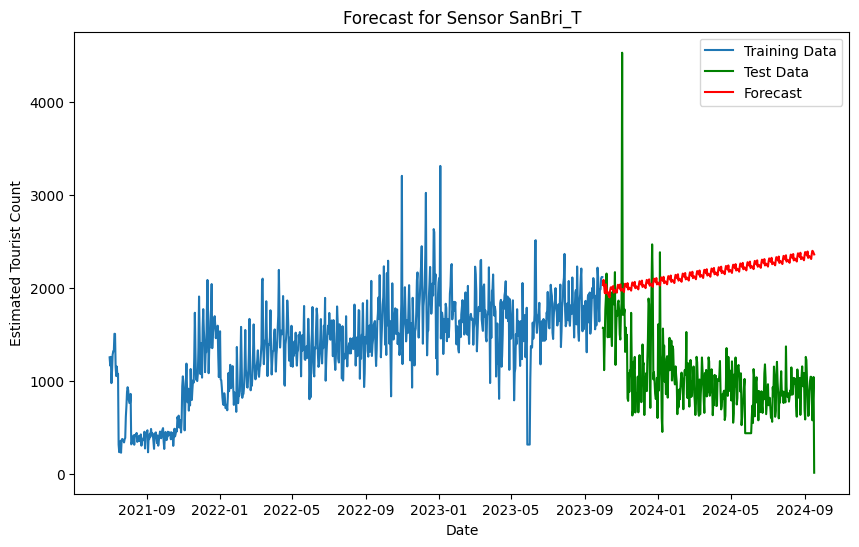

Processing sensor: Signal1647_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Signal1647_T: 2439.2644620409073
BIC for sensor Signal1647_T: 2462.3175958139786
RMSE for sensor Signal1647_T: 117.55299293577337
Forecast for sensor Signal1647_T:
2024-06-19    354.785896
2024-06-20    283.530536
2024-06-21    251.774385
2024-06-22    244.758581
2024-06-23    248.705949
                 ...    
2024-09-13    230.059823
2024-09-14    216.219729
2024-09-15    199.154734
2024-09-16    201.190883
2024-09-17    230.821965
Freq: D, Name: predicted_mean, Length: 91, dtype: float64

Forecast Increase for sensor Signal1647_T: -123.96393054537037



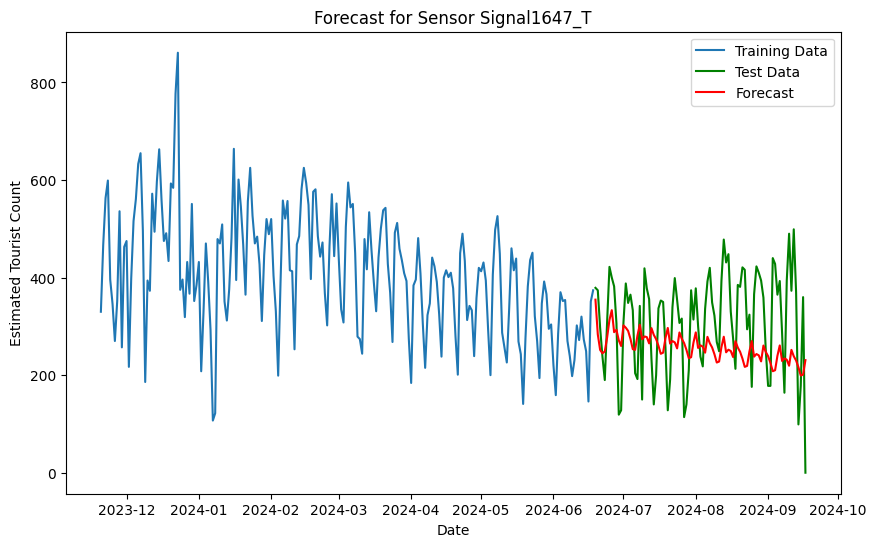

Processing sensor: SouthB_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor SouthB_T: 13895.036219371425
BIC for sensor SouthB_T: 13927.906811790834
RMSE for sensor SouthB_T: 3329.2556111248728
Forecast for sensor SouthB_T:
2023-10-01    3100.272965
2023-10-02    3635.137541
2023-10-03    3311.082313
2023-10-04    2543.606824
2023-10-05    3960.670800
                 ...     
2024-09-13    4112.086478
2024-09-14    4140.706778
2024-09-15    4218.719907
2024-09-16    4105.946851
2024-09-17    4012.321417
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor SouthB_T: 912.0484518124936



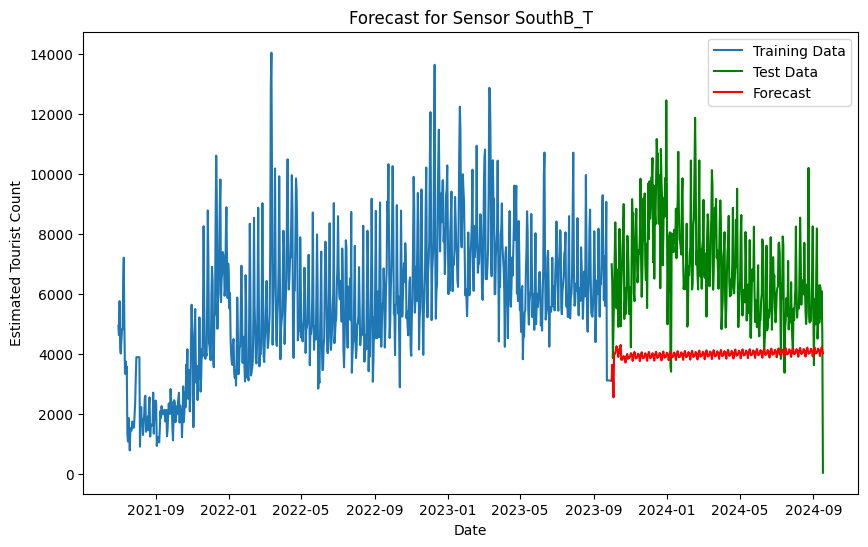

Processing sensor: Spen161_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Spen161_T: 3625.1630818538183
BIC for sensor Spen161_T: 3649.4689765695184
RMSE for sensor Spen161_T: 394.19894938446413
Forecast for sensor Spen161_T:
2024-06-02    1942.431121
2024-06-03    1910.014496
2024-06-04    2049.130054
2024-06-05    2007.549105
2024-06-06    1713.266699
                 ...     
2024-09-13    2070.071646
2024-09-14    2130.915600
2024-09-15    2120.091072
2024-09-16    2010.725552
2024-09-17    2029.333893
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor Spen161_T: 86.90277228580908



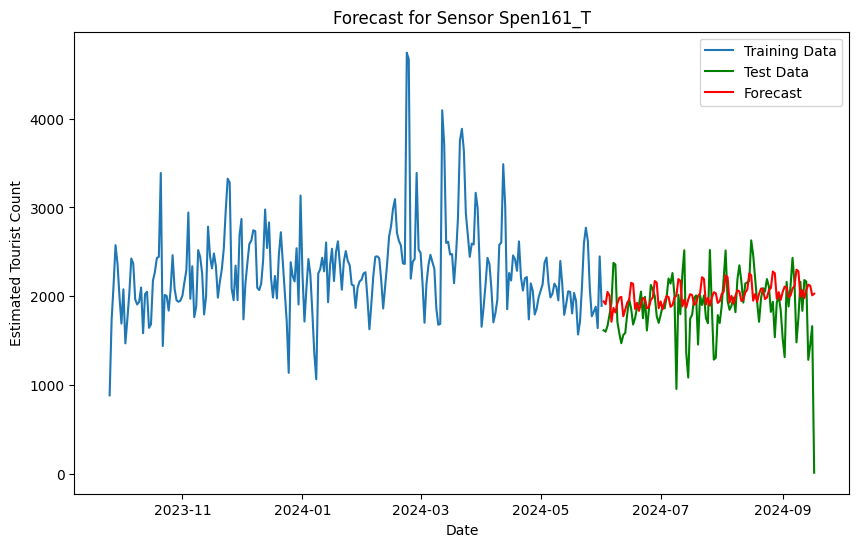

Processing sensor: Spen201_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Spen201_T: 3601.4524208497614
BIC for sensor Spen201_T: 3625.7583155654615
RMSE for sensor Spen201_T: 421.3499744316582
Forecast for sensor Spen201_T:
2024-06-02    2011.598542
2024-06-03    2044.678452
2024-06-04    2064.557679
2024-06-05    2130.048937
2024-06-06    2044.034302
                 ...     
2024-09-13    2141.035948
2024-09-14    2135.505678
2024-09-15    1973.540767
2024-09-16    2024.150684
2024-09-17    2138.664450
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor Spen201_T: 127.06590764187558



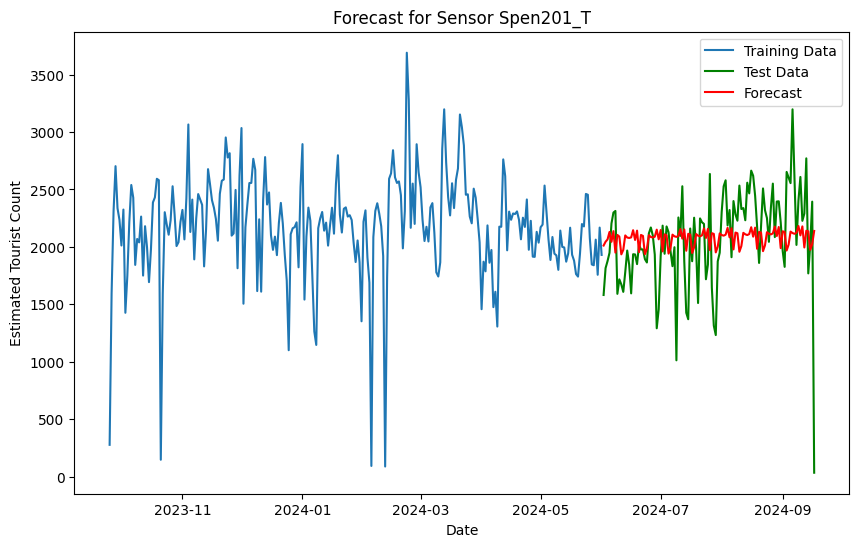

Processing sensor: Spen229_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Spen229_T: 3589.1750032367345
BIC for sensor Spen229_T: 3613.4808979524346
RMSE for sensor Spen229_T: 446.5146143921526
Forecast for sensor Spen229_T:
2024-06-02    2702.869242
2024-06-03    2839.135616
2024-06-04    3108.549722
2024-06-05    3061.263979
2024-06-06    2827.751314
                 ...     
2024-09-13    2999.089358
2024-09-14    2941.044942
2024-09-15    2932.603750
2024-09-16    2870.343839
2024-09-17    2958.319280
Freq: D, Name: predicted_mean, Length: 108, dtype: float64

Forecast Increase for sensor Spen229_T: 255.4500376543283



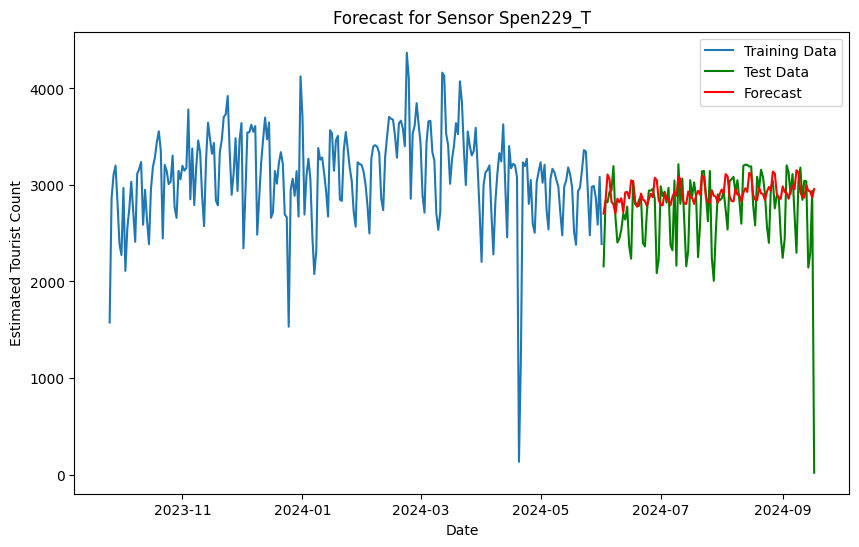

Processing sensor: Spencer_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Spencer_T: 1538.7566690577123
BIC for sensor Spencer_T: 1556.9225080086544
RMSE for sensor Spencer_T: 432.33774409455674
Forecast for sensor Spencer_T:
2024-07-31    1815.466494
2024-08-01    1289.685279
2024-08-02    1153.086773
2024-08-03    1280.669594
2024-08-04    1201.838714
2024-08-05    1225.492624
2024-08-06    1426.933313
2024-08-07    1201.364903
2024-08-08    1181.738955
2024-08-09    1183.442705
2024-08-10    1195.356621
2024-08-11    1380.891918
2024-08-12    1631.692696
2024-08-13    1300.654593
2024-08-14    1088.660161
2024-08-15    1175.043832
2024-08-16    1139.964964
2024-08-17    1232.148355
2024-08-18    1341.901553
2024-08-19    1353.753071
2024-08-20    1143.881053
2024-08-21    1086.795027
2024-08-22    1029.804654
2024-08-23    1262.800261
2024-08-24    1604.986144
2024-08-25    1239.338302
2024-08-26    1040.642259
2024-08-27    1134.615789
2024-08-28    1091.554388
2024-08-29    1171.457385
2024-08-30    1297.686359
2024-08-31    1266.800265
2

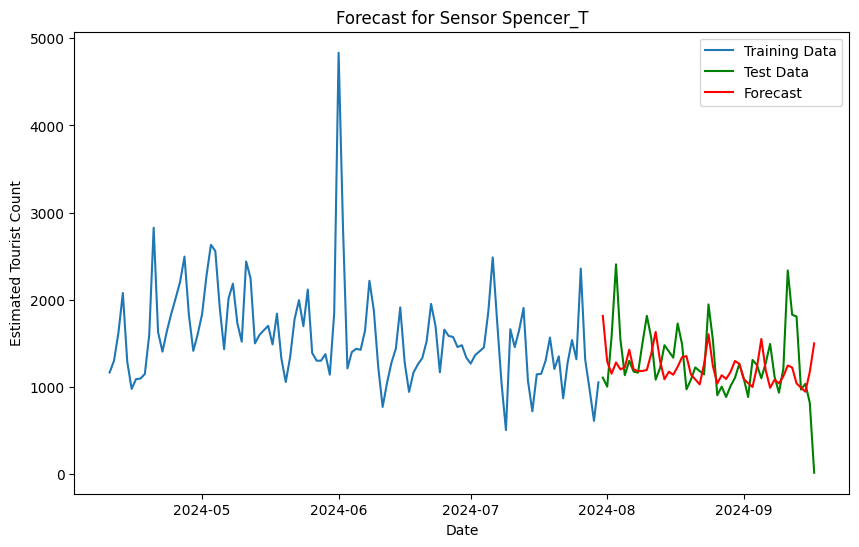

Processing sensor: Spr201_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Spr201_T: 10816.819218628241
BIC for sensor Spr201_T: 10849.68981104765
RMSE for sensor Spr201_T: 506.40368063464956
Forecast for sensor Spr201_T:
2023-10-01     587.818936
2023-10-02     757.696006
2023-10-03    1057.064055
2023-10-04    1197.098549
2023-10-05    1136.707713
                 ...     
2024-09-13     464.590250
2024-09-14      89.364708
2024-09-15      37.289862
2024-09-16     254.017346
2024-09-17     565.371784
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Spr201_T: -22.447151398781102



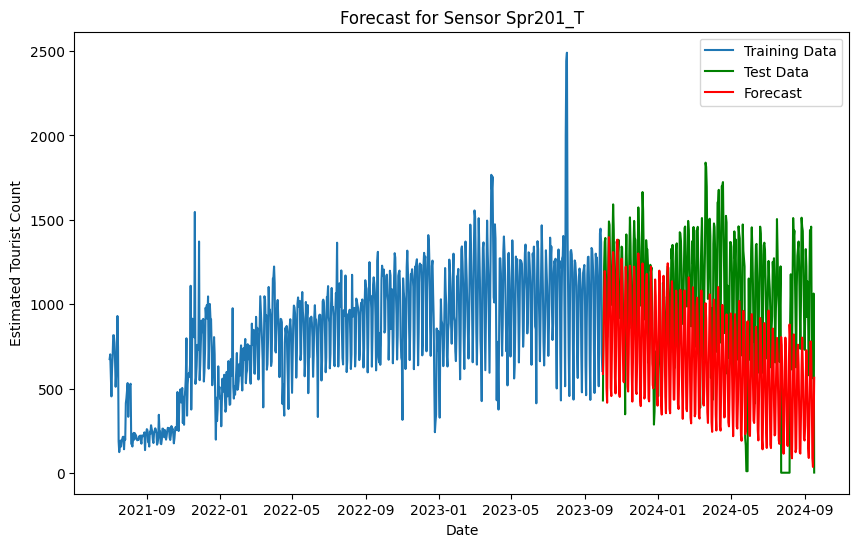

Processing sensor: SprFli_T
AIC for sensor SprFli_T: 9506.780003342323
BIC for sensor SprFli_T: 9539.64193775197
RMSE for sensor SprFli_T: 126.99469638368875
Forecast for sensor SprFli_T:
2023-09-30    353.963669
2023-10-01    336.380842
2023-10-02    341.739017
2023-10-03    353.429459
2023-10-04    327.574996
                 ...    
2024-09-12    407.849982
2024-09-13    408.746599
2024-09-14    413.550742
2024-09-15    426.402399
2024-09-16    412.084492
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor SprFli_T: 58.12082298669981



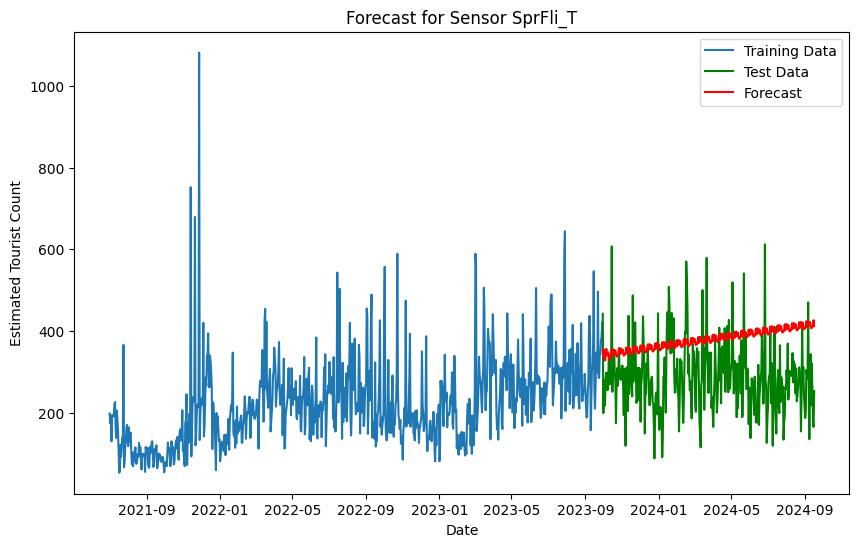

Processing sensor: Swa123_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Swa123_T: 13266.734469173136
BIC for sensor Swa123_T: 13299.605061592545
RMSE for sensor Swa123_T: 1626.8197409552643
Forecast for sensor Swa123_T:
2023-10-01    3938.830850
2023-10-02    4002.969249
2023-10-03    4430.076414
2023-10-04    4288.709735
2023-10-05    4163.572893
                 ...     
2024-09-13    5181.553469
2024-09-14    5081.654575
2024-09-15    5253.858467
2024-09-16    5107.558319
2024-09-17    5039.708226
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Swa123_T: 1100.877375881375



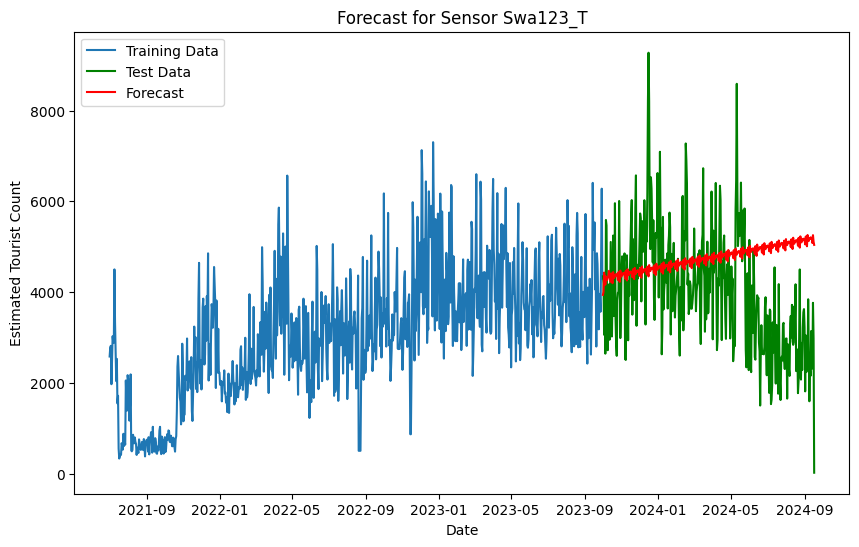

Processing sensor: Swa148_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor Swa148_T: 12622.834067144828
BIC for sensor Swa148_T: 12655.704659564237
RMSE for sensor Swa148_T: 823.37878604522
Forecast for sensor Swa148_T:
2023-10-01    3158.558216
2023-10-02    3170.793422
2023-10-03    3131.884539
2023-10-04    3073.642900
2023-10-05    2915.646421
                 ...     
2024-09-13    3725.408792
2024-09-14    3633.849755
2024-09-15    3674.326600
2024-09-16    3656.190528
2024-09-17    3631.617580
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Swa148_T: 473.0593632005748



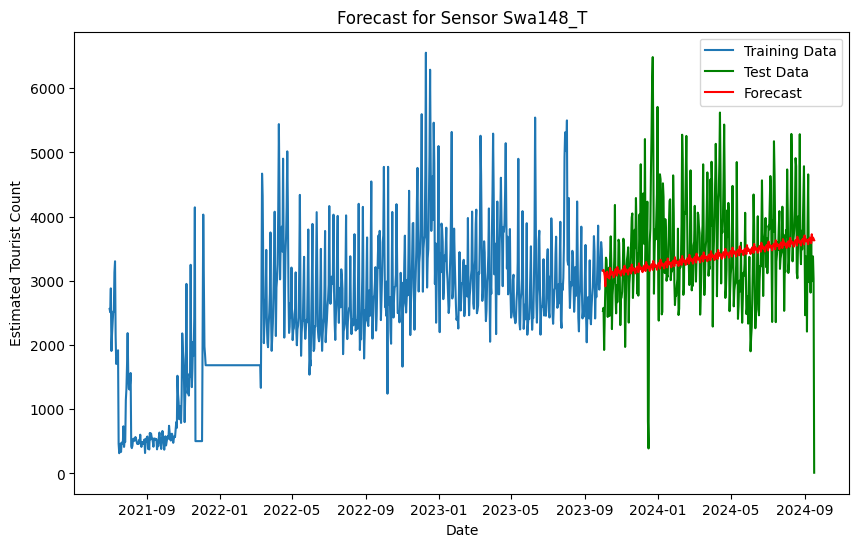

Processing sensor: Swa295_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Swa295_T: 12769.962892928153
BIC for sensor Swa295_T: 12802.833485347563
RMSE for sensor Swa295_T: 1479.9621546447033
Forecast for sensor Swa295_T:
2023-10-01    4464.613998
2023-10-02    4075.669196
2023-10-03    4008.247754
2023-10-04    3858.313253
2023-10-05    4107.213298
                 ...     
2024-09-13    5349.372122
2024-09-14    5398.179020
2024-09-15    5417.460419
2024-09-16    5347.113176
2024-09-17    5387.021185
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Swa295_T: 922.4071878719014



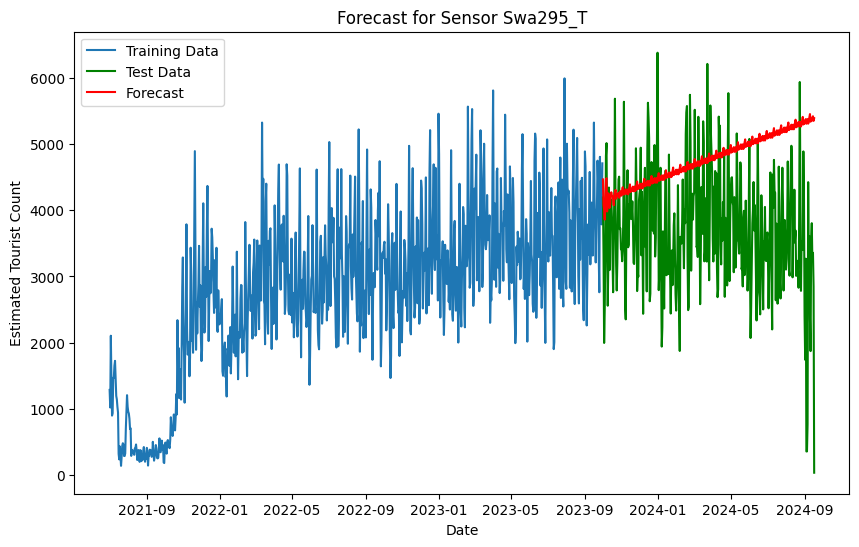

Processing sensor: Swa31


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Swa31: 13634.265650860762
BIC for sensor Swa31: 13667.13624328017
RMSE for sensor Swa31: 4153.87875112229
Forecast for sensor Swa31:
2023-10-01    7897.807047
2023-10-02    7707.083395
2023-10-03    7915.545809
2023-10-04    7837.698719
2023-10-05    8029.173102
                 ...     
2024-09-13    9222.991390
2024-09-14    9299.436338
2024-09-15    9325.511352
2024-09-16    9117.510628
2024-09-17    9187.952934
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Swa31: 1290.1458873269457



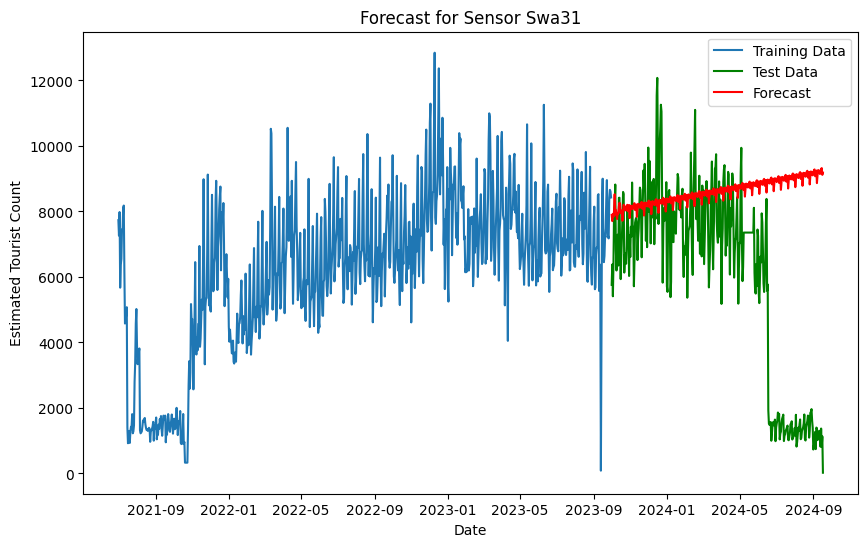

Processing sensor: Swa607_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor Swa607_T: 10342.973737544864
BIC for sensor Swa607_T: 10375.844329964273
RMSE for sensor Swa607_T: 434.47167315963725
Forecast for sensor Swa607_T:
2023-10-01     547.343957
2023-10-02     651.605658
2023-10-03     778.450468
2023-10-04     899.888096
2023-10-05    1036.267134
                 ...     
2024-09-13    1077.618365
2024-09-14    1155.204660
2024-09-15    1195.193091
2024-09-16    1134.135254
2024-09-17    1055.375636
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Swa607_T: 508.0316787948069



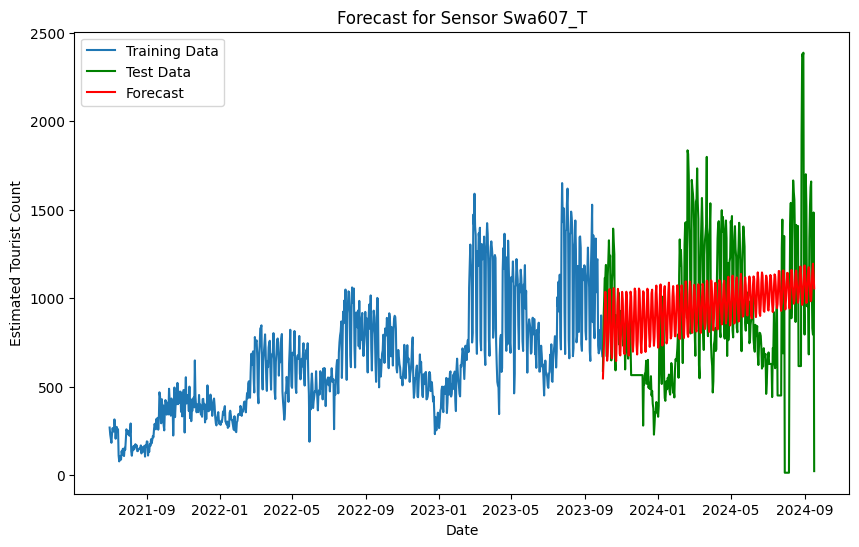

Processing sensor: SwaCs_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor SwaCs_T: 12618.539265835307
BIC for sensor SwaCs_T: 12651.409858254716
RMSE for sensor SwaCs_T: 845.3336418116922
Forecast for sensor SwaCs_T:
2023-10-01    2621.891581
2023-10-02    2657.042198
2023-10-03    2680.914722
2023-10-04    2531.813308
2023-10-05    2442.555067
                 ...     
2024-09-13    3275.574459
2024-09-14    3266.201841
2024-09-15    3298.763512
2024-09-16    3194.860372
2024-09-17    3139.982927
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor SwaCs_T: 518.0913462429007



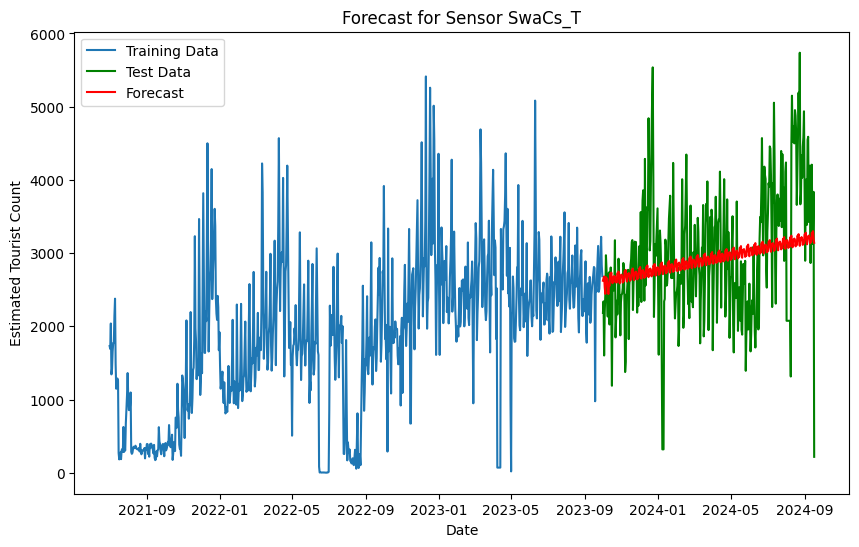

Processing sensor: UM1_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor UM1_T: 11521.534488262085
BIC for sensor UM1_T: 11554.405080681494
RMSE for sensor UM1_T: 1189.8174825922656
Forecast for sensor UM1_T:
2023-10-01    109.148790
2023-10-02    129.229053
2023-10-03    124.418767
2023-10-04     15.634581
2023-10-05     -1.526993
                 ...    
2024-09-13   -833.533930
2024-09-14   -838.800316
2024-09-15   -832.492718
2024-09-16   -888.862217
2024-09-17   -872.552782
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor UM1_T: -981.7015728276945



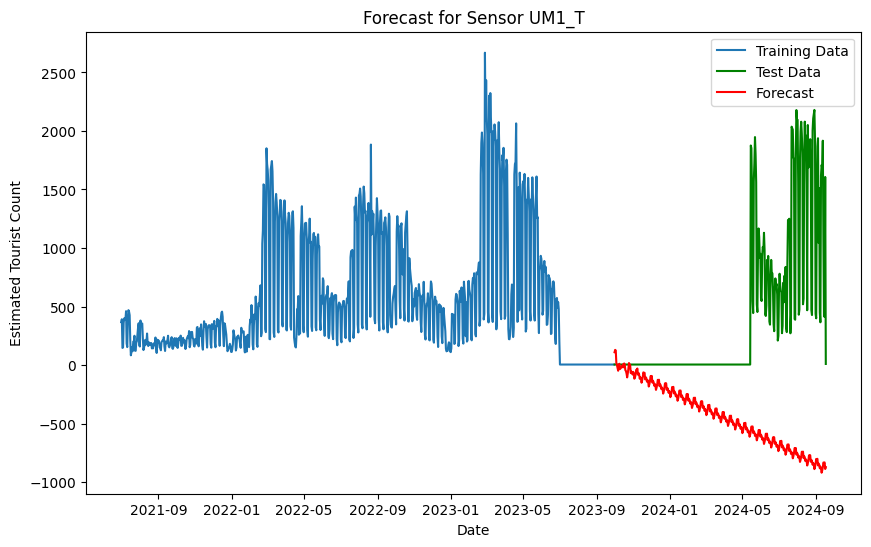

Processing sensor: UM2_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor UM2_T: 10846.834039277883
BIC for sensor UM2_T: 10879.704631697292
RMSE for sensor UM2_T: 483.95942082711434
Forecast for sensor UM2_T:
2023-10-01    441.256552
2023-10-02    527.839384
2023-10-03    516.162835
2023-10-04    483.330006
2023-10-05    506.552431
                 ...    
2024-09-13    631.409115
2024-09-14    634.367211
2024-09-15    648.389987
2024-09-16    643.693770
2024-09-17    617.008064
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor UM2_T: 175.751511839219



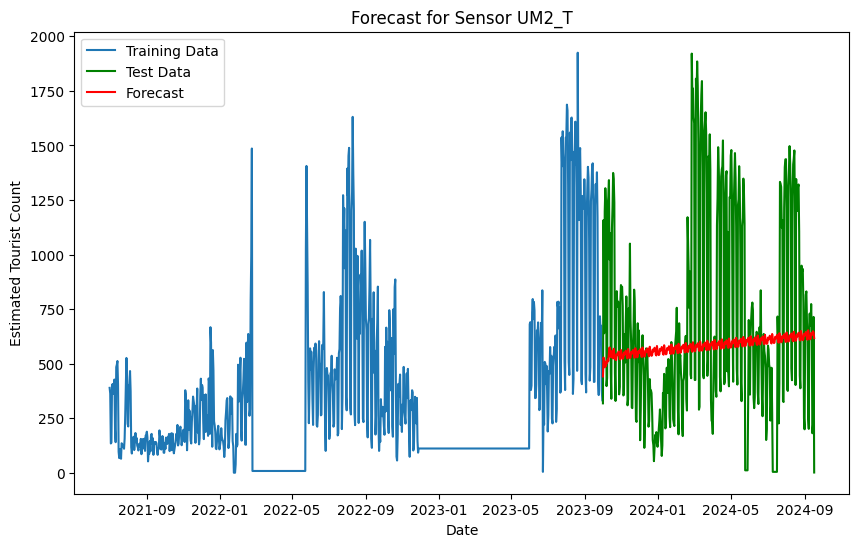

Processing sensor: UM3_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


AIC for sensor UM3_T: 9461.93159405694
BIC for sensor UM3_T: 9494.802186476349
RMSE for sensor UM3_T: 171.5704013827674
Forecast for sensor UM3_T:
2023-10-01    134.541391
2023-10-02    163.087287
2023-10-03    170.874931
2023-10-04    149.146321
2023-10-05    180.307842
                 ...    
2024-09-13    187.101895
2024-09-14    197.074379
2024-09-15    201.445770
2024-09-16    178.770465
2024-09-17    191.077055
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor UM3_T: 56.53566416282027



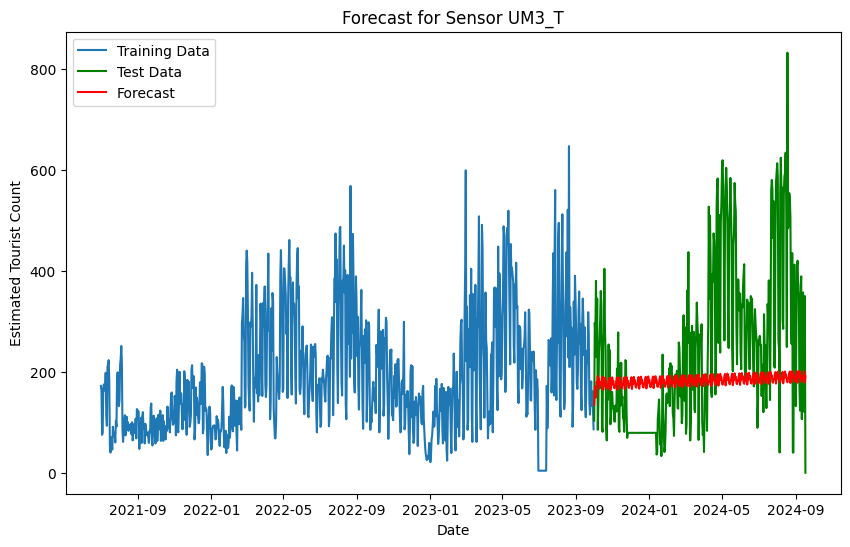

Processing sensor: VAC_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor VAC_T: 13004.19555347256
BIC for sensor VAC_T: 13037.06614589197
RMSE for sensor VAC_T: 942.170513725594
Forecast for sensor VAC_T:
2023-10-01    3429.050959
2023-10-02    3342.506050
2023-10-03    3419.092437
2023-10-04    3236.088014
2023-10-05    3125.976679
                 ...     
2024-09-13    3386.719069
2024-09-14    3324.086080
2024-09-15    3369.733520
2024-09-16    3285.322037
2024-09-17    3249.828699
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor VAC_T: -179.22226027246506



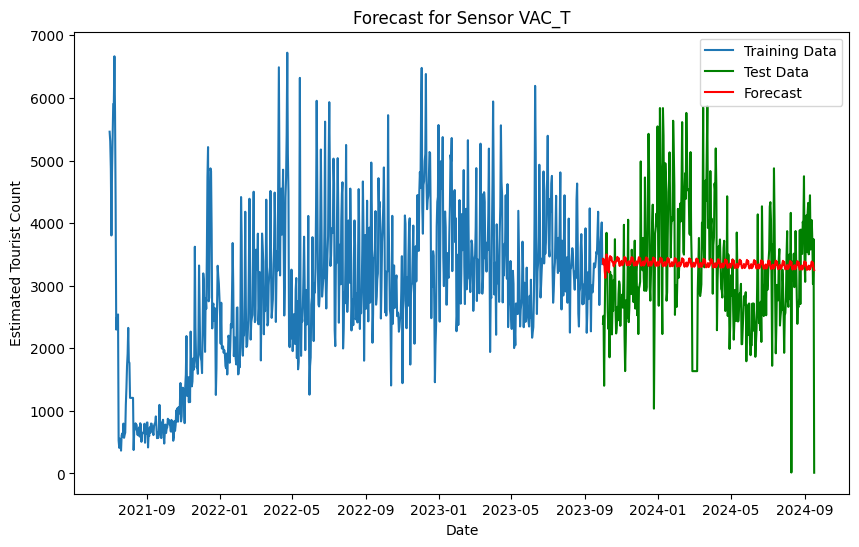

Processing sensor: Vic_T
AIC for sensor Vic_T: 10414.561560996786
BIC for sensor Vic_T: 10447.432153416195
RMSE for sensor Vic_T: 345.0064702728621
Forecast for sensor Vic_T:
2023-10-01    711.651696
2023-10-02    738.868280
2023-10-03    667.084258
2023-10-04    646.894213
2023-10-05    582.758171
                 ...    
2024-09-13    800.981427
2024-09-14    795.632732
2024-09-15    802.410144
2024-09-16    791.781622
2024-09-17    802.215097
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor Vic_T: 90.56340115475109



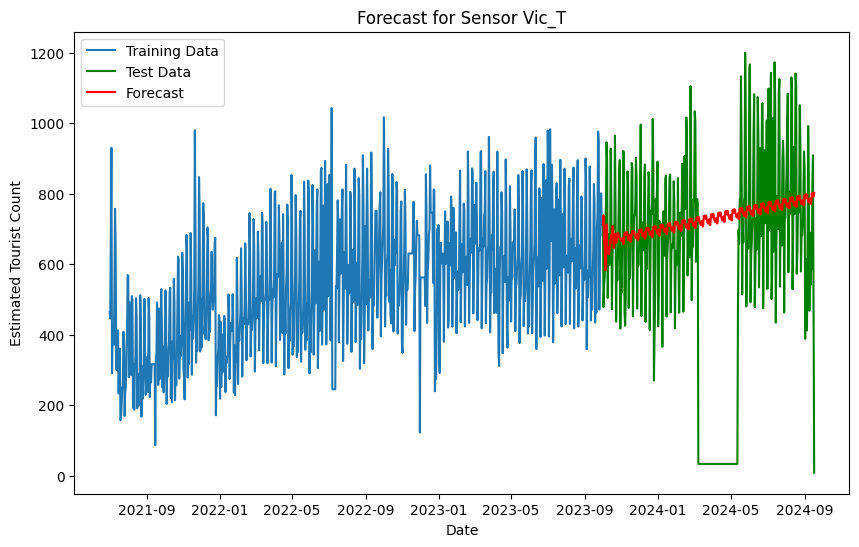

Processing sensor: WatCit_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor WatCit_T: 11749.2477774795
BIC for sensor WatCit_T: 11782.11836989891
RMSE for sensor WatCit_T: 430.03113634805425
Forecast for sensor WatCit_T:
2023-10-01    507.772219
2023-10-02    548.583233
2023-10-03    525.669505
2023-10-04    500.741316
2023-10-05    402.838555
                 ...    
2024-09-13    419.134232
2024-09-14    447.728041
2024-09-15    439.877557
2024-09-16    422.827082
2024-09-17    358.909630
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor WatCit_T: -148.86258884509385



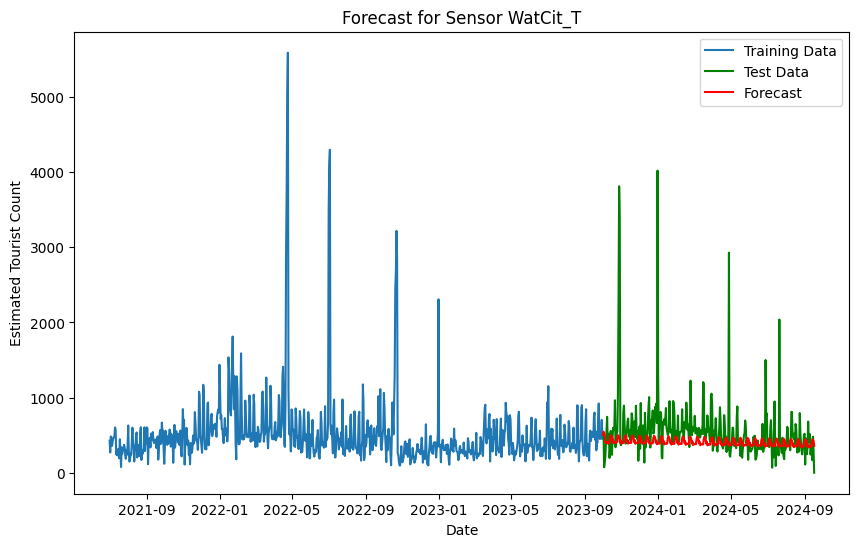

Processing sensor: WebBN_T


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor WebBN_T: 10471.437867979672
BIC for sensor WebBN_T: 10504.308460399081
RMSE for sensor WebBN_T: 249.54291124763614
Forecast for sensor WebBN_T:
2023-10-01     928.646512
2023-10-02     999.105986
2023-10-03     974.925868
2023-10-04     974.785376
2023-10-05     952.032130
                 ...     
2024-09-13    1136.850099
2024-09-14    1168.296819
2024-09-15    1160.618930
2024-09-16    1158.042208
2024-09-17    1130.750592
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor WebBN_T: 202.10407942819825



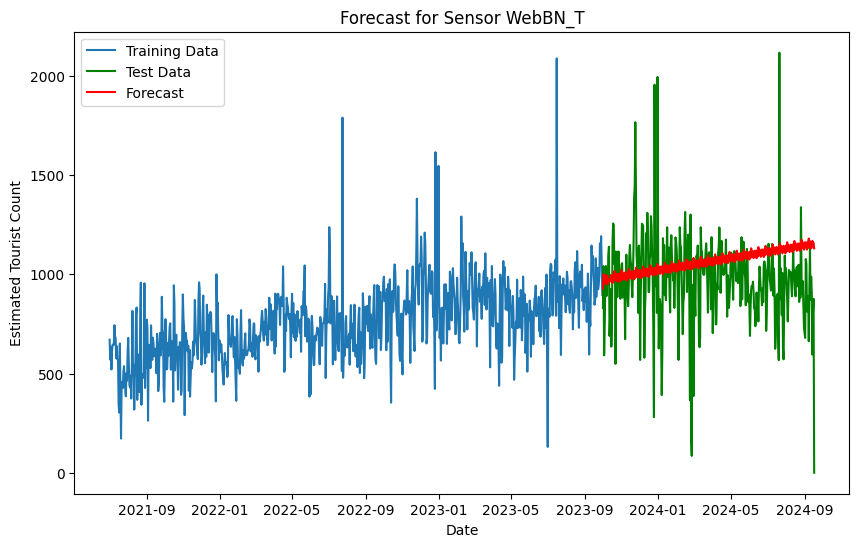

Processing sensor: WestWP_T


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC for sensor WestWP_T: 8780.491811482178
BIC for sensor WestWP_T: 8813.362403901587
RMSE for sensor WestWP_T: 44.961538694795465
Forecast for sensor WestWP_T:
2023-10-01     92.236990
2023-10-02    102.596051
2023-10-03    111.155950
2023-10-04    118.558131
2023-10-05    109.684977
                 ...    
2024-09-13    109.227333
2024-09-14    107.212436
2024-09-15    109.353444
2024-09-16    115.917587
2024-09-17    101.978612
Freq: D, Name: predicted_mean, Length: 353, dtype: float64

Forecast Increase for sensor WestWP_T: 9.741621727016337



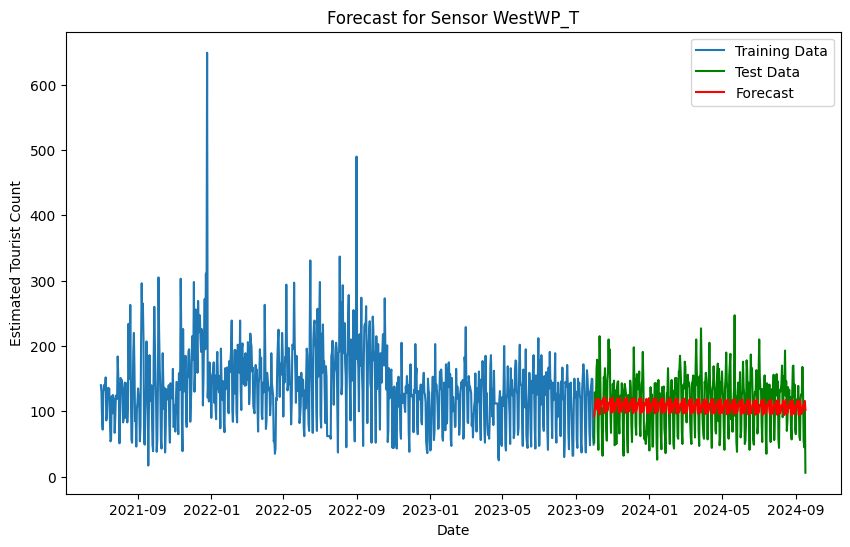

In [26]:
# ARIMA model
results = []
sensor_groups = data_1_3_estimation.groupby('sensor_name')
# Time serires model fit and forcast for each areas
for sensor_name, group in sensor_groups:
    if len(group) >= 10:
        print(f"Processing sensor: {sensor_name}")
        ts_data = group.set_index('year_day')['estimated_tourist_count']
        ts_data = ts_data.asfreq('D')
        ts_data = ts_data.ffill()
        ts_data = ts_data.astype(int)

        # Data split
        train_size = int(len(ts_data) * 0.7)
        train, test = ts_data[:train_size], ts_data[train_size:]

        # SARIMA
        model = SARIMAX(train, order=(2, 1, 2), seasonal_order=(1, 1, 1, 12))
        # model = ARIMA(train, order=(3, 1, 2)) Arima model
        model_fit = model.fit()

        # Prediction for test data
        forecast = model_fit.forecast(steps=len(test))

        # RMSE
        rmse = np.sqrt(mean_squared_error(test, forecast))

        # Forcast_increase
        forecast_increase = forecast.iloc[-1] - forecast.iloc[0]

        # AIC, BIC
        aic = model_fit.aic
        bic = model_fit.bic
        print(f"AIC for sensor {sensor_name}: {aic}")
        print(f"BIC for sensor {sensor_name}: {bic}")

        # Results
        results.append({
            'sensor_name': sensor_name,
            'rmse': rmse,
            'forecast_increase': forecast_increase,
        })

        # Results print
        print(f"RMSE for sensor {sensor_name}: {rmse}")
        print(f"Forecast for sensor {sensor_name}:\n{forecast}\n")
        print(f"Forecast Increase for sensor {sensor_name}: {forecast_increase}\n")

        # Visualization
        plt.figure(figsize=(10, 6))
        plt.plot(train.index, train, label='Training Data')
        plt.plot(test.index, test, label='Test Data', color='green')
        plt.plot(test.index, forecast, label='Forecast', color='red')
        plt.title(f'Forecast for Sensor {sensor_name}')
        plt.xlabel('Date')
        plt.ylabel('Estimated Tourist Count')
        plt.legend()
        plt.show()


    else:
        print(f"Skipping sensor {sensor_name} due to insufficient data.")

# result
results_df = pd.DataFrame(results)

Perform time series prediction for each sensor using daily pedestrian data and the estimated tourist data.

In [27]:
# Filtering the top 10 sensors
top_10 = results_df.sort_values(by='rmse').nlargest(10, 'forecast_increase')
print(top_10)

   sensor_name         rmse  forecast_increase
23    Col700_T  1753.170327        3023.296543
63      RMIT_T  1659.274072        2049.594714
60       QVN_T  1170.318378        1466.542436
21    Col620_T   976.372848        1394.464178
76       Swa31  4153.878751        1290.145887
24      ElFi_T  1069.836633        1161.107265
55      MCEC_T  1379.774349        1106.678755
73    Swa123_T  1626.819741        1100.877376
25    Eli250_T  1075.237477         964.489569
75    Swa295_T  1479.962155         922.407188


List the top 10 sensors where the number of tourists is expected to increase the most by calculating the difference between the first and last predicted values.

In [28]:
# 'top_10_results'
data_for_join  = data_1_1_estimation.drop_duplicates(subset=['sensor_name'], keep='first')
# 'left join'
top_10_results = pd.merge(top_10, data_for_join, on='sensor_name', how='left')
print(top_10_results)

  sensor_name         rmse  forecast_increase  year_month  \
0    Col700_T  1753.170327        3023.296543  2021-07-31   
1      RMIT_T  1659.274072        2049.594714  2021-07-31   
2       QVN_T  1170.318378        1466.542436  2021-07-31   
3    Col620_T   976.372848        1394.464178  2021-07-31   
4       Swa31  4153.878751        1290.145887  2021-07-31   
5      ElFi_T  1069.836633        1161.107265  2021-07-31   
6      MCEC_T  1379.774349        1106.678755  2021-07-31   
7    Swa123_T  1626.819741        1100.877376  2021-07-31   
8    Eli250_T  1075.237477         964.489569  2021-07-31   
9    Swa295_T  1479.962155         922.407188  2021-07-31   

                     location  pedestriancount   latitude   longitude  \
0  -37.81982992, 144.95102555            82497 -37.819830  144.951026   
1  -37.80825648, 144.96304859           137066 -37.808256  144.963049   
2  -37.81057846, 144.96444294           327068 -37.810578  144.964443   
3  -37.81887963, 144.95449198       

Rematch the top_10 results with location , the pedestrian couting, and estimated tourist couting data.

In [29]:
# 'Find the closest tourist location for each sensor based on 'top_10_results'
matching_results = []

# 'top_10_results'
for i, row_sensor in top_10_results.iterrows():
    min_distance = float('inf')
    closest_location = None
    closest_arttype = None
    closest_lat = None
    closest_lon = None

    # 'tourist spots'
    for j, row_tourist in data_3_cleaned.iterrows():
        distance = haversine(row_sensor['latitude'], row_sensor['longitude'],
                             row_tourist['latitude'], row_tourist['longitude'])

        # updating tourist spots
        if distance < min_distance:
            min_distance = distance
            closest_location = row_tourist['name']
            closest_arttype = row_tourist['asset_type']
            closest_lat = row_tourist['latitude']
            closest_lon = row_tourist['longitude']

    # Save results
    matching_results.append({
        'sensor_name': row_sensor['sensor_name'],
        'sensor_latitude': row_sensor['latitude'],
        'sensor_longitude': row_sensor['longitude'],
        'closest_tourist_location': closest_location,
        'arttype': closest_arttype,
        'tourist_latitude': closest_lat,
        'tourist_longitude': closest_lon,
        'distance_km': min_distance
    })

# Printing result
matching_results_df = pd.DataFrame(matching_results)
print(matching_results_df)

  sensor_name  sensor_latitude  sensor_longitude  \
0    Col700_T       -37.819830        144.951026   
1      RMIT_T       -37.808256        144.963049   
2       QVN_T       -37.810578        144.964443   
3    Col620_T       -37.818880        144.954492   
4       Swa31       -37.816686        144.966897   
5      ElFi_T       -37.817980        144.965034   
6      MCEC_T       -37.824018        144.956044   
7    Swa123_T       -37.814880        144.966088   
8    Eli250_T       -37.812585        144.962578   
9    Swa295_T       -37.811015        144.964295   

          closest_tourist_location   arttype  tourist_latitude  \
0                        Feng Shui       Art        -37.819823   
1           Architectural Fragment       Art        -37.809828   
2                    Painted Poles       Art        -37.810347   
3                            Eagle       Art        -37.820725   
4    Beyond the Ocean of Existence       Art        -37.816424   
5  Captain Matthew Flinders Sta

Match the top_10 sensors with the closest tourist spots.

In [33]:
# color list for matched data
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred',
          'beige', 'darkblue', 'darkgreen']

# Creating a map
map_top_10 = folium.Map(location=[-37.80841814, 144.95906317], zoom_start=14, width=1000, height=600, control_scale=True)
# top_10_results
for index, row in matching_results_df.iterrows():
    color = colors[index % len(colors)]
    # sensor_location
    folium.CircleMarker(
        location=[row['sensor_latitude'], row['sensor_longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Sensor: {row['sensor_name']}<br>Count: {row['distance_km']:.2f} km to closest tourist spot",
    ).add_to(map_top_10)

    # tourist spots
    folium.Marker(
        location=[row['tourist_latitude'], row['tourist_longitude']],
        popup=f"Name: {row['closest_tourist_location']}<br>Type: {row['arttype']}",
        icon=folium.Icon(color=color, icon='info-sign')
    ).add_to(map_top_10)


# Adding a legend
legend_html_2 = '''
<div style="position: fixed;
     top: 10px; left: 10px; width: 150px; height: 90px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color: white; padding: 10px;">
     <b>Legend</b><br>
     <i style="color:green;" class="fa fa-circle"></i> Nearest Sensor to Tourist Spot<br>
     <i style="color:green;" class="fa fa-info-circle"></i> Top 10 Tourist Spots</div>
'''
map_top_10.get_root().html.add_child(folium.Element(legend_html_2))

# Map save
map_top_10.save('map_top_10.html')
# Display map
display(map_top_10)

Visualize the matching of top_10 sensors and tourist spots on a map.

**K-means clustering**

In [34]:
# Aggregate by sensor_name and calculate the total.
data_1_1_estimation_sum = data_1_1_estimation.groupby('sensor_name').agg({
    'pedestriancount': 'sum',
    'estimated_tourist_count': 'sum',
    'latitude': 'first',
    'longitude': 'first'
}).reset_index()

print(data_1_1_estimation_sum)

   sensor_name  pedestriancount  estimated_tourist_count   latitude  \
0    261Will_T          4654198               921531.204 -37.812958   
1    280Will_T          2118083               419380.434 -37.812463   
2      474Fl_T          1255299               248549.202 -37.819973   
3     488Mac_T          1973997               390851.406 -37.794324   
4     574Qub_T          1302639               257922.522 -37.803100   
..         ...              ...                      ...        ...   
83       VAC_T         17932918              3550717.764 -37.821299   
84       Vic_T          3242335               641982.330 -37.806069   
85    WatCit_T          3109574               615695.652 -37.815650   
86     WebBN_T          4883437               966920.526 -37.822935   
87    WestWP_T           771742               152804.916 -37.812358   

     longitude  
0   144.956788  
1   144.956902  
2   144.958349  
3   144.929734  
4   144.949081  
..         ...  
83  144.968793  
84  144.956

In [35]:
# Min-Max normalization
scaler = MinMaxScaler()
data_1_1_estimation_sum[['pedestriancount', 'estimated_tourist_count']] = scaler.fit_transform(data_1_1_estimation_sum[['pedestriancount', 'estimated_tourist_count']])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


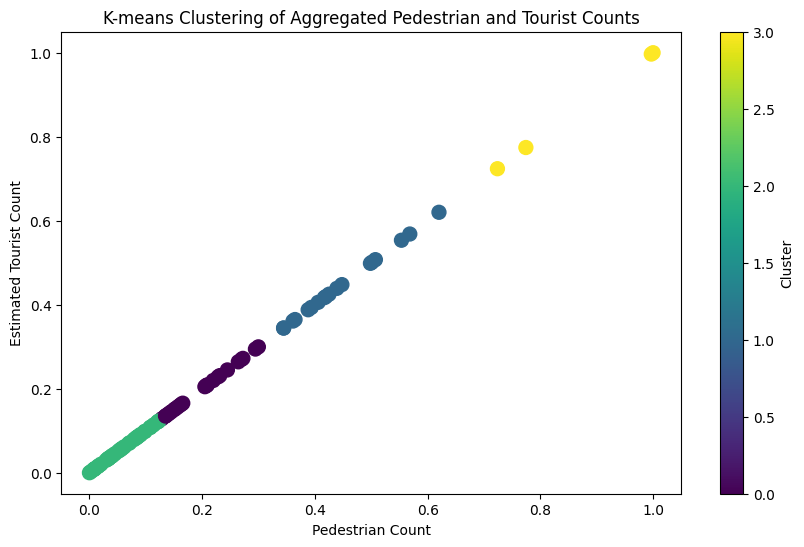

Silhouette Score: 0.58


In [36]:
data_1_1_estimation_cluster = data_1_1_estimation_sum.copy()
X = data_1_1_estimation_cluster[['pedestriancount', 'estimated_tourist_count']]

# K-means clustering model
kmeans = KMeans(n_clusters=4, random_state=0)
data_1_1_estimation_cluster['cluster'] = kmeans.fit_predict(X)

# visualization
plt.figure(figsize=(10, 6))
plt.scatter(data_1_1_estimation_cluster['pedestriancount'], data_1_1_estimation_cluster['estimated_tourist_count'],
            c=data_1_1_estimation_cluster['cluster'], cmap='viridis', s=100)
plt.xlabel('Pedestrian Count')
plt.ylabel('Estimated Tourist Count')
plt.title('K-means Clustering of Aggregated Pedestrian and Tourist Counts')
plt.colorbar(label='Cluster')
plt.show()

from sklearn.metrics import silhouette_score
score = silhouette_score(X, data_1_1_estimation_cluster['cluster'])
print(f'Silhouette Score: {score:.2f}')

Perform K-means clustering to visually identify patterns in the relationship between pedestrian count and estimated tourist count.

In [46]:
# K-means
kmeans = KMeans(n_clusters=4, random_state=0)
data_1_1_estimation_cluster['cluster'] = kmeans.fit_predict(data_1_1_estimation_cluster[['pedestriancount', 'estimated_tourist_count']])

# color list
colors = [ 'purple', 'blue', 'green', 'yellow']

# Creating a map
map_clusters = folium.Map(location=[-37.8136, 144.9631], zoom_start=14, width=1000, height=600, control_scale=True)
for index, row in data_1_1_estimation_cluster.iterrows():
    color = colors[row['cluster']]

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=7,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        popup=f"Sensor: {row['sensor_name']}<br>Cluster: {row['cluster']}<br>Pedestrian Count: {row['pedestriancount']}<br>Estimated Tourist Count: {row['estimated_tourist_count']}"
    ).add_to(map_clusters)

# Adding a legend
legend_html_3 = '''
<div style="position: fixed;
     top: 10px; left: 10px; width: 200px; height: 120px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color: white; padding: 10px;">
     <b>Legend</b><br>
     <i style="color:yellow;" class="fa fa-circle"></i> Cluster 0: Most crowded<br>
     <i style="color:blue;" class="fa fa-circle"></i> Cluster 1: Second<br>
     <i style="color:purple;" class="fa fa-circle"></i> Cluster 2: Third<br>
     <i style="color:green;" class="fa fa-circle"></i> Cluster 3: Least
</div>
'''

map_clusters.get_root().html.add_child(folium.Element(legend_html_3))


# Displying the map
map_clusters.save('map_clusters.html')
display(map_clusters)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Apply K-means clustering on a map to identify patterns in specific areas.

In [47]:
# Mean value of each cluster
cluster_means = data_1_1_estimation_cluster.groupby('cluster')[['estimated_tourist_count']].mean()
# Result
print(cluster_means)

         estimated_tourist_count
cluster                         
0                       0.196986
1                       0.444419
2                       0.057633
3                       0.873733


The clusters are in the order of yellow, blue, purple, and green, starting from cluster 0. Check the mean values for each cluster to understand their characteristics.

# Conclusion

**Findings**



  There was a strong correlation between the sum of pedestrian counts from all sensors and the total number of tourists in Melbourne. While this might seem like an expected result, the fact that the ratio is consistently similar is a meaningful finding, especially considering the difficulty of extracting only the tourist numbers from the data.



  The time series prediction results indicate that the top 10 areas with the highest expected increase in tourists are mostly around Swanston Street and Flinders Street Station. The clustering results also show that the two clusters with the highest number of tourists are primarily located around Swanston Street, Flinders Street Station, and Southern Cross Station.

**Limitations**


   To accurately determine the number of tourists in each area, I understand that various factors, such as local events, specific characteristics, and weather conditions, can significantly affect tourist numbers. However, because of the limited availability of such data, I had to rely solely on pedestrian counts from each sensor and the total number of tourists in Melbourne, which introduces clear limitations to the accuracy of our findings.


  The definition and scope of 'tourist spots' are somewhat vague. The data includes various fountains, monuments, and other sites in the Melbourne CBD, but we cannot assume that tourists visit these areas only for these attractions. This makes it difficult to determine how much these locations actually attract tourists. Additionally, because tourists may have different reasons or purposes for visiting, the lack of a clear definition of 'tourist spots' makes it hard to understand their true movement patterns.



#References

[1] Sheng, Q., Jiao, J., & Pang, T. (2021). Understanding the impact of street patterns on pedestrian distribution: A case study in Tianjin, China. https://link.springer.com/article/10.1007/s40864-021-00152-9#Sec9

[2] Fu, L., Yao, Y., Liu, L., & Chen, R. (2024). Study on influencing factors of tourist flow in scenic spots based on big data. https://www.researchsquare.com/article/rs-3201240/v1

[3] Visit Victoria. (2024). Visit Victoria. https://www.visitvictoria.com/